In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.errors import InvalidArgumentError
import tensorflow as tf


# Tensorflow GPU settings
# gpu_options = tf.GPUOptions(allow_growth=True)#per_process_gpu_memory_fraction=0.5)
# sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))
physical_devices = tf.config.list_physical_devices('GPU') 
tf.config.experimental.set_memory_growth(physical_devices[0], True)

from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.utils import shuffle

from scipy import interpolate

import keras_tuner as kt
import sys

2022-03-03 06:11:24.613732: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2022-03-03 06:11:25.439343: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-03-03 06:11:25.440141: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2022-03-03 06:11:25.456744: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 4000 computeCapability: 7.5
coreClock: 1.545GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 387.49GiB/s
2022-03-03 06:11:25.456777: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2022-03-03 06:11:25.458202: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2022-0

Define functions

In [2]:
def yield_and_error(df):
    '''
    input: 
    df  : dataframe
    
    output:
    yield (significance, error)
    '''
    Y  = -1
    dY = -1
    Y  = sum(df.wgt)
    dY = np.sqrt(sum(df.wgt**2))
    # return tuple
    return Y, dY


def significance_and_error(S, dS, B, dB):
    '''
    input: 
    S  : signal
    dS : signal error
    B  : background
    dB : background error
    
    output:
    tuple (significance, error)
    '''
    # FAKE SIGNIFICANCE
#     significance = S/np.sqrt(B)
#     error        = np.sqrt( 1/B*(dS**2) + (S**2)/(4*B**3)*(dB**2) )
#     return significance, error
    
    # REAL SIGNIFICANCE
    # if a quantity is negative, return 0
    if (S<=0 or B<=0):
        return 0, 0
#     S = np.abs(S)
#     B = np.abs(B)
    # calculate the significance and its error
    significance = np.sqrt( 2*((S + B)*np.log(1 + S/B) - S) )
    dSignifdS    = np.log(1 + S/B)/significance
    dSignifdB    = ( np.log(1 + S/B) - S/B )/significance
    error        = np.sqrt( (dSignifdS*dS)**2 + (dSignifdB*dB)**2 )
    # return tuple
    return significance, error


def add_in_quadrature_3( XdX, YdY, ZdZ ):
    '''
    input: 
    XdX : tuple (significance, error)
    YdY : tuple (significance, error)
    ZdZ : tuple (significance, error)
    
    output:
    tuple (significance, error) added in quadrature
    '''
    # unpack the significances
    x, dx = XdX
    y, dy = YdY
    z, dz = ZdZ
    # calculate the addition in quadrature and its error
    quadrature_sum   = np.sqrt(x**2 + y**2 + z**2)
    A                = (x**2)*(dx**2) + (y**2)*(dy**2) + (z**2)*(dz**2)
    B                = (x**2) + (y**2) + (z**2)
    if (quadrature_sum==0):
        return 0, 0
    quadrature_error = np.sqrt( A / B )
    # return tuple
    return quadrature_sum, quadrature_error


def add_in_quadrature_n( my_inputs ):
    '''
    input: 
    a list of the type [XdX, YdY, ZdZ, etc.]
    where
    XdX : tuple (significance, error)
    YdY : tuple (significance, error)
    ZdZ : tuple (significance, error)
    
    output:
    tuple (significance, error) added in quadrature
    '''
    # unpack the significances
    values = np.array([])
    errors = np.array([])
    for i in range(len(my_inputs)):
        x, dx = my_inputs[i]
        values = np.append(values, x)
        errors = np.append(errors, dx)
    # calculate the addition in quadrature and its error
    quadrature_sum = np.sqrt(sum(values**2))
    
    A = sum((values**2)*(errors**2))
    B = sum(values**2)
    
#     quadrature_sum   = np.sqrt(x**2 + y**2 + z**2)
#     A                = (x**2)*(dx**2) + (y**2)*(dy**2) + (z**2)*(dz**2)
#     B                = (x**2) + (y**2) + (z**2)
    if (quadrature_sum==0):
        return 0, 0
    quadrature_error = np.sqrt( A / B )
    # return tuple
    return quadrature_sum, quadrature_error


def total_significance_and_error( df_sig, df_bg ):
    
    m_list = []
    for sr in [0,1,2]:
        S, dS = yield_and_error(df_sig[df_sig.SR == sr])
        B, dB = yield_and_error( df_bg[ df_bg.SR == sr])
        m_list.append(significance_and_error(S, dS, B, dB))
    significance, error = add_in_quadrature_3(m_list[0], m_list[1], m_list[2])
    return significance, error

def print_total_significance_and_error( df_sig, df_bg ):
    
    m_list = []
    for sr in [0,1,2]:
        S, dS = yield_and_error(df_sig[df_sig.SR == sr])
        print("--- S = {:.2f} ± {:.2f} ".format(S, dS))
        B, dB = yield_and_error( df_bg[ df_bg.SR == sr])
        print("--- B = {:.2f} ± {:.2f} ".format(B, dB))
        m_list.append(significance_and_error(S, dS, B, dB))
    significance, error = add_in_quadrature_3(m_list[0], m_list[1], m_list[2])
    print("SF-inZ significance = {:.2f} ± {:.2f} ".format(m_list[0][0], m_list[0][1]))
    print("SF-noZ significance = {:.2f} ± {:.2f} ".format(m_list[1][0], m_list[1][1]))
    print("DF significance     = {:.2f} ± {:.2f} ".format(m_list[2][0], m_list[2][1]))
    print("Total significance  = {:.2f} ± {:.2f} ".format(significance, error))


test

In [28]:
add_in_quadrature_3((0.92,0.04),(1.34,0.12),(2.48,0.14))

(2.9651981384049195, 0.12963516993828447)

In [4]:
add_in_quadrature_n([(1.2,0.1),(1.6,0.2),(2.4,0.2),(3.4,0.1)])

(4.6173585522460785, 0.14733403229794106)

# Real ML starts here

In [5]:
this_channel = '20220301_ELReLMIs54_MUReLMIs31_btag77'

sig = pd.read_feather('/home/grabanal/WVZ/gabriel_ML_data/' + this_channel + '_VVZ_RD.arrow')
sig = sig[sig.SR == 2]
sig['is_signal'] = True
sig = sig.reset_index(drop=True)

bg = pd.read_feather('/home/grabanal/WVZ/gabriel_ML_data/' + this_channel + '_FULLBG_RD.arrow')
bg = bg[bg.SR == 2]
bg['is_signal'] = False
bg = bg.reset_index(drop=True)

name = 'trained_in_SR2'

In [6]:
print(len(sig), len(bg))
print(sum(sig.wgt), sum(bg.wgt))

9650 18114
6.358383365092591 31.400276552423502


In [7]:
print_total_significance_and_error(sig, bg)

--- S = 0.00 ± 0.00 
--- B = 0.00 ± 0.00 
--- S = 0.00 ± 0.00 
--- B = 0.00 ± 0.00 
--- S = 6.36 ± 0.12 
--- B = 31.40 ± 2.41 
SF-inZ significance = 0.00 ± 0.00 
SF-noZ significance = 0.00 ± 0.00 
DF significance     = 1.10 ± 0.04 
Total significance  = 1.10 ± 0.04 


In [8]:
sig.columns

Index(['index', 'Wlep1_phi', 'jet_eta_3', 'jet_btagCont_2', 'Zlep1_phi',
       'Wlep1_ambiguous', 'leptonic_HT', 'Zlep2_pt', 'jet_m_2', 'jet_pt_2',
       'lep4_ambiguous', 'METSig', 'jet_eta_4', 'jet_m_3', 'Zlep2_phi', 'MET',
       'other_mass', 'jet_m_4', 'Wlep2_pid', 'jet_eta_1', 'Wlep1_dphi',
       'Zlep1_pt', 'eta_3', 'eta_4', 'jet_pt_4', 'METPhi', 'wgt', 'jet_eta_2',
       'phi_4', 'v_j_btag70', 'phi_1', 'jet_btagCont_4', 'jet_phi_2',
       'jet_phi_3', 'Wlep2_ambiguous', 'Zlep1_dphi', 'Zlep1_pid', 'lep4_pid',
       'mass_4l', 'Zlep2_pid', 'pt_4l', 'lep1_ambiguous', 'SR', 'Wlep1_pt',
       'lep2_pid', 'Wlep1_pid', 'v_j_btag77', 'Wlep2_phi', 'chisq',
       'Zlep1_ambiguous', 'jet_pt_3', 'jet_m_1', 'eta_1', 'v_j_btag85',
       'jet_btagCont_3', 'total_HT', 'Zlep2_ambiguous', 'lep3_ambiguous',
       'Zlep1_eta', 'Zlep2_dphi', 'lep3_pid', 'jet_btagCont_1', 'HT', 'pt_2',
       'pt_4', 'pt_3', 'Wlep1_eta', 'Wlep2_dphi', 'phi_3', 'Zlep2_eta',
       'jet_pt_1', 'pt_1', 'jet_p

In [9]:

lep_dphi_cols = ['Zlep1_pt', 'Zlep1_eta', 'Zlep1_dphi', 
                 'Zlep2_pt', 'Zlep2_eta', 'Zlep2_dphi', 
                 'Wlep1_pt', 'Wlep1_eta', 'Wlep1_dphi', 
                 'Wlep2_pt', 'Wlep2_eta', 'Wlep2_dphi', 
                 'Zlep1_pid', 'Zlep2_pid', 'Wlep1_pid','Wlep2_pid', 
                 'pt_1', 'pt_2', 'pt_4', 'pt_3', 
                 'Zcand_mass', 'other_mass', 'mass_4l', 'pt_4l',
                 'leptonic_HT', 'HT',  'total_HT',   
                 'MET', 'METSig', 
                 'Njet',
                 'jet_pt_1', 'jet_pt_2', 'jet_pt_3', 'jet_pt_4',
                 'jet_eta_1', 'jet_eta_2', 'jet_eta_3', 'jet_eta_4',
                 'jet_m_1', 'jet_m_2', 'jet_m_3', 'jet_m_4',]

                 
# lep_dphi_cols = ['Zlep1_pt', 'Zlep1_eta' 'Zlep1_dphi', 
#                  'Zlep2_pt', 'Zlep2_eta' 'Zlep2_dphi', 
#                  'Wlep1_pt', 'Wlep1_eta' 'Wlep1_dphi', 
#                  'Wlep2_pt', 'Wlep2_eta' 'Wlep2_dphi', 
#                  'Zlep1_pid', 'Zlep2_pid', 'Wlep1_pid','Wlep2_pid', 
#                  'pt_1', 'pt_2', 'pt_4', 'pt_3', 
#                  'Zcand_mass', 'other_mass', 'mass_4l', 'pt_4l',
#                  'leptonic_HT', 'HT',  'total_HT',   
#                  'MET', 'METSig', 
#                  'Njet',
#                  'jet_pt_1', 'jet_pt_2', 'jet_pt_3', 'jet_pt_4',
#                  'jet_eta_1', 'jet_eta_2', 'jet_eta_3', 'jet_eta_4',
#                  'jet_m_1', 'jet_m_2', 'jet_m_3', 'jet_m_4',
#                  'jet_btagCont_1','jet_btagCont_2','jet_btagCont_3','jet_btagCont_4']

X = pd.concat([sig[lep_dphi_cols], bg[lep_dphi_cols]], ignore_index=True)

In [10]:
# Normalize inputs for NN training
min_max_scaler = preprocessing.MinMaxScaler()

min_max_scaler.fit(X)

for df in [sig, bg]:
    df[lep_dphi_cols] = min_max_scaler.transform(df[lep_dphi_cols])

In [11]:
sig['dummy_wgt'] = 1
bg['dummy_wgt']  = 1

In [12]:
# Split train and test data

# sig_train, sig_test = train_test_split(sig[lep_dphi_cols + ['wgt'] + ['SR']], train_size=0.5)
# bg_train, bg_test = train_test_split(bg[lep_dphi_cols + ['wgt'] + ['SR']], train_size=0.5)
sig_train, sig_test = train_test_split(sig[lep_dphi_cols + ['dummy_wgt'] + ['wgt'] + ['SR']], train_size=0.5)
bg_train,  bg_test  = train_test_split( bg[lep_dphi_cols + ['dummy_wgt'] + ['wgt'] + ['SR']], train_size=0.5)

n_sig = len(sig_train) # should be weighted?
n_bg = len(bg_train)

# weighted
n_sig = sum(sig_train['wgt']) 
n_bg = sum(bg_train['wgt'])

x_train = pd.concat([sig_train[lep_dphi_cols], bg_train[lep_dphi_cols]])
y_train = np.concatenate([np.ones(len(sig_train)), np.zeros(len(bg_train))]) # [1,1,...,0,0,...]
wgt_train = np.concatenate([sig_train['wgt'], bg_train['wgt']])
# Scaling the weight and dummy weights:
w_train = pd.Series(np.concatenate([(n_sig + n_bg) / n_sig * sig_train['wgt'], 
                                    (n_sig + n_bg) / n_bg  *  bg_train['wgt']]))
dummy_w_train = pd.Series(np.concatenate([(n_sig + n_bg) / n_sig * sig_train['dummy_wgt'], 
                                          (n_sig + n_bg) / n_bg  *  bg_train['dummy_wgt']]))
SR_train = np.concatenate([sig_train['SR'], bg_train['SR']])
# sklearn.utils import shuffle
x_train, y_train, wgt_train, w_train, dummy_w_train, SR_train = shuffle(x_train, y_train, wgt_train, w_train, dummy_w_train, SR_train)


n_sig = len(sig_test) 
n_bg = len(bg_test)

# weighted
n_sig = sum(sig_test['wgt']) 
n_bg = sum(bg_test['wgt'])


x_test = pd.concat([sig_test[lep_dphi_cols], bg_test[lep_dphi_cols]])
y_test = np.concatenate([np.ones(len(sig_test)), np.zeros(len(bg_test))])  # [1,1,...,0,0,...]
wgt_test = np.concatenate([sig_test['wgt'], bg_test['wgt']])
# Scaling the weight and dummy weights:
w_test = pd.Series(np.concatenate([(n_sig + n_bg) / n_sig * sig_test['wgt'], 
                                   (n_sig + n_bg) / n_bg  * bg_test['wgt']]))
dummy_w_test = pd.Series(np.concatenate([(n_sig + n_bg) / n_sig * sig_test['dummy_wgt'], 
                                         (n_sig + n_bg) / n_bg  *  bg_test['dummy_wgt']]))
SR_test = np.concatenate([sig_test['SR'], bg_test['SR']])


In [13]:
print(len(sig_train), len(bg_train), len(y_train), len(w_train))
print("Training sample")
print_total_significance_and_error(sig_train, bg_train)

4825 9057 13882 13882
Training sample
--- S = 0.00 ± 0.00 
--- B = 0.00 ± 0.00 
--- S = 0.00 ± 0.00 
--- B = 0.00 ± 0.00 
--- S = 3.21 ± 0.11 
--- B = 13.69 ± 0.67 
SF-inZ significance = 0.00 ± 0.00 
SF-noZ significance = 0.00 ± 0.00 
DF significance     = 0.84 ± 0.03 
Total significance  = 0.84 ± 0.03 


In [14]:
print(len(sig_test), len(bg_test), len(y_test), len(w_test))
print("Eval sample")
print_total_significance_and_error(sig_test, bg_test)

4825 9057 13882 13882
Eval sample
--- S = 0.00 ± 0.00 
--- B = 0.00 ± 0.00 
--- S = 0.00 ± 0.00 
--- B = 0.00 ± 0.00 
--- S = 3.15 ± 0.07 
--- B = 17.71 ± 2.32 
SF-inZ significance = 0.00 ± 0.00 
SF-noZ significance = 0.00 ± 0.00 
DF significance     = 0.73 ± 0.05 
Total significance  = 0.73 ± 0.05 


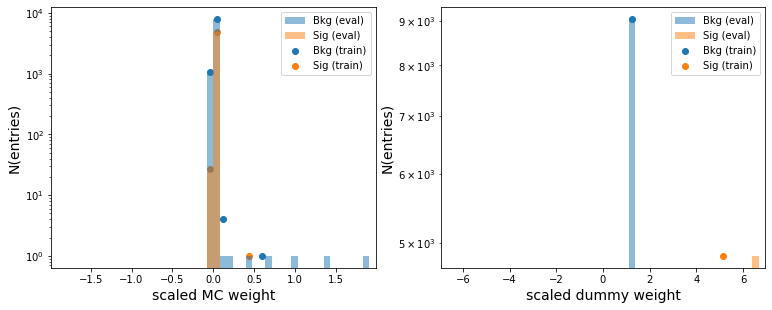

In [15]:
plt.figure(figsize=[2*6.4,1*4.8])

b = 50
ax = plt.subplot(1, 2, 1)
m = 1.05*np.max([np.max(abs(w_train)), np.max(abs(w_test))])
# plot test
_, b, _ = plt.hist(w_test[y_test==0], bins=b, alpha=0.5, range=(-m,m), label='Bkg (eval)')
_, b, _ = plt.hist(w_test[y_test==1], bins=b, alpha=0.5, range=(-m,m), label='Sig (eval)')
# plot train
bin_centers = (b[:-1]+b[1:])/2
w_train_bg  = np.histogram(w_train[y_train == 0], bins=b)[0]
w_train_sig = np.histogram(w_train[y_train == 1], bins=b)[0]
plt.scatter(bin_centers, w_train_bg,  label='Bkg (train)')
plt.scatter(bin_centers, w_train_sig, label='Sig (train)')
plt.xlim([-m,m])
plt.yscale('log')
plt.legend()
plt.xlabel('scaled MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)

b = 50
ax = plt.subplot(1, 2, 2)
m = 1.05*np.max([np.max(abs(dummy_w_train)), np.max(abs(dummy_w_test))])
# plot test
_, b, _ = plt.hist(dummy_w_test[y_test==0], bins=b, alpha=0.5, range=(-m,m), label='Bkg (eval)')
_, b, _ = plt.hist(dummy_w_test[y_test==1], bins=b, alpha=0.5, range=(-m,m), label='Sig (eval)')
bin_centers = (b[:-1]+b[1:])/2
# plot train
dummy_w_train_bg  = np.histogram(dummy_w_train[y_train == 0], bins=b)[0]
dummy_w_train_sig = np.histogram(dummy_w_train[y_train == 1], bins=b)[0]
plt.scatter(bin_centers, dummy_w_train_bg,  label='Bkg (train)')
plt.scatter(bin_centers, dummy_w_train_sig, label='Sig (train)')
plt.xlim([-m,m])
plt.yscale('log')
plt.legend()
plt.xlabel('scaled dummy weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)

plt.savefig('plots/scaled_weights_{}.pdf'.format(name))

plt.show()

Zoomed-in version of the normal MC weight, to see the substructure:

0.08971125227346768
0.0017942250454693537


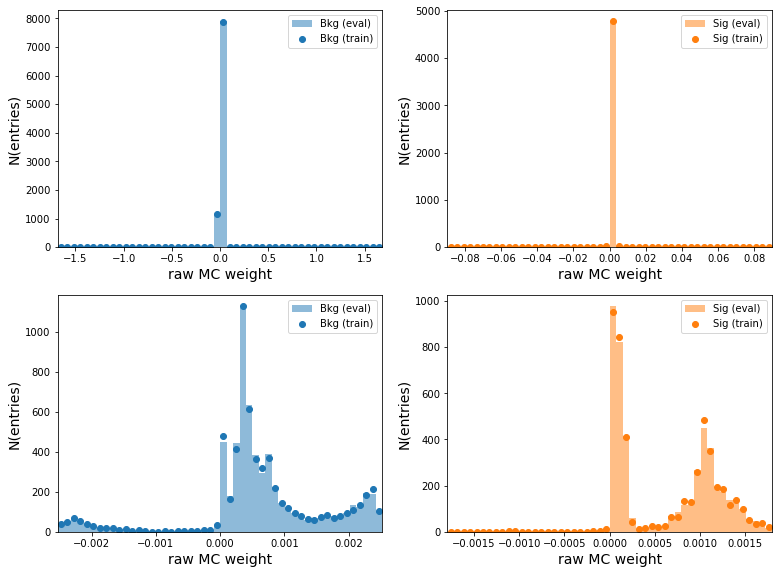

In [16]:
fig = plt.figure(figsize=[2*6.4,2*4.8])

b = 50
ax = plt.subplot(2, 2, 1)
m = 1.05*np.max([np.max(abs(wgt_train[y_train==0])), np.max(abs(wgt_test[y_test==0]))])
# plot test
_, b, _ = plt.hist(wgt_test[y_test==0], bins=b, alpha=0.5, range=(-m,m), label='Bkg (eval)')# plot train
bin_centers = (b[:-1]+b[1:])/2
wgt_train_bg  = np.histogram(wgt_train[y_train == 0], bins=b)[0]
plt.scatter(bin_centers, wgt_train_bg,  label='Bkg (train)')
plt.xlim([-m,m])
# plt.yscale('log')
plt.legend()
plt.xlabel('raw MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)

b = 50
ax = plt.subplot(2, 2, 2)
m = 1.05*np.max([np.max(abs(wgt_train[y_train==1])), np.max(abs(wgt_test[y_test==1]))])
print(m)
# plot test
_, b, _ = plt.hist(wgt_test[y_test==1], bins=b, alpha=0.5, range=(-m,m), label='Sig (eval)', color='C1')
# plot train
bin_centers = (b[:-1]+b[1:])/2
wgt_train_sig = np.histogram(wgt_train[y_train == 1], bins=b)[0]
plt.scatter(bin_centers, wgt_train_sig, label='Sig (train)', color='C1')
plt.xlim([-m,m])
# plt.yscale('log')
plt.legend()
plt.xlabel('raw MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)


b = 50
ax = plt.subplot(2, 2, 3)
m = 1.05*np.max([np.max(abs(wgt_train[y_train==0])), np.max(abs(wgt_test[y_test==0]))])*0.0015
# plot test
_, b, _ = plt.hist(wgt_test[y_test==0], bins=b, alpha=0.5, range=(-m,m), label='Bkg (eval)')# plot train
bin_centers = (b[:-1]+b[1:])/2
wgt_train_bg  = np.histogram(wgt_train[y_train == 0], bins=b)[0]
plt.scatter(bin_centers, wgt_train_bg,  label='Bkg (train)')
plt.xlim([-m,m])
# plt.yscale('log')
plt.legend()
plt.xlabel('raw MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)

b = 50
ax = plt.subplot(2, 2, 4)
m = 1.05*np.max([np.max(abs(wgt_train[y_train==1])), np.max(abs(wgt_test[y_test==1]))])*0.02
print(m)
# plot test
_, b, _ = plt.hist(wgt_test[y_test==1], bins=b, alpha=0.5, range=(-m,m), label='Sig (eval)', color='C1')
# plot train
bin_centers = (b[:-1]+b[1:])/2
wgt_train_sig = np.histogram(wgt_train[y_train == 1], bins=b)[0]
plt.scatter(bin_centers, wgt_train_sig, label='Sig (train)', color='C1')
plt.xlim([-m,m])
# plt.yscale('log')
plt.legend()
plt.xlabel('raw MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)

plt.savefig('plots/raw_weights_{}.pdf'.format(name))
plt.show()

# Fit ML classifier

In [17]:
use_mc_weights = True
# use_mc_weights = False

# Chop off the negative weights?

Train and evaluate!

In [35]:
# Fit ML classifier
EPOCHS = 10000
patience = 20
batch_size = 256
num_nodes = 64
dropout = 0.1
learn_rate = 1e-6

v_classifier = []
v_history = []

n_models = 10

x_test_results = x_test.copy()

for i in range(n_models):
    print("Running model", i)
    
    # Generate and fit model
    K.clear_session()

# Generate and fit model
    K.clear_session()
    classifier = Sequential()
    classifier.add(Dense(num_nodes, input_dim=x_train.shape[1], activation='relu')) 
    classifier.add(Dropout(dropout))
    classifier.add(Dense(num_nodes, activation='relu'))
    classifier.add(Dropout(dropout))
    classifier.add(Dense(num_nodes, activation='relu'))
    classifier.add(Dropout(dropout))
    classifier.add(Dense(1, activation='sigmoid'))

    opt = keras.optimizers.Adam(learning_rate=learn_rate)
    classifier.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

    # Early stopping
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)

    if (use_mc_weights):
        history = classifier.fit(x_train, y_train, epochs=EPOCHS, batch_size=batch_size,
                                validation_data=(x_test, y_test, w_test), sample_weight=w_train, 
                                verbose=1, callbacks=[callback])
    else:
        history = classifier.fit(x_train, y_train, epochs=EPOCHS, batch_size=batch_size,
                                validation_data=(x_test, y_test, dummy_w_test), sample_weight=dummy_w_train, 
                                verbose=1, callbacks=[callback])
    
    v_classifier.append(classifier)
    v_history.append(history)
    
    x_test_results['pred_' + str(i)] = classifier.predict(x_test, batch_size=batch_size)

Running model 0
Epoch 1/10000
55/55 [==============================] - 1s 8ms/step - loss: 0.0017 - accuracy: 0.5865 - val_loss: 0.0021 - val_accuracy: 0.6195
Epoch 2/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0018 - accuracy: 0.5835 - val_loss: 0.0021 - val_accuracy: 0.6192
Epoch 3/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5842 - val_loss: 0.0021 - val_accuracy: 0.6187
Epoch 4/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5913 - val_loss: 0.0021 - val_accuracy: 0.6187
Epoch 5/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5917 - val_loss: 0.0021 - val_accuracy: 0.6187
Epoch 6/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5869 - val_loss: 0.0021 - val_accuracy: 0.6186
Epoch 7/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5871 - val_loss: 0.0021 - val_

Epoch 58/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5693 - val_loss: 0.0021 - val_accuracy: 0.5998
Epoch 59/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5704 - val_loss: 0.0021 - val_accuracy: 0.5990
Epoch 60/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5634 - val_loss: 0.0021 - val_accuracy: 0.5984
Epoch 61/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5701 - val_loss: 0.0021 - val_accuracy: 0.5981
Epoch 62/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5625 - val_loss: 0.0021 - val_accuracy: 0.5982
Epoch 63/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5700 - val_loss: 0.0021 - val_accuracy: 0.5978
Epoch 64/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5753 - val_loss: 0.0021 - val_accuracy:

Epoch 115/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5484 - val_loss: 0.0021 - val_accuracy: 0.5779
Epoch 116/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5600 - val_loss: 0.0021 - val_accuracy: 0.5774
Epoch 117/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5500 - val_loss: 0.0021 - val_accuracy: 0.5772
Epoch 118/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5552 - val_loss: 0.0021 - val_accuracy: 0.5773
Epoch 119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5630 - val_loss: 0.0021 - val_accuracy: 0.5766
Epoch 120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5526 - val_loss: 0.0021 - val_accuracy: 0.5768
Epoch 121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5557 - val_loss: 0.0021 - val_ac

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5469 - val_loss: 0.0021 - val_accuracy: 0.5657
Epoch 172/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5437 - val_loss: 0.0021 - val_accuracy: 0.5653
Epoch 173/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5433 - val_loss: 0.0021 - val_accuracy: 0.5653
Epoch 174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5486 - val_loss: 0.0021 - val_accuracy: 0.5652
Epoch 175/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5416 - val_loss: 0.0021 - val_accuracy: 0.5653
Epoch 176/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5462 - val_loss: 0.0021 - val_accuracy: 0.5651
Epoch 177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5492 - val_loss: 0.0021 - val_accuracy: 0.5648
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5505 - val_loss: 0.0021 - val_accuracy: 0.5566
Epoch 228/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5350 - val_loss: 0.0021 - val_accuracy: 0.5567
Epoch 229/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5415 - val_loss: 0.0021 - val_accuracy: 0.5565
Epoch 230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5362 - val_loss: 0.0021 - val_accuracy: 0.5570
Epoch 231/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5358 - val_loss: 0.0021 - val_accuracy: 0.5571
Epoch 232/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5305 - val_loss: 0.0021 - val_accuracy: 0.5566
Epoch 233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5299 - val_loss: 0.0021 - val_accuracy: 0.5565
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5331 - val_loss: 0.0021 - val_accuracy: 0.5475
Epoch 284/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5297 - val_loss: 0.0021 - val_accuracy: 0.5474
Epoch 285/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5270 - val_loss: 0.0021 - val_accuracy: 0.5466
Epoch 286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5262 - val_loss: 0.0021 - val_accuracy: 0.5468
Epoch 287/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5206 - val_loss: 0.0021 - val_accuracy: 0.5468
Epoch 288/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5232 - val_loss: 0.0021 - val_accuracy: 0.5468
Epoch 289/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0018 - accuracy: 0.5244 - val_loss: 0.0021 - val_accuracy: 0.5468
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5277 - val_loss: 0.0021 - val_accuracy: 0.5403
Epoch 340/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5314 - val_loss: 0.0021 - val_accuracy: 0.5402
Epoch 341/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5344 - val_loss: 0.0021 - val_accuracy: 0.5405
Epoch 342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5351 - val_loss: 0.0021 - val_accuracy: 0.5403
Epoch 343/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5338 - val_loss: 0.0021 - val_accuracy: 0.5400
Epoch 344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5293 - val_loss: 0.0021 - val_accuracy: 0.5399
Epoch 345/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5370 - val_loss: 0.0021 - val_accuracy: 0.5400
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0018 - accuracy: 0.5333 - val_loss: 0.0020 - val_accuracy: 0.5349
Epoch 396/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5289 - val_loss: 0.0020 - val_accuracy: 0.5348
Epoch 397/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5251 - val_loss: 0.0020 - val_accuracy: 0.5349
Epoch 398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5320 - val_loss: 0.0020 - val_accuracy: 0.5349
Epoch 399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5304 - val_loss: 0.0020 - val_accuracy: 0.5345
Epoch 400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5334 - val_loss: 0.0020 - val_accuracy: 0.5346
Epoch 401/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5277 - val_loss: 0.0020 - val_accuracy: 0.5347
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5284 - val_loss: 0.0020 - val_accuracy: 0.5321
Epoch 452/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5295 - val_loss: 0.0020 - val_accuracy: 0.5321
Epoch 453/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5370 - val_loss: 0.0020 - val_accuracy: 0.5321
Epoch 454/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5233 - val_loss: 0.0020 - val_accuracy: 0.5321
Epoch 455/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5316 - val_loss: 0.0020 - val_accuracy: 0.5319
Epoch 456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5192 - val_loss: 0.0020 - val_accuracy: 0.5318
Epoch 457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5184 - val_loss: 0.0020 - val_accuracy: 0.5318
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5273 - val_loss: 0.0020 - val_accuracy: 0.5315
Epoch 508/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5398 - val_loss: 0.0020 - val_accuracy: 0.5313
Epoch 509/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5260 - val_loss: 0.0020 - val_accuracy: 0.5313
Epoch 510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5305 - val_loss: 0.0020 - val_accuracy: 0.5314
Epoch 511/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5258 - val_loss: 0.0020 - val_accuracy: 0.5314
Epoch 512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5312 - val_loss: 0.0020 - val_accuracy: 0.5316
Epoch 513/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5372 - val_loss: 0.0020 - val_accuracy: 0.5317
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5324 - val_loss: 0.0020 - val_accuracy: 0.5349
Epoch 564/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5368 - val_loss: 0.0020 - val_accuracy: 0.5351
Epoch 565/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5297 - val_loss: 0.0020 - val_accuracy: 0.5354
Epoch 566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5338 - val_loss: 0.0020 - val_accuracy: 0.5352
Epoch 567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5367 - val_loss: 0.0020 - val_accuracy: 0.5351
Epoch 568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5354 - val_loss: 0.0020 - val_accuracy: 0.5352
Epoch 569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5331 - val_loss: 0.0020 - val_accuracy: 0.5349
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5470 - val_loss: 0.0020 - val_accuracy: 0.5380
Epoch 620/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5343 - val_loss: 0.0020 - val_accuracy: 0.5382
Epoch 621/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5371 - val_loss: 0.0020 - val_accuracy: 0.5383
Epoch 622/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5337 - val_loss: 0.0020 - val_accuracy: 0.5383
Epoch 623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5294 - val_loss: 0.0020 - val_accuracy: 0.5384
Epoch 624/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5329 - val_loss: 0.0020 - val_accuracy: 0.5385
Epoch 625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5485 - val_loss: 0.0020 - val_accuracy: 0.5385
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5364 - val_loss: 0.0020 - val_accuracy: 0.5417
Epoch 676/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5394 - val_loss: 0.0020 - val_accuracy: 0.5417
Epoch 677/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5307 - val_loss: 0.0020 - val_accuracy: 0.5421
Epoch 678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5400 - val_loss: 0.0020 - val_accuracy: 0.5419
Epoch 679/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5328 - val_loss: 0.0020 - val_accuracy: 0.5423
Epoch 680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5310 - val_loss: 0.0020 - val_accuracy: 0.5422
Epoch 681/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5381 - val_loss: 0.0020 - val_accuracy: 0.5424
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5462 - val_loss: 0.0020 - val_accuracy: 0.5456
Epoch 732/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5482 - val_loss: 0.0020 - val_accuracy: 0.5455
Epoch 733/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5360 - val_loss: 0.0020 - val_accuracy: 0.5457
Epoch 734/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5517 - val_loss: 0.0020 - val_accuracy: 0.5457
Epoch 735/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5467 - val_loss: 0.0020 - val_accuracy: 0.5457
Epoch 736/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5453 - val_loss: 0.0020 - val_accuracy: 0.5455
Epoch 737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5428 - val_loss: 0.0020 - val_accuracy: 0.5454
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5431 - val_loss: 0.0020 - val_accuracy: 0.5496
Epoch 788/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5508 - val_loss: 0.0020 - val_accuracy: 0.5494
Epoch 789/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5539 - val_loss: 0.0020 - val_accuracy: 0.5496
Epoch 790/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5507 - val_loss: 0.0020 - val_accuracy: 0.5495
Epoch 791/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5445 - val_loss: 0.0020 - val_accuracy: 0.5494
Epoch 792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5433 - val_loss: 0.0020 - val_accuracy: 0.5498
Epoch 793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5415 - val_loss: 0.0020 - val_accuracy: 0.5499
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5510 - val_loss: 0.0020 - val_accuracy: 0.5535
Epoch 844/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5449 - val_loss: 0.0020 - val_accuracy: 0.5534
Epoch 845/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5567 - val_loss: 0.0020 - val_accuracy: 0.5536
Epoch 846/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5486 - val_loss: 0.0020 - val_accuracy: 0.5535
Epoch 847/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5464 - val_loss: 0.0020 - val_accuracy: 0.5537
Epoch 848/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5447 - val_loss: 0.0020 - val_accuracy: 0.5535
Epoch 849/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5421 - val_loss: 0.0020 - val_accuracy: 0.5537
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5557 - val_loss: 0.0020 - val_accuracy: 0.5576
Epoch 900/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5552 - val_loss: 0.0020 - val_accuracy: 0.5576
Epoch 901/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5492 - val_loss: 0.0020 - val_accuracy: 0.5583
Epoch 902/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5603 - val_loss: 0.0020 - val_accuracy: 0.5582
Epoch 903/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5493 - val_loss: 0.0020 - val_accuracy: 0.5583
Epoch 904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5565 - val_loss: 0.0020 - val_accuracy: 0.5583
Epoch 905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5479 - val_loss: 0.0020 - val_accuracy: 0.5584
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5588 - val_loss: 0.0020 - val_accuracy: 0.5621
Epoch 956/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5590 - val_loss: 0.0020 - val_accuracy: 0.5620
Epoch 957/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5499 - val_loss: 0.0020 - val_accuracy: 0.5622
Epoch 958/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5535 - val_loss: 0.0020 - val_accuracy: 0.5623
Epoch 959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5531 - val_loss: 0.0020 - val_accuracy: 0.5622
Epoch 960/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5573 - val_loss: 0.0020 - val_accuracy: 0.5624
Epoch 961/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5569 - val_loss: 0.0020 - val_accuracy: 0.5625
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5557 - val_loss: 0.0020 - val_accuracy: 0.5658
Epoch 1012/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5560 - val_loss: 0.0020 - val_accuracy: 0.5658
Epoch 1013/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5570 - val_loss: 0.0020 - val_accuracy: 0.5655
Epoch 1014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5604 - val_loss: 0.0020 - val_accuracy: 0.5658
Epoch 1015/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5593 - val_loss: 0.0020 - val_accuracy: 0.5657
Epoch 1016/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5578 - val_loss: 0.0020 - val_accuracy: 0.5657
Epoch 1017/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5560 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5598 - val_loss: 0.0020 - val_accuracy: 0.5701
Epoch 1068/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5669 - val_loss: 0.0020 - val_accuracy: 0.5702
Epoch 1069/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5590 - val_loss: 0.0020 - val_accuracy: 0.5702
Epoch 1070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5645 - val_loss: 0.0020 - val_accuracy: 0.5702
Epoch 1071/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5646 - val_loss: 0.0020 - val_accuracy: 0.5706
Epoch 1072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5653 - val_loss: 0.0020 - val_accuracy: 0.5705
Epoch 1073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5557 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5686 - val_loss: 0.0020 - val_accuracy: 0.5745
Epoch 1124/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5605 - val_loss: 0.0020 - val_accuracy: 0.5745
Epoch 1125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5657 - val_loss: 0.0020 - val_accuracy: 0.5744
Epoch 1126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5630 - val_loss: 0.0020 - val_accuracy: 0.5744
Epoch 1127/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5696 - val_loss: 0.0020 - val_accuracy: 0.5745
Epoch 1128/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5698 - val_loss: 0.0020 - val_accuracy: 0.5744
Epoch 1129/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5713 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5604 - val_loss: 0.0020 - val_accuracy: 0.5796
Epoch 1180/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5693 - val_loss: 0.0020 - val_accuracy: 0.5799
Epoch 1181/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5713 - val_loss: 0.0020 - val_accuracy: 0.5802
Epoch 1182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5700 - val_loss: 0.0020 - val_accuracy: 0.5804
Epoch 1183/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5828 - val_loss: 0.0020 - val_accuracy: 0.5805
Epoch 1184/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5724 - val_loss: 0.0020 - val_accuracy: 0.5806
Epoch 1185/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5784 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5639 - val_loss: 0.0020 - val_accuracy: 0.5850
Epoch 1236/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5751 - val_loss: 0.0019 - val_accuracy: 0.5849
Epoch 1237/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5691 - val_loss: 0.0019 - val_accuracy: 0.5849
Epoch 1238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5727 - val_loss: 0.0019 - val_accuracy: 0.5851
Epoch 1239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5743 - val_loss: 0.0019 - val_accuracy: 0.5849
Epoch 1240/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5711 - val_loss: 0.0019 - val_accuracy: 0.5850
Epoch 1241/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5790 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5716 - val_loss: 0.0019 - val_accuracy: 0.5898
Epoch 1292/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5780 - val_loss: 0.0019 - val_accuracy: 0.5898
Epoch 1293/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5829 - val_loss: 0.0019 - val_accuracy: 0.5900
Epoch 1294/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5842 - val_loss: 0.0019 - val_accuracy: 0.5900
Epoch 1295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5748 - val_loss: 0.0019 - val_accuracy: 0.5902
Epoch 1296/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5774 - val_loss: 0.0019 - val_accuracy: 0.5904
Epoch 1297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5823 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5763 - val_loss: 0.0019 - val_accuracy: 0.5936
Epoch 1348/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.5864 - val_loss: 0.0019 - val_accuracy: 0.5936
Epoch 1349/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.5860 - val_loss: 0.0019 - val_accuracy: 0.5934
Epoch 1350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5753 - val_loss: 0.0019 - val_accuracy: 0.5936
Epoch 1351/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5817 - val_loss: 0.0019 - val_accuracy: 0.5936
Epoch 1352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5811 - val_loss: 0.0019 - val_accuracy: 0.5936
Epoch 1353/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0017 - accuracy: 0.5825 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5846 - val_loss: 0.0019 - val_accuracy: 0.5963
Epoch 1404/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5859 - val_loss: 0.0019 - val_accuracy: 0.5963
Epoch 1405/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5849 - val_loss: 0.0019 - val_accuracy: 0.5963
Epoch 1406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5845 - val_loss: 0.0019 - val_accuracy: 0.5962
Epoch 1407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5918 - val_loss: 0.0019 - val_accuracy: 0.5964
Epoch 1408/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5828 - val_loss: 0.0019 - val_accuracy: 0.5966
Epoch 1409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5765 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5861 - val_loss: 0.0019 - val_accuracy: 0.5999
Epoch 1460/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5849 - val_loss: 0.0019 - val_accuracy: 0.6001
Epoch 1461/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5795 - val_loss: 0.0019 - val_accuracy: 0.6002
Epoch 1462/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.5791 - val_loss: 0.0019 - val_accuracy: 0.6003
Epoch 1463/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5823 - val_loss: 0.0019 - val_accuracy: 0.6001
Epoch 1464/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5857 - val_loss: 0.0019 - val_accuracy: 0.6011
Epoch 1465/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5774 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.5958 - val_loss: 0.0019 - val_accuracy: 0.6042
Epoch 1516/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5877 - val_loss: 0.0019 - val_accuracy: 0.6047
Epoch 1517/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5997 - val_loss: 0.0019 - val_accuracy: 0.6043
Epoch 1518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5968 - val_loss: 0.0019 - val_accuracy: 0.6045
Epoch 1519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5907 - val_loss: 0.0019 - val_accuracy: 0.6044
Epoch 1520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5856 - val_loss: 0.0019 - val_accuracy: 0.6048
Epoch 1521/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.5908 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5973 - val_loss: 0.0019 - val_accuracy: 0.6075
Epoch 1572/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5915 - val_loss: 0.0019 - val_accuracy: 0.6076
Epoch 1573/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5950 - val_loss: 0.0019 - val_accuracy: 0.6078
Epoch 1574/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5903 - val_loss: 0.0019 - val_accuracy: 0.6080
Epoch 1575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5910 - val_loss: 0.0019 - val_accuracy: 0.6080
Epoch 1576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5997 - val_loss: 0.0019 - val_accuracy: 0.6080
Epoch 1577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6013 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6006 - val_loss: 0.0019 - val_accuracy: 0.6127
Epoch 1628/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5980 - val_loss: 0.0019 - val_accuracy: 0.6127
Epoch 1629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5924 - val_loss: 0.0019 - val_accuracy: 0.6126
Epoch 1630/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5890 - val_loss: 0.0019 - val_accuracy: 0.6126
Epoch 1631/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6004 - val_loss: 0.0019 - val_accuracy: 0.6124
Epoch 1632/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.6035 - val_loss: 0.0019 - val_accuracy: 0.6124
Epoch 1633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5960 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5962 - val_loss: 0.0019 - val_accuracy: 0.6155
Epoch 1684/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6066 - val_loss: 0.0019 - val_accuracy: 0.6157
Epoch 1685/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5933 - val_loss: 0.0019 - val_accuracy: 0.6156
Epoch 1686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6002 - val_loss: 0.0019 - val_accuracy: 0.6157
Epoch 1687/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.6084 - val_loss: 0.0019 - val_accuracy: 0.6157
Epoch 1688/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6024 - val_loss: 0.0019 - val_accuracy: 0.6158
Epoch 1689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6011 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6067 - val_loss: 0.0019 - val_accuracy: 0.6196
Epoch 1740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6125 - val_loss: 0.0019 - val_accuracy: 0.6195
Epoch 1741/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6038 - val_loss: 0.0019 - val_accuracy: 0.6194
Epoch 1742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5961 - val_loss: 0.0019 - val_accuracy: 0.6197
Epoch 1743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5999 - val_loss: 0.0019 - val_accuracy: 0.6199
Epoch 1744/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6103 - val_loss: 0.0019 - val_accuracy: 0.6198
Epoch 1745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6050 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6096 - val_loss: 0.0019 - val_accuracy: 0.6232
Epoch 1796/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6059 - val_loss: 0.0019 - val_accuracy: 0.6233
Epoch 1797/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.5981 - val_loss: 0.0019 - val_accuracy: 0.6233
Epoch 1798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6027 - val_loss: 0.0019 - val_accuracy: 0.6234
Epoch 1799/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6017 - val_loss: 0.0019 - val_accuracy: 0.6235
Epoch 1800/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5944 - val_loss: 0.0019 - val_accuracy: 0.6234
Epoch 1801/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6124 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6078 - val_loss: 0.0018 - val_accuracy: 0.6268
Epoch 1852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6026 - val_loss: 0.0018 - val_accuracy: 0.6269
Epoch 1853/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.6101 - val_loss: 0.0018 - val_accuracy: 0.6273
Epoch 1854/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.6042 - val_loss: 0.0018 - val_accuracy: 0.6274
Epoch 1855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6104 - val_loss: 0.0018 - val_accuracy: 0.6274
Epoch 1856/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6087 - val_loss: 0.0018 - val_accuracy: 0.6272
Epoch 1857/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6094 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.6104 - val_loss: 0.0018 - val_accuracy: 0.6302
Epoch 1908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6069 - val_loss: 0.0018 - val_accuracy: 0.6301
Epoch 1909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6097 - val_loss: 0.0018 - val_accuracy: 0.6302
Epoch 1910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6108 - val_loss: 0.0018 - val_accuracy: 0.6302
Epoch 1911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6143 - val_loss: 0.0018 - val_accuracy: 0.6304
Epoch 1912/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6181 - val_loss: 0.0018 - val_accuracy: 0.6303
Epoch 1913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6136 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6190 - val_loss: 0.0018 - val_accuracy: 0.6327
Epoch 1964/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6122 - val_loss: 0.0018 - val_accuracy: 0.6327
Epoch 1965/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6171 - val_loss: 0.0018 - val_accuracy: 0.6328
Epoch 1966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6145 - val_loss: 0.0018 - val_accuracy: 0.6332
Epoch 1967/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6188 - val_loss: 0.0018 - val_accuracy: 0.6335
Epoch 1968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6079 - val_loss: 0.0018 - val_accuracy: 0.6336
Epoch 1969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6061 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6158 - val_loss: 0.0018 - val_accuracy: 0.6367
Epoch 2020/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6286 - val_loss: 0.0018 - val_accuracy: 0.6367
Epoch 2021/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6185 - val_loss: 0.0018 - val_accuracy: 0.6367
Epoch 2022/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.6161 - val_loss: 0.0018 - val_accuracy: 0.6369
Epoch 2023/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6248 - val_loss: 0.0018 - val_accuracy: 0.6367
Epoch 2024/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6163 - val_loss: 0.0018 - val_accuracy: 0.6370
Epoch 2025/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6191 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6064 - val_loss: 0.0018 - val_accuracy: 0.6408
Epoch 2076/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6228 - val_loss: 0.0018 - val_accuracy: 0.6407
Epoch 2077/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6191 - val_loss: 0.0018 - val_accuracy: 0.6406
Epoch 2078/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6208 - val_loss: 0.0018 - val_accuracy: 0.6410
Epoch 2079/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6169 - val_loss: 0.0018 - val_accuracy: 0.6409
Epoch 2080/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6167 - val_loss: 0.0018 - val_accuracy: 0.6409
Epoch 2081/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6077 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6116 - val_loss: 0.0018 - val_accuracy: 0.6445
Epoch 2132/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6184 - val_loss: 0.0018 - val_accuracy: 0.6445
Epoch 2133/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6273 - val_loss: 0.0018 - val_accuracy: 0.6446
Epoch 2134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6193 - val_loss: 0.0018 - val_accuracy: 0.6448
Epoch 2135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6295 - val_loss: 0.0018 - val_accuracy: 0.6444
Epoch 2136/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6277 - val_loss: 0.0018 - val_accuracy: 0.6447
Epoch 2137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6179 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6284 - val_loss: 0.0018 - val_accuracy: 0.6471
Epoch 2188/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6306 - val_loss: 0.0018 - val_accuracy: 0.6472
Epoch 2189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6295 - val_loss: 0.0018 - val_accuracy: 0.6471
Epoch 2190/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6281 - val_loss: 0.0018 - val_accuracy: 0.6471
Epoch 2191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6265 - val_loss: 0.0018 - val_accuracy: 0.6471
Epoch 2192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6245 - val_loss: 0.0018 - val_accuracy: 0.6472
Epoch 2193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6305 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6202 - val_loss: 0.0018 - val_accuracy: 0.6488
Epoch 2244/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6299 - val_loss: 0.0018 - val_accuracy: 0.6491
Epoch 2245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6199 - val_loss: 0.0018 - val_accuracy: 0.6488
Epoch 2246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6342 - val_loss: 0.0018 - val_accuracy: 0.6495
Epoch 2247/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6219 - val_loss: 0.0018 - val_accuracy: 0.6491
Epoch 2248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6371 - val_loss: 0.0018 - val_accuracy: 0.6492
Epoch 2249/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6353 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6280 - val_loss: 0.0018 - val_accuracy: 0.6501
Epoch 2300/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6391 - val_loss: 0.0018 - val_accuracy: 0.6502
Epoch 2301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6294 - val_loss: 0.0018 - val_accuracy: 0.6503
Epoch 2302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6270 - val_loss: 0.0018 - val_accuracy: 0.6502
Epoch 2303/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6340 - val_loss: 0.0018 - val_accuracy: 0.6502
Epoch 2304/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6312 - val_loss: 0.0018 - val_accuracy: 0.6502
Epoch 2305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6354 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6347 - val_loss: 0.0017 - val_accuracy: 0.6542
Epoch 2356/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6332 - val_loss: 0.0017 - val_accuracy: 0.6541
Epoch 2357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6293 - val_loss: 0.0017 - val_accuracy: 0.6542
Epoch 2358/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6362 - val_loss: 0.0017 - val_accuracy: 0.6542
Epoch 2359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6342 - val_loss: 0.0017 - val_accuracy: 0.6542
Epoch 2360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6352 - val_loss: 0.0017 - val_accuracy: 0.6547
Epoch 2361/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6341 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6395 - val_loss: 0.0017 - val_accuracy: 0.6567
Epoch 2412/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6395 - val_loss: 0.0017 - val_accuracy: 0.6566
Epoch 2413/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6425 - val_loss: 0.0017 - val_accuracy: 0.6567
Epoch 2414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6345 - val_loss: 0.0017 - val_accuracy: 0.6568
Epoch 2415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6387 - val_loss: 0.0017 - val_accuracy: 0.6569
Epoch 2416/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6408 - val_loss: 0.0017 - val_accuracy: 0.6566
Epoch 2417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6300 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6448 - val_loss: 0.0017 - val_accuracy: 0.6580
Epoch 2468/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6287 - val_loss: 0.0017 - val_accuracy: 0.6582
Epoch 2469/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6347 - val_loss: 0.0017 - val_accuracy: 0.6583
Epoch 2470/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6382 - val_loss: 0.0017 - val_accuracy: 0.6583
Epoch 2471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6405 - val_loss: 0.0017 - val_accuracy: 0.6583
Epoch 2472/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6457 - val_loss: 0.0017 - val_accuracy: 0.6583
Epoch 2473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6463 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6413 - val_loss: 0.0017 - val_accuracy: 0.6615
Epoch 2524/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6470 - val_loss: 0.0017 - val_accuracy: 0.6617
Epoch 2525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6440 - val_loss: 0.0017 - val_accuracy: 0.6616
Epoch 2526/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6455 - val_loss: 0.0017 - val_accuracy: 0.6614
Epoch 2527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6493 - val_loss: 0.0017 - val_accuracy: 0.6616
Epoch 2528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6522 - val_loss: 0.0017 - val_accuracy: 0.6614
Epoch 2529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6359 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6428 - val_loss: 0.0017 - val_accuracy: 0.6641
Epoch 2580/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6476 - val_loss: 0.0017 - val_accuracy: 0.6642
Epoch 2581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6498 - val_loss: 0.0017 - val_accuracy: 0.6645
Epoch 2582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0017 - val_accuracy: 0.6642
Epoch 2583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6423 - val_loss: 0.0017 - val_accuracy: 0.6644
Epoch 2584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6432 - val_loss: 0.0017 - val_accuracy: 0.6642
Epoch 2585/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6407 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6380 - val_loss: 0.0017 - val_accuracy: 0.6654
Epoch 2636/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6365 - val_loss: 0.0017 - val_accuracy: 0.6652
Epoch 2637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6370 - val_loss: 0.0017 - val_accuracy: 0.6655
Epoch 2638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6398 - val_loss: 0.0017 - val_accuracy: 0.6654
Epoch 2639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6386 - val_loss: 0.0017 - val_accuracy: 0.6654
Epoch 2640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6450 - val_loss: 0.0017 - val_accuracy: 0.6654
Epoch 2641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6438 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6422 - val_loss: 0.0017 - val_accuracy: 0.6658
Epoch 2692/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6530 - val_loss: 0.0017 - val_accuracy: 0.6658
Epoch 2693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6492 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2694/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6525 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2695/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2696/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6422 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2697/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6431 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6489 - val_loss: 0.0017 - val_accuracy: 0.6688
Epoch 2748/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6477 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2749/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6537 - val_loss: 0.0017 - val_accuracy: 0.6680
Epoch 2750/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6505 - val_loss: 0.0017 - val_accuracy: 0.6680
Epoch 2751/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6488 - val_loss: 0.0017 - val_accuracy: 0.6686
Epoch 2752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6461 - val_loss: 0.0017 - val_accuracy: 0.6685
Epoch 2753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6447 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6532 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2804/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6530 - val_loss: 0.0017 - val_accuracy: 0.6693
Epoch 2805/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2806/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6501 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2807/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6497 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0017 - val_accuracy: 0.6697
Epoch 2809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6499 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6454 - val_loss: 0.0017 - val_accuracy: 0.6703
Epoch 2860/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0017 - val_accuracy: 0.6701
Epoch 2861/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6501 - val_loss: 0.0017 - val_accuracy: 0.6702
Epoch 2862/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6499 - val_loss: 0.0017 - val_accuracy: 0.6701
Epoch 2863/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6505 - val_loss: 0.0017 - val_accuracy: 0.6702
Epoch 2864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6546 - val_loss: 0.0017 - val_accuracy: 0.6701
Epoch 2865/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6483 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6432 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2916/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2917/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6547 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6532 - val_loss: 0.0017 - val_accuracy: 0.6708
Epoch 2919/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6512 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2920/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6484 - val_loss: 0.0017 - val_accuracy: 0.6709
Epoch 2921/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6491 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6576 - val_loss: 0.0017 - val_accuracy: 0.6717
Epoch 2972/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6521 - val_loss: 0.0017 - val_accuracy: 0.6717
Epoch 2973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6483 - val_loss: 0.0017 - val_accuracy: 0.6716
Epoch 2974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6520 - val_loss: 0.0017 - val_accuracy: 0.6717
Epoch 2975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6589 - val_loss: 0.0017 - val_accuracy: 0.6715
Epoch 2976/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0016 - val_accuracy: 0.6715
Epoch 2977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6537 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6725
Epoch 3028/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.6718
Epoch 3029/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6540 - val_loss: 0.0016 - val_accuracy: 0.6719
Epoch 3030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6518 - val_loss: 0.0016 - val_accuracy: 0.6717
Epoch 3031/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0016 - val_accuracy: 0.6717
Epoch 3032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6583 - val_loss: 0.0016 - val_accuracy: 0.6717
Epoch 3033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6588 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6537 - val_loss: 0.0016 - val_accuracy: 0.6734
Epoch 3084/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6554 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3085/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6539 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3086/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6585 - val_loss: 0.0016 - val_accuracy: 0.6737
Epoch 3087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6544 - val_loss: 0.0016 - val_accuracy: 0.6738
Epoch 3088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6495 - val_loss: 0.0016 - val_accuracy: 0.6737
Epoch 3089/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6477 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0016 - val_accuracy: 0.6744
Epoch 3140/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0016 - val_accuracy: 0.6742
Epoch 3141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6605 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6519 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3143/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6624 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3144/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6627 - val_loss: 0.0016 - val_accuracy: 0.6742
Epoch 3145/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6564 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3196/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3197/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6588 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3198/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6593 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3199/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6587 - val_loss: 0.0016 - val_accuracy: 0.6741
Epoch 3200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6535 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6567 - val_loss: 0.0016 - val_accuracy: 0.6741
Epoch 3252/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6624 - val_loss: 0.0016 - val_accuracy: 0.6741
Epoch 3253/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6639 - val_loss: 0.0016 - val_accuracy: 0.6741
Epoch 3254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6531 - val_loss: 0.0016 - val_accuracy: 0.6738
Epoch 3255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0016 - val_accuracy: 0.6741
Epoch 3256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6586 - val_loss: 0.0016 - val_accuracy: 0.6741
Epoch 3257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6570 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3308/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3309/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6559 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6512 - val_loss: 0.0016 - val_accuracy: 0.6744
Epoch 3312/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6556 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3313/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6522 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6742
Epoch 3364/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3365/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6632 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6587 - val_loss: 0.0016 - val_accuracy: 0.6742
Epoch 3367/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3368/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6590 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3369/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6558 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3420/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3421/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3422/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6745
Epoch 3423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6746
Epoch 3424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6609 - val_loss: 0.0016 - val_accuracy: 0.6748
Epoch 3425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6522 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6543 - val_loss: 0.0016 - val_accuracy: 0.6749
Epoch 3476/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6557 - val_loss: 0.0016 - val_accuracy: 0.6749
Epoch 3477/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6693 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3479/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6638 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3532/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6627 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3533/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6547 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6565 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3537/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3588/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6651 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3589/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6632 - val_loss: 0.0016 - val_accuracy: 0.6766
Epoch 3590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6590 - val_loss: 0.0016 - val_accuracy: 0.6766
Epoch 3591/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6764
Epoch 3592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6595 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6555 - val_loss: 0.0016 - val_accuracy: 0.6764
Epoch 3644/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6680 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3645/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3646/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6596 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3648/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6637 - val_loss: 0.0016 - val_accuracy: 0.6765
Epoch 3649/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6767
Epoch 3700/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6606 - val_loss: 0.0016 - val_accuracy: 0.6767
Epoch 3701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6767
Epoch 3702/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6768
Epoch 3703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6770
Epoch 3704/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6612 - val_loss: 0.0016 - val_accuracy: 0.6768
Epoch 3705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6600 - val_loss: 0.0016 - val_accuracy: 0.6770
Epoch 3756/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.6770
Epoch 3757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6771
Epoch 3758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6772
Epoch 3759/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6635 - val_loss: 0.0016 - val_accuracy: 0.6771
Epoch 3760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6771
Epoch 3761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0016 - val_accuracy: 0.6774
Epoch 3812/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0016 - val_accuracy: 0.6774
Epoch 3813/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6657 - val_loss: 0.0016 - val_accuracy: 0.6772
Epoch 3814/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6773
Epoch 3815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6574 - val_loss: 0.0016 - val_accuracy: 0.6772
Epoch 3816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6772
Epoch 3817/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6640 - val_loss: 0.0016 - val_accuracy: 0.6780
Epoch 3868/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3869/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6717 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3871/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6614 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0016 - val_accuracy: 0.6780
Epoch 3873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3924/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3925/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6675 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3929/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 3980/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 3981/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6640 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3983/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6597 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 3985/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6601 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6601 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4036/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 4037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 4038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6600 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4092/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4095/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4148/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4150/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6636 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 4204/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6651 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 4205/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 4206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 4207/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 4208/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6643 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 4209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4260/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4261/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4263/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4316/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4317/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4318/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6632 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6805
Epoch 4372/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4373/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6634 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4375/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6610 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 4428/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4429/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6581 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 4432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4484/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4485/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4486/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4487/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4488/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4489/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4540/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4541/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4544/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6626 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 4545/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4596/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4597/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 4600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 4601/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4652/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4653/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6645 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4655/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6647 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4708/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4709/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4712/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 4764/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4765/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6601 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4767/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4769/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4823/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6648 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4824/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 4825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4876/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4878/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 4879/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 4880/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4932/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4933/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 4935/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4936/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4988/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4989/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4990/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4991/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4992/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4993/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5044/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 5045/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5046/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5047/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5048/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5101/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5103/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5105/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5159/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5160/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5161/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5217/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5268/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 5324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 5325/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 5326/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 5328/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6637 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5380/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5384/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5436/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6624 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5437/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5438/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5439/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5440/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5441/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6820 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5492/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5495/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5496/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5548/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6828 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5549/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5552/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5604/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5605/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5660/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5663/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 5664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6635 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5716/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5717/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 5718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6820 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 5720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5772/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 5773/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6660 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6805
Epoch 5775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5777/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5828/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6803
Epoch 5829/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6803
Epoch 5831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5832/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5884/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5885/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6658 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5887/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5888/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5889/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6822 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 5940/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6664 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 5941/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6805
Epoch 5942/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5943/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5944/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5945/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5996/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6607 - val_loss: 0.0015 - val_accuracy: 0.6803
Epoch 5997/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 6000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 6001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 6052/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 6053/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6055/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6805
Epoch 6057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 6108/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6109/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 6112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6808
Epoch 6113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6164/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6805
Epoch 6165/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6805
Epoch 6167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 6220/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 6221/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 6222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6806
Epoch 6224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6809
Epoch 6276/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 6277/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 6280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 6281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.6810
Epoch 6333/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6809
Epoch 6334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6810
Epoch 6335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.6810
Epoch 6336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6810
Epoch 6337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0014 - val_accuracy: 0.6810
Epoch 6338/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6389/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6392/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6683 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6394/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6643/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6681 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6644/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 6645/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6689 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6699/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6700/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6683 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6863 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6755/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6756/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6841 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 6759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 6760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 6811/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 6812/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 6813/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 6814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6670 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 6815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 6816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 6867/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6675 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 6868/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 6869/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6698 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 6870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 6871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 6872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 6923/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 6924/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6827 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 6925/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 6926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 6927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 6928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6692 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 6979/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6644 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 6980/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6834 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 6981/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 6982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 6983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 6984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 7035/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6810 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 7036/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 7037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 7038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6748 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 7091/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 7092/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6844
Epoch 7093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 7096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7147/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7148/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5962 - val_loss: 0.0019 - val_accuracy: 0.6093
Epoch 1444/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6006 - val_loss: 0.0019 - val_accuracy: 0.6092
Epoch 1445/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5877 - val_loss: 0.0019 - val_accuracy: 0.6094
Epoch 1446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5913 - val_loss: 0.0019 - val_accuracy: 0.6093
Epoch 1447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5944 - val_loss: 0.0019 - val_accuracy: 0.6094
Epoch 1448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5833 - val_loss: 0.0019 - val_accuracy: 0.6096
Epoch 1449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5939 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6074 - val_loss: 0.0019 - val_accuracy: 0.6127
Epoch 1500/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5987 - val_loss: 0.0019 - val_accuracy: 0.6124
Epoch 1501/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6006 - val_loss: 0.0019 - val_accuracy: 0.6125
Epoch 1502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6004 - val_loss: 0.0019 - val_accuracy: 0.6124
Epoch 1503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5984 - val_loss: 0.0019 - val_accuracy: 0.6124
Epoch 1504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5968 - val_loss: 0.0019 - val_accuracy: 0.6127
Epoch 1505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5996 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6073 - val_loss: 0.0019 - val_accuracy: 0.6163
Epoch 1556/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5987 - val_loss: 0.0019 - val_accuracy: 0.6162
Epoch 1557/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5970 - val_loss: 0.0019 - val_accuracy: 0.6164
Epoch 1558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6044 - val_loss: 0.0019 - val_accuracy: 0.6164
Epoch 1559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6162
Epoch 1560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6029 - val_loss: 0.0019 - val_accuracy: 0.6163
Epoch 1561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6002 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6169 - val_loss: 0.0019 - val_accuracy: 0.6172
Epoch 1612/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6056 - val_loss: 0.0019 - val_accuracy: 0.6175
Epoch 1613/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6054 - val_loss: 0.0019 - val_accuracy: 0.6176
Epoch 1614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6101 - val_loss: 0.0019 - val_accuracy: 0.6174
Epoch 1615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6000 - val_loss: 0.0019 - val_accuracy: 0.6175
Epoch 1616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5916 - val_loss: 0.0019 - val_accuracy: 0.6177
Epoch 1617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6122 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6145 - val_loss: 0.0019 - val_accuracy: 0.6204
Epoch 1668/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6061 - val_loss: 0.0019 - val_accuracy: 0.6202
Epoch 1669/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5986 - val_loss: 0.0019 - val_accuracy: 0.6202
Epoch 1670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6134 - val_loss: 0.0019 - val_accuracy: 0.6201
Epoch 1671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5985 - val_loss: 0.0019 - val_accuracy: 0.6203
Epoch 1672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6143 - val_loss: 0.0019 - val_accuracy: 0.6202
Epoch 1673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6141 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6131 - val_loss: 0.0019 - val_accuracy: 0.6235
Epoch 1724/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6006 - val_loss: 0.0019 - val_accuracy: 0.6238
Epoch 1725/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6086 - val_loss: 0.0019 - val_accuracy: 0.6238
Epoch 1726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6084 - val_loss: 0.0019 - val_accuracy: 0.6240
Epoch 1727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6095 - val_loss: 0.0019 - val_accuracy: 0.6239
Epoch 1728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6140 - val_loss: 0.0019 - val_accuracy: 0.6240
Epoch 1729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6142 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6135 - val_loss: 0.0019 - val_accuracy: 0.6271
Epoch 1780/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6117 - val_loss: 0.0019 - val_accuracy: 0.6274
Epoch 1781/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6104 - val_loss: 0.0019 - val_accuracy: 0.6275
Epoch 1782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6124 - val_loss: 0.0019 - val_accuracy: 0.6274
Epoch 1783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6115 - val_loss: 0.0019 - val_accuracy: 0.6275
Epoch 1784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6110 - val_loss: 0.0019 - val_accuracy: 0.6276
Epoch 1785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6086 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6188 - val_loss: 0.0019 - val_accuracy: 0.6310
Epoch 1836/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6211 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1837/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6267 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6143 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6187 - val_loss: 0.0019 - val_accuracy: 0.6309
Epoch 1840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6142 - val_loss: 0.0019 - val_accuracy: 0.6307
Epoch 1841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6157 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6153 - val_loss: 0.0019 - val_accuracy: 0.6329
Epoch 1892/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6286 - val_loss: 0.0019 - val_accuracy: 0.6330
Epoch 1893/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6171 - val_loss: 0.0019 - val_accuracy: 0.6330
Epoch 1894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6208 - val_loss: 0.0019 - val_accuracy: 0.6330
Epoch 1895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6194 - val_loss: 0.0019 - val_accuracy: 0.6330
Epoch 1896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6142 - val_loss: 0.0019 - val_accuracy: 0.6332
Epoch 1897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6146 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6256 - val_loss: 0.0018 - val_accuracy: 0.6353
Epoch 1948/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6208 - val_loss: 0.0018 - val_accuracy: 0.6351
Epoch 1949/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6248 - val_loss: 0.0018 - val_accuracy: 0.6352
Epoch 1950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6271 - val_loss: 0.0018 - val_accuracy: 0.6352
Epoch 1951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6294 - val_loss: 0.0018 - val_accuracy: 0.6354
Epoch 1952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6167 - val_loss: 0.0018 - val_accuracy: 0.6352
Epoch 1953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6156 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6188 - val_loss: 0.0018 - val_accuracy: 0.6381
Epoch 2004/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6222 - val_loss: 0.0018 - val_accuracy: 0.6381
Epoch 2005/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6307 - val_loss: 0.0018 - val_accuracy: 0.6383
Epoch 2006/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6364 - val_loss: 0.0018 - val_accuracy: 0.6385
Epoch 2007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6244 - val_loss: 0.0018 - val_accuracy: 0.6385
Epoch 2008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6193 - val_loss: 0.0018 - val_accuracy: 0.6387
Epoch 2009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6260 - val_loss: 0.0018 - val_accuracy: 0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 5014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6783
Epoch 5015/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 5017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 5018/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5019/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 5070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 5071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 5073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6786
Epoch 5074/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 5075/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6585 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6665 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 5127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6599 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 5128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6783
Epoch 5183/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 5184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 5185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 5186/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 5187/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 5238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6785
Epoch 5239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6786
Epoch 5240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.6786
Epoch 5241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6786
Epoch 5242/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 5243/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6786
Epoch 5294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6788
Epoch 5295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6787
Epoch 5297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6788
Epoch 5298/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5299/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 5354/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6790
Epoch 5355/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6792
Epoch 5406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6792
Epoch 5407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0015 - val_accuracy: 0.6792
Epoch 5408/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6792
Epoch 5409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6790
Epoch 5410/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6793
Epoch 5411/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6614 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 5462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 5463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 5464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 5465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 5466/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 5467/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 5518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 5519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 5520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 5521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 5522/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6793
Epoch 5523/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6638 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 5574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5578/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5579/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0014 - val_accuracy: 0.6807
Epoch 6910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6802
Epoch 6911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0014 - val_accuracy: 0.6805
Epoch 6912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6804
Epoch 6913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0014 - val_accuracy: 0.6807
Epoch 6914/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6807
Epoch 6915/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6704 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6803
Epoch 6966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0014 - val_accuracy: 0.6802
Epoch 6967/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6804
Epoch 6968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.6803
Epoch 6969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.6803
Epoch 6970/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6804
Epoch 6971/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.6808
Epoch 7022/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6807
Epoch 7023/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0014 - val_accuracy: 0.6806
Epoch 7024/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6806
Epoch 7025/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0014 - val_accuracy: 0.6804
Epoch 7026/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6804
Epoch 7027/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6807
Epoch 7078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0014 - val_accuracy: 0.6807
Epoch 7079/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6805
Epoch 7080/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6806
Epoch 7081/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6805
Epoch 7082/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6806
Epoch 7083/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6855 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6801
Epoch 7134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6801
Epoch 7135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6790 - val_loss: 0.0014 - val_accuracy: 0.6801
Epoch 7136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6802
Epoch 7137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6802
Epoch 7138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6706 - val_loss: 0.0014 - val_accuracy: 0.6804
Epoch 7139/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.

Epoch 43/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4679 - val_loss: 0.0021 - val_accuracy: 0.4362
Epoch 44/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4636 - val_loss: 0.0021 - val_accuracy: 0.4365
Epoch 45/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4696 - val_loss: 0.0021 - val_accuracy: 0.4365
Epoch 46/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4653 - val_loss: 0.0021 - val_accuracy: 0.4366
Epoch 47/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4555 - val_loss: 0.0021 - val_accuracy: 0.4366
Epoch 48/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4688 - val_loss: 0.0021 - val_accuracy: 0.4375
Epoch 49/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4616 - val_loss: 0.0021 - val_accuracy:

Epoch 100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4783 - val_loss: 0.0021 - val_accuracy: 0.4601
Epoch 101/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4834 - val_loss: 0.0021 - val_accuracy: 0.4599
Epoch 102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4812 - val_loss: 0.0021 - val_accuracy: 0.4596
Epoch 103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4640 - val_loss: 0.0021 - val_accuracy: 0.4600
Epoch 104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4794 - val_loss: 0.0021 - val_accuracy: 0.4596
Epoch 105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4737 - val_loss: 0.0021 - val_accuracy: 0.4599
Epoch 106/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4831 - val_loss: 0.0021 - val_ac

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4910 - val_loss: 0.0021 - val_accuracy: 0.4775
Epoch 157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4853 - val_loss: 0.0021 - val_accuracy: 0.4777
Epoch 158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4825 - val_loss: 0.0021 - val_accuracy: 0.4781
Epoch 159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4817 - val_loss: 0.0021 - val_accuracy: 0.4790
Epoch 160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4844 - val_loss: 0.0021 - val_accuracy: 0.4794
Epoch 161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4855 - val_loss: 0.0021 - val_accuracy: 0.4793
Epoch 162/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4915 - val_loss: 0.0021 - val_accuracy: 0.4795
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4962 - val_loss: 0.0021 - val_accuracy: 0.4967
Epoch 213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4951 - val_loss: 0.0021 - val_accuracy: 0.4974
Epoch 214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4884 - val_loss: 0.0021 - val_accuracy: 0.4976
Epoch 215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4942 - val_loss: 0.0021 - val_accuracy: 0.4978
Epoch 216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4921 - val_loss: 0.0021 - val_accuracy: 0.4978
Epoch 217/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5053 - val_loss: 0.0021 - val_accuracy: 0.4977
Epoch 218/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5017 - val_loss: 0.0021 - val_accuracy: 0.4976
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5045 - val_loss: 0.0021 - val_accuracy: 0.5118
Epoch 269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4970 - val_loss: 0.0021 - val_accuracy: 0.5119
Epoch 270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5164 - val_loss: 0.0021 - val_accuracy: 0.5119
Epoch 271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5045 - val_loss: 0.0021 - val_accuracy: 0.5119
Epoch 272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5115 - val_loss: 0.0021 - val_accuracy: 0.5118
Epoch 273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4956 - val_loss: 0.0021 - val_accuracy: 0.5117
Epoch 274/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4949 - val_loss: 0.0021 - val_accuracy: 0.5119
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5154 - val_loss: 0.0021 - val_accuracy: 0.5218
Epoch 325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5074 - val_loss: 0.0021 - val_accuracy: 0.5220
Epoch 326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5120 - val_loss: 0.0021 - val_accuracy: 0.5221
Epoch 327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5059 - val_loss: 0.0021 - val_accuracy: 0.5222
Epoch 328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5128 - val_loss: 0.0021 - val_accuracy: 0.5225
Epoch 329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5119 - val_loss: 0.0021 - val_accuracy: 0.5229
Epoch 330/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5158 - val_loss: 0.0021 - val_accuracy: 0.5229
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5099 - val_loss: 0.0021 - val_accuracy: 0.5285
Epoch 381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5196 - val_loss: 0.0021 - val_accuracy: 0.5284
Epoch 382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5234 - val_loss: 0.0021 - val_accuracy: 0.5286
Epoch 383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5164 - val_loss: 0.0021 - val_accuracy: 0.5286
Epoch 384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5121 - val_loss: 0.0021 - val_accuracy: 0.5285
Epoch 385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5206 - val_loss: 0.0021 - val_accuracy: 0.5283
Epoch 386/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5189 - val_loss: 0.0021 - val_accuracy: 0.5285
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5171 - val_loss: 0.0021 - val_accuracy: 0.5320
Epoch 437/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5310 - val_loss: 0.0021 - val_accuracy: 0.5323
Epoch 438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5180 - val_loss: 0.0021 - val_accuracy: 0.5321
Epoch 439/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5214 - val_loss: 0.0021 - val_accuracy: 0.5323
Epoch 440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5280 - val_loss: 0.0021 - val_accuracy: 0.5324
Epoch 441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5251 - val_loss: 0.0021 - val_accuracy: 0.5325
Epoch 442/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5292 - val_loss: 0.0021 - val_accuracy: 0.5327
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5264 - val_loss: 0.0021 - val_accuracy: 0.5348
Epoch 493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5312 - val_loss: 0.0021 - val_accuracy: 0.5350
Epoch 494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5243 - val_loss: 0.0021 - val_accuracy: 0.5349
Epoch 495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5262 - val_loss: 0.0021 - val_accuracy: 0.5351
Epoch 496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5324 - val_loss: 0.0021 - val_accuracy: 0.5350
Epoch 497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5276 - val_loss: 0.0021 - val_accuracy: 0.5352
Epoch 498/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5358 - val_loss: 0.0021 - val_accuracy: 0.5352
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5349 - val_loss: 0.0020 - val_accuracy: 0.5372
Epoch 549/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5338 - val_loss: 0.0020 - val_accuracy: 0.5376
Epoch 550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5232 - val_loss: 0.0020 - val_accuracy: 0.5375
Epoch 551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5253 - val_loss: 0.0020 - val_accuracy: 0.5375
Epoch 552/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5280 - val_loss: 0.0020 - val_accuracy: 0.5375
Epoch 553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5318 - val_loss: 0.0020 - val_accuracy: 0.5375
Epoch 554/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5326 - val_loss: 0.0020 - val_accuracy: 0.5375
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5289 - val_loss: 0.0020 - val_accuracy: 0.5412
Epoch 605/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5468 - val_loss: 0.0020 - val_accuracy: 0.5410
Epoch 606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5339 - val_loss: 0.0020 - val_accuracy: 0.5412
Epoch 607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5316 - val_loss: 0.0020 - val_accuracy: 0.5411
Epoch 608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5257 - val_loss: 0.0020 - val_accuracy: 0.5414
Epoch 609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5318 - val_loss: 0.0020 - val_accuracy: 0.5415
Epoch 610/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5395 - val_loss: 0.0020 - val_accuracy: 0.5416
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5347 - val_loss: 0.0020 - val_accuracy: 0.5443
Epoch 661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5395 - val_loss: 0.0020 - val_accuracy: 0.5445
Epoch 662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5392 - val_loss: 0.0020 - val_accuracy: 0.5446
Epoch 663/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5405 - val_loss: 0.0020 - val_accuracy: 0.5448
Epoch 664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5362 - val_loss: 0.0020 - val_accuracy: 0.5449
Epoch 665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5386 - val_loss: 0.0020 - val_accuracy: 0.5450
Epoch 666/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5379 - val_loss: 0.0020 - val_accuracy: 0.5447
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5402 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 717/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5492 - val_loss: 0.0020 - val_accuracy: 0.5471
Epoch 718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5367 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5391 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5435 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5373 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 722/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5512 - val_loss: 0.0020 - val_accuracy: 0.5470
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5420 - val_loss: 0.0020 - val_accuracy: 0.5493
Epoch 773/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5451 - val_loss: 0.0020 - val_accuracy: 0.5492
Epoch 774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5456 - val_loss: 0.0020 - val_accuracy: 0.5494
Epoch 775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5486 - val_loss: 0.0020 - val_accuracy: 0.5494
Epoch 776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5465 - val_loss: 0.0020 - val_accuracy: 0.5495
Epoch 777/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5574 - val_loss: 0.0020 - val_accuracy: 0.5495
Epoch 778/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5426 - val_loss: 0.0020 - val_accuracy: 0.5495
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5525 - val_loss: 0.0020 - val_accuracy: 0.5545
Epoch 829/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5512 - val_loss: 0.0020 - val_accuracy: 0.5538
Epoch 830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5437 - val_loss: 0.0020 - val_accuracy: 0.5545
Epoch 831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5493 - val_loss: 0.0020 - val_accuracy: 0.5543
Epoch 832/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5511 - val_loss: 0.0020 - val_accuracy: 0.5540
Epoch 833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5548 - val_loss: 0.0020 - val_accuracy: 0.5542
Epoch 834/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5473 - val_loss: 0.0020 - val_accuracy: 0.5547
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5538 - val_loss: 0.0020 - val_accuracy: 0.5568
Epoch 885/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5571 - val_loss: 0.0020 - val_accuracy: 0.5571
Epoch 886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5529 - val_loss: 0.0020 - val_accuracy: 0.5571
Epoch 887/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5543 - val_loss: 0.0020 - val_accuracy: 0.5573
Epoch 888/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5625 - val_loss: 0.0020 - val_accuracy: 0.5575
Epoch 889/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5400 - val_loss: 0.0020 - val_accuracy: 0.5576
Epoch 890/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5425 - val_loss: 0.0020 - val_accuracy: 0.5578
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5561 - val_loss: 0.0020 - val_accuracy: 0.5595
Epoch 941/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5498 - val_loss: 0.0020 - val_accuracy: 0.5595
Epoch 942/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5543 - val_loss: 0.0020 - val_accuracy: 0.5595
Epoch 943/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5590 - val_loss: 0.0020 - val_accuracy: 0.5594
Epoch 944/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5610 - val_loss: 0.0020 - val_accuracy: 0.5601
Epoch 945/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5516 - val_loss: 0.0020 - val_accuracy: 0.5601
Epoch 946/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5618 - val_loss: 0.0020 - val_accuracy: 0.5596
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5651 - val_loss: 0.0020 - val_accuracy: 0.5630
Epoch 997/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5473 - val_loss: 0.0020 - val_accuracy: 0.5633
Epoch 998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5646 - val_loss: 0.0020 - val_accuracy: 0.5633
Epoch 999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5602 - val_loss: 0.0020 - val_accuracy: 0.5634
Epoch 1000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5583 - val_loss: 0.0020 - val_accuracy: 0.5632
Epoch 1001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5621 - val_loss: 0.0020 - val_accuracy: 0.5632
Epoch 1002/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5579 - val_loss: 0.0020 - val_accuracy: 0.563

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5580 - val_loss: 0.0020 - val_accuracy: 0.5672
Epoch 1053/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5606 - val_loss: 0.0020 - val_accuracy: 0.5674
Epoch 1054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5662 - val_loss: 0.0020 - val_accuracy: 0.5673
Epoch 1055/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5609 - val_loss: 0.0020 - val_accuracy: 0.5676
Epoch 1056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5537 - val_loss: 0.0020 - val_accuracy: 0.5678
Epoch 1057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5609 - val_loss: 0.0020 - val_accuracy: 0.5679
Epoch 1058/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5588 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5569 - val_loss: 0.0020 - val_accuracy: 0.5717
Epoch 1109/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5597 - val_loss: 0.0020 - val_accuracy: 0.5715
Epoch 1110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5592 - val_loss: 0.0020 - val_accuracy: 0.5717
Epoch 1111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5593 - val_loss: 0.0020 - val_accuracy: 0.5715
Epoch 1112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5651 - val_loss: 0.0020 - val_accuracy: 0.5721
Epoch 1113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5560 - val_loss: 0.0020 - val_accuracy: 0.5720
Epoch 1114/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5642 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5736 - val_loss: 0.0020 - val_accuracy: 0.5750
Epoch 1165/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5665 - val_loss: 0.0020 - val_accuracy: 0.5752
Epoch 1166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5564 - val_loss: 0.0020 - val_accuracy: 0.5754
Epoch 1167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5664 - val_loss: 0.0020 - val_accuracy: 0.5756
Epoch 1168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5728 - val_loss: 0.0020 - val_accuracy: 0.5759
Epoch 1169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5656 - val_loss: 0.0020 - val_accuracy: 0.5759
Epoch 1170/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5618 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5714 - val_loss: 0.0020 - val_accuracy: 0.5802
Epoch 1221/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5728 - val_loss: 0.0020 - val_accuracy: 0.5803
Epoch 1222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5779 - val_loss: 0.0020 - val_accuracy: 0.5803
Epoch 1223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5698 - val_loss: 0.0020 - val_accuracy: 0.5804
Epoch 1224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5624 - val_loss: 0.0020 - val_accuracy: 0.5805
Epoch 1225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5690 - val_loss: 0.0020 - val_accuracy: 0.5805
Epoch 1226/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5724 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5674 - val_loss: 0.0020 - val_accuracy: 0.5845
Epoch 1277/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5721 - val_loss: 0.0020 - val_accuracy: 0.5850
Epoch 1278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5861 - val_loss: 0.0020 - val_accuracy: 0.5852
Epoch 1279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5752 - val_loss: 0.0020 - val_accuracy: 0.5853
Epoch 1280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5770 - val_loss: 0.0020 - val_accuracy: 0.5853
Epoch 1281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5698 - val_loss: 0.0020 - val_accuracy: 0.5852
Epoch 1282/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5718 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5700 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1333/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5701 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5710 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5721 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5843 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5807 - val_loss: 0.0020 - val_accuracy: 0.5891
Epoch 1338/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5697 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5714 - val_loss: 0.0020 - val_accuracy: 0.5903
Epoch 1389/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5791 - val_loss: 0.0020 - val_accuracy: 0.5906
Epoch 1390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5880 - val_loss: 0.0020 - val_accuracy: 0.5904
Epoch 1391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5694 - val_loss: 0.0020 - val_accuracy: 0.5904
Epoch 1392/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5683 - val_loss: 0.0020 - val_accuracy: 0.5906
Epoch 1393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5860 - val_loss: 0.0020 - val_accuracy: 0.5907
Epoch 1394/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5790 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5806 - val_loss: 0.0019 - val_accuracy: 0.5959
Epoch 1445/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5851 - val_loss: 0.0019 - val_accuracy: 0.5960
Epoch 1446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5870 - val_loss: 0.0019 - val_accuracy: 0.5961
Epoch 1447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5836 - val_loss: 0.0019 - val_accuracy: 0.5961
Epoch 1448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5886 - val_loss: 0.0019 - val_accuracy: 0.5960
Epoch 1449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5836 - val_loss: 0.0019 - val_accuracy: 0.5958
Epoch 1450/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5771 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5861 - val_loss: 0.0019 - val_accuracy: 0.5992
Epoch 1501/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5827 - val_loss: 0.0019 - val_accuracy: 0.5988
Epoch 1502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5846 - val_loss: 0.0019 - val_accuracy: 0.5991
Epoch 1503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5838 - val_loss: 0.0019 - val_accuracy: 0.5988
Epoch 1504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5807 - val_loss: 0.0019 - val_accuracy: 0.5987
Epoch 1505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5843 - val_loss: 0.0019 - val_accuracy: 0.5985
Epoch 1506/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5818 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5913 - val_loss: 0.0019 - val_accuracy: 0.6037
Epoch 1557/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5894 - val_loss: 0.0019 - val_accuracy: 0.6037
Epoch 1558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5821 - val_loss: 0.0019 - val_accuracy: 0.6036
Epoch 1559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5857 - val_loss: 0.0019 - val_accuracy: 0.6037
Epoch 1560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5899 - val_loss: 0.0019 - val_accuracy: 0.6037
Epoch 1561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5927 - val_loss: 0.0019 - val_accuracy: 0.6042
Epoch 1562/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5822 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5998 - val_loss: 0.0019 - val_accuracy: 0.6072
Epoch 1613/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5923 - val_loss: 0.0019 - val_accuracy: 0.6069
Epoch 1614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5852 - val_loss: 0.0019 - val_accuracy: 0.6070
Epoch 1615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5836 - val_loss: 0.0019 - val_accuracy: 0.6072
Epoch 1616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5862 - val_loss: 0.0019 - val_accuracy: 0.6071
Epoch 1617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5844 - val_loss: 0.0019 - val_accuracy: 0.6071
Epoch 1618/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5954 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6003 - val_loss: 0.0019 - val_accuracy: 0.6121
Epoch 1669/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6003 - val_loss: 0.0019 - val_accuracy: 0.6118
Epoch 1670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5915 - val_loss: 0.0019 - val_accuracy: 0.6121
Epoch 1671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5869 - val_loss: 0.0019 - val_accuracy: 0.6125
Epoch 1672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5804 - val_loss: 0.0019 - val_accuracy: 0.6118
Epoch 1673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5900 - val_loss: 0.0019 - val_accuracy: 0.6126
Epoch 1674/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5846 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6037 - val_loss: 0.0019 - val_accuracy: 0.6150
Epoch 1725/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6001 - val_loss: 0.0019 - val_accuracy: 0.6151
Epoch 1726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5985 - val_loss: 0.0019 - val_accuracy: 0.6153
Epoch 1727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6019 - val_loss: 0.0019 - val_accuracy: 0.6155
Epoch 1728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5981 - val_loss: 0.0019 - val_accuracy: 0.6155
Epoch 1729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5994 - val_loss: 0.0019 - val_accuracy: 0.6156
Epoch 1730/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5916 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5902 - val_loss: 0.0019 - val_accuracy: 0.6194
Epoch 1781/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5884 - val_loss: 0.0019 - val_accuracy: 0.6195
Epoch 1782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6077 - val_loss: 0.0019 - val_accuracy: 0.6196
Epoch 1783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5958 - val_loss: 0.0019 - val_accuracy: 0.6199
Epoch 1784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5968 - val_loss: 0.0019 - val_accuracy: 0.6198
Epoch 1785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5956 - val_loss: 0.0019 - val_accuracy: 0.6198
Epoch 1786/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5942 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5982 - val_loss: 0.0019 - val_accuracy: 0.6233
Epoch 1837/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6037 - val_loss: 0.0019 - val_accuracy: 0.6231
Epoch 1838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6016 - val_loss: 0.0019 - val_accuracy: 0.6231
Epoch 1839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5989 - val_loss: 0.0019 - val_accuracy: 0.6231
Epoch 1840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6070 - val_loss: 0.0019 - val_accuracy: 0.6231
Epoch 1841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5909 - val_loss: 0.0019 - val_accuracy: 0.6231
Epoch 1842/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6014 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6083 - val_loss: 0.0019 - val_accuracy: 0.6254
Epoch 1893/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6056 - val_loss: 0.0019 - val_accuracy: 0.6254
Epoch 1894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6159 - val_loss: 0.0019 - val_accuracy: 0.6256
Epoch 1895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6256
Epoch 1896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5988 - val_loss: 0.0019 - val_accuracy: 0.6256
Epoch 1897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6117 - val_loss: 0.0019 - val_accuracy: 0.6257
Epoch 1898/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6061 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6067 - val_loss: 0.0019 - val_accuracy: 0.6280
Epoch 1949/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6151 - val_loss: 0.0019 - val_accuracy: 0.6282
Epoch 1950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6121 - val_loss: 0.0019 - val_accuracy: 0.6282
Epoch 1951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6106 - val_loss: 0.0019 - val_accuracy: 0.6282
Epoch 1952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6108 - val_loss: 0.0019 - val_accuracy: 0.6285
Epoch 1953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6048 - val_loss: 0.0019 - val_accuracy: 0.6287
Epoch 1954/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6116 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6186 - val_loss: 0.0019 - val_accuracy: 0.6326
Epoch 2005/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6063 - val_loss: 0.0019 - val_accuracy: 0.6327
Epoch 2006/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6090 - val_loss: 0.0019 - val_accuracy: 0.6323
Epoch 2007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6071 - val_loss: 0.0019 - val_accuracy: 0.6325
Epoch 2008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6060 - val_loss: 0.0019 - val_accuracy: 0.6324
Epoch 2009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6143 - val_loss: 0.0019 - val_accuracy: 0.6325
Epoch 2010/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6127 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6157 - val_loss: 0.0018 - val_accuracy: 0.6359
Epoch 2061/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6126 - val_loss: 0.0018 - val_accuracy: 0.6359
Epoch 2062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6140 - val_loss: 0.0018 - val_accuracy: 0.6359
Epoch 2063/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6097 - val_loss: 0.0018 - val_accuracy: 0.6360
Epoch 2064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6163 - val_loss: 0.0018 - val_accuracy: 0.6361
Epoch 2065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6170 - val_loss: 0.0018 - val_accuracy: 0.6363
Epoch 2066/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6130 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6178 - val_loss: 0.0018 - val_accuracy: 0.6382
Epoch 2117/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6295 - val_loss: 0.0018 - val_accuracy: 0.6383
Epoch 2118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6165 - val_loss: 0.0018 - val_accuracy: 0.6382
Epoch 2119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6175 - val_loss: 0.0018 - val_accuracy: 0.6384
Epoch 2120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6166 - val_loss: 0.0018 - val_accuracy: 0.6384
Epoch 2121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6183 - val_loss: 0.0018 - val_accuracy: 0.6385
Epoch 2122/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6198 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6070 - val_loss: 0.0018 - val_accuracy: 0.6418
Epoch 2173/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6184 - val_loss: 0.0018 - val_accuracy: 0.6418
Epoch 2174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6270 - val_loss: 0.0018 - val_accuracy: 0.6419
Epoch 2175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6195 - val_loss: 0.0018 - val_accuracy: 0.6420
Epoch 2176/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6248 - val_loss: 0.0018 - val_accuracy: 0.6420
Epoch 2177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6240 - val_loss: 0.0018 - val_accuracy: 0.6422
Epoch 2178/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6205 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6275 - val_loss: 0.0018 - val_accuracy: 0.6452
Epoch 2229/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6171 - val_loss: 0.0018 - val_accuracy: 0.6457
Epoch 2230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6213 - val_loss: 0.0018 - val_accuracy: 0.6458
Epoch 2231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6250 - val_loss: 0.0018 - val_accuracy: 0.6459
Epoch 2232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6145 - val_loss: 0.0018 - val_accuracy: 0.6460
Epoch 2233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6259 - val_loss: 0.0018 - val_accuracy: 0.6462
Epoch 2234/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6187 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6280 - val_loss: 0.0018 - val_accuracy: 0.6485
Epoch 2285/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6232 - val_loss: 0.0018 - val_accuracy: 0.6486
Epoch 2286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6341 - val_loss: 0.0018 - val_accuracy: 0.6485
Epoch 2287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6327 - val_loss: 0.0018 - val_accuracy: 0.6485
Epoch 2288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6295 - val_loss: 0.0018 - val_accuracy: 0.6488
Epoch 2289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6304 - val_loss: 0.0018 - val_accuracy: 0.6489
Epoch 2290/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6235 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6298 - val_loss: 0.0018 - val_accuracy: 0.6525
Epoch 2341/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6375 - val_loss: 0.0018 - val_accuracy: 0.6526
Epoch 2342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6234 - val_loss: 0.0018 - val_accuracy: 0.6529
Epoch 2343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6359 - val_loss: 0.0018 - val_accuracy: 0.6530
Epoch 2344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6247 - val_loss: 0.0018 - val_accuracy: 0.6530
Epoch 2345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6262 - val_loss: 0.0018 - val_accuracy: 0.6533
Epoch 2346/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6290 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6316 - val_loss: 0.0018 - val_accuracy: 0.6554
Epoch 2397/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6359 - val_loss: 0.0018 - val_accuracy: 0.6554
Epoch 2398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6345 - val_loss: 0.0018 - val_accuracy: 0.6553
Epoch 2399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6371 - val_loss: 0.0018 - val_accuracy: 0.6555
Epoch 2400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6309 - val_loss: 0.0018 - val_accuracy: 0.6554
Epoch 2401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6300 - val_loss: 0.0018 - val_accuracy: 0.6554
Epoch 2402/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6303 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6348 - val_loss: 0.0018 - val_accuracy: 0.6575
Epoch 2453/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6359 - val_loss: 0.0018 - val_accuracy: 0.6575
Epoch 2454/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6310 - val_loss: 0.0018 - val_accuracy: 0.6577
Epoch 2455/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6429 - val_loss: 0.0018 - val_accuracy: 0.6577
Epoch 2456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6313 - val_loss: 0.0018 - val_accuracy: 0.6578
Epoch 2457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6362 - val_loss: 0.0018 - val_accuracy: 0.6576
Epoch 2458/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6357 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 2509/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6455 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 2510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6351 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 2511/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6446 - val_loss: 0.0018 - val_accuracy: 0.6610
Epoch 2512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6413 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 2513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6450 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 2514/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6387 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6372 - val_loss: 0.0017 - val_accuracy: 0.6635
Epoch 2565/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6379 - val_loss: 0.0017 - val_accuracy: 0.6634
Epoch 2566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6413 - val_loss: 0.0017 - val_accuracy: 0.6636
Epoch 2567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6401 - val_loss: 0.0017 - val_accuracy: 0.6636
Epoch 2568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6401 - val_loss: 0.0017 - val_accuracy: 0.6637
Epoch 2569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6445 - val_loss: 0.0017 - val_accuracy: 0.6636
Epoch 2570/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6419 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6359 - val_loss: 0.0017 - val_accuracy: 0.6655
Epoch 2621/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6514 - val_loss: 0.0017 - val_accuracy: 0.6658
Epoch 2622/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6499 - val_loss: 0.0017 - val_accuracy: 0.6659
Epoch 2623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6397 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2624/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6413 - val_loss: 0.0017 - val_accuracy: 0.6661
Epoch 2625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6457 - val_loss: 0.0017 - val_accuracy: 0.6663
Epoch 2626/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6364 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6447 - val_loss: 0.0017 - val_accuracy: 0.6673
Epoch 2677/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6495 - val_loss: 0.0017 - val_accuracy: 0.6673
Epoch 2678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6476 - val_loss: 0.0017 - val_accuracy: 0.6673
Epoch 2679/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6466 - val_loss: 0.0017 - val_accuracy: 0.6674
Epoch 2680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6420 - val_loss: 0.0017 - val_accuracy: 0.6674
Epoch 2681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6401 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2682/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6473 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6505 - val_loss: 0.0017 - val_accuracy: 0.6702
Epoch 2733/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6438 - val_loss: 0.0017 - val_accuracy: 0.6703
Epoch 2734/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6430 - val_loss: 0.0017 - val_accuracy: 0.6703
Epoch 2735/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6406 - val_loss: 0.0017 - val_accuracy: 0.6706
Epoch 2736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6472 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6483 - val_loss: 0.0017 - val_accuracy: 0.6706
Epoch 2738/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6365 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6453 - val_loss: 0.0017 - val_accuracy: 0.6723
Epoch 2789/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6491 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2790/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6448 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2791/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6514 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6511 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6539 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2794/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6528 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6406 - val_loss: 0.0017 - val_accuracy: 0.6753
Epoch 2845/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6482 - val_loss: 0.0017 - val_accuracy: 0.6752
Epoch 2846/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6505 - val_loss: 0.0017 - val_accuracy: 0.6753
Epoch 2847/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6502 - val_loss: 0.0017 - val_accuracy: 0.6754
Epoch 2848/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6422 - val_loss: 0.0017 - val_accuracy: 0.6754
Epoch 2849/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6494 - val_loss: 0.0017 - val_accuracy: 0.6756
Epoch 2850/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6446 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6516 - val_loss: 0.0017 - val_accuracy: 0.6768
Epoch 2901/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6588 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 2902/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6467 - val_loss: 0.0017 - val_accuracy: 0.6763
Epoch 2903/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6613 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6474 - val_loss: 0.0017 - val_accuracy: 0.6764
Epoch 2905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6546 - val_loss: 0.0017 - val_accuracy: 0.6763
Epoch 2906/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6553 - val_loss: 0.0017 - val_accuracy: 0.6781
Epoch 2957/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6454 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2958/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6546 - val_loss: 0.0017 - val_accuracy: 0.6777
Epoch 2959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6586 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6495 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6497 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2962/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6589 - val_loss: 0.0017 - val_accuracy: 0.6802
Epoch 3013/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6490 - val_loss: 0.0017 - val_accuracy: 0.6802
Epoch 3014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6522 - val_loss: 0.0017 - val_accuracy: 0.6799
Epoch 3015/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6588 - val_loss: 0.0017 - val_accuracy: 0.6802
Epoch 3016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6556 - val_loss: 0.0017 - val_accuracy: 0.6804
Epoch 3017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6577 - val_loss: 0.0017 - val_accuracy: 0.6801
Epoch 3018/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6562 - val_loss: 0.0017 - val_accuracy: 0.6804
Epoch 3069/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6628 - val_loss: 0.0017 - val_accuracy: 0.6804
Epoch 3070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6560 - val_loss: 0.0017 - val_accuracy: 0.6805
Epoch 3071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6806
Epoch 3072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6541 - val_loss: 0.0017 - val_accuracy: 0.6807
Epoch 3073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6512 - val_loss: 0.0017 - val_accuracy: 0.6806
Epoch 3074/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6568 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 3125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 3126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6596 - val_loss: 0.0017 - val_accuracy: 0.6810
Epoch 3127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6601 - val_loss: 0.0017 - val_accuracy: 0.6814
Epoch 3128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0017 - val_accuracy: 0.6813
Epoch 3129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6474 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 3130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6553 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3181/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6599 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6821
Epoch 3183/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6489 - val_loss: 0.0016 - val_accuracy: 0.6821
Epoch 3184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6821
Epoch 3185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6608 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 3186/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6580 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6561 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3237/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 3238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 3239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6574 - val_loss: 0.0016 - val_accuracy: 0.6829
Epoch 3241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6605 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 3242/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6554 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6612 - val_loss: 0.0016 - val_accuracy: 0.6831
Epoch 3293/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0016 - val_accuracy: 0.6832
Epoch 3294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6833
Epoch 3295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0016 - val_accuracy: 0.6834
Epoch 3296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6639 - val_loss: 0.0016 - val_accuracy: 0.6832
Epoch 3297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6835
Epoch 3298/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6526 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3349/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6606 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6605 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 3351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6586 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 3352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 3354/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6512 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6558 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3405/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6570 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 3407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3408/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6592 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3410/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3461/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6610 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6613 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 3463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6634 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3466/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6605 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6686 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3517/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6624 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6745 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6578 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6652 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3522/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6751 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3573/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6654 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6663 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6681 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6572 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6707 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3578/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3630/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6582 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3631/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3632/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3634/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3685/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6586 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3687/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6617 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3688/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3690/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6865
Epoch 3741/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6866
Epoch 3742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.6867
Epoch 3743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6864
Epoch 3744/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0016 - val_accuracy: 0.6866
Epoch 3745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6866
Epoch 3746/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 3797/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 3798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6864
Epoch 3799/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6597 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3800/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6862
Epoch 3801/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6862
Epoch 3802/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3853/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6744 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 3856/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6697 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3857/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 3858/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0016 - val_accuracy: 0.6872
Epoch 3909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6872
Epoch 3912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6645 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 3914/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 3965/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6675 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 3966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 3967/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 3968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0016 - val_accuracy: 0.6869
Epoch 3969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 3970/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0016 - val_accuracy: 0.6872
Epoch 4021/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4022/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0016 - val_accuracy: 0.6873
Epoch 4023/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6582 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4024/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4025/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4026/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 4077/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6765 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4079/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4080/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 4081/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6680 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4082/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6637 - val_loss: 0.0016 - val_accuracy: 0.6873
Epoch 4135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0016 - val_accuracy: 0.6875
Epoch 4136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6787 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6693 - val_loss: 0.0016 - val_accuracy: 0.6873
Epoch 4191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6700 - val_loss: 0.0016 - val_accuracy: 0.6875
Epoch 4193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6748 - val_loss: 0.0016 - val_accuracy: 0.6874
Epoch 4194/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4250/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 4301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6873
Epoch 4302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0016 - val_accuracy: 0.6872
Epoch 4303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6854 - val_loss: 0.0016 - val_accuracy: 0.6871
Epoch 4304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0016 - val_accuracy: 0.6869
Epoch 4305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6870
Epoch 4306/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6712 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4362/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6853 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 4414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 4415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4418/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4469/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6677 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4474/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4530/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 4581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 4582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 4583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 4584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 4585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 4586/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 4641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4642/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4698/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4749/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4754/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4805/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6829 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4810/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 4864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4866/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6868 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6640 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4922/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4978/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5029/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5034/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5085/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6845 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5089/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5090/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6840 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5144/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5145/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5146/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5197/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6854 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5202/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5253/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6869 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5258/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6654 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5309/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6712 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5314/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5365/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5370/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6839 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5421/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6841 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6833 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5426/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5477/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5482/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5533/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5538/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5589/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6816 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5594/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6828 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5645/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6856 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5647/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5649/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5650/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5706/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5762/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5813/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6881 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5818/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6849 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 5869/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 5871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5874/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5925/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5929/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5930/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5981/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6847 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5985/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5986/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6881
Epoch 6038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6852 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6884
Epoch 6041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6042/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6816 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6881
Epoch 6093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 6095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 6096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6858 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 6097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 6098/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 6149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6881
Epoch 6151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 6152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6884
Epoch 6154/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6205/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 6207/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 6208/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 6209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 6210/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6261/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6263/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6266/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6859 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 6317/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6881 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 6319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6844 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6322/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6373/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6375/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6378/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 6429/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 6430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6663 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6834 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6434/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6485/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 6487/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 6488/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6835 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 6489/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 6490/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6541/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6897 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 6542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6698 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 6543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0014 - val_accuracy: 0.6878
Epoch 6544/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 6545/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6863 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6546/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6597/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0014 - val_accuracy: 0.6878
Epoch 6598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 6599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 6600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6601/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 6602/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6653/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 6654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6655/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6878 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 6658/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.6880
Epoch 6709/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0014 - val_accuracy: 0.6881
Epoch 6711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6879
Epoch 6714/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6765/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6767/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6770/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 6821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 6822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 6823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 6824/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6859 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 6825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6826/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6675 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 6880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6827 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6882/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6933/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6935/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6936/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6938/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6989/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6991/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6992/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6993/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6847 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6994/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4328 - val_loss: 0.0021 - val_accuracy: 0.4086
Epoch 12/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4395 - val_loss: 0.0021 - val_accuracy: 0.4085
Epoch 13/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4258 - val_loss: 0.0021 - val_accuracy: 0.4084
Epoch 14/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4345 - val_loss: 0.0021 - val_accuracy: 0.4082
Epoch 15/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4439 - val_loss: 0.0021 - val_accuracy: 0.4087
Epoch 16/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4374 - val_loss: 0.0021 - val_accuracy: 0.4089
Epoch 17/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4327 - val_loss: 0.0021 - val_accuracy: 0.4089
Epoch 1

Epoch 68/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4375 - val_loss: 0.0021 - val_accuracy: 0.4121
Epoch 69/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4487 - val_loss: 0.0021 - val_accuracy: 0.4121
Epoch 70/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4315 - val_loss: 0.0021 - val_accuracy: 0.4120
Epoch 71/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4370 - val_loss: 0.0021 - val_accuracy: 0.4116
Epoch 72/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4389 - val_loss: 0.0021 - val_accuracy: 0.4115
Epoch 73/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4433 - val_loss: 0.0021 - val_accuracy: 0.4114
Epoch 74/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4403 - val_loss: 0.0021 - val_accuracy:

Epoch 125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4383 - val_loss: 0.0021 - val_accuracy: 0.4122
Epoch 126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4487 - val_loss: 0.0021 - val_accuracy: 0.4123
Epoch 127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4534 - val_loss: 0.0021 - val_accuracy: 0.4124
Epoch 128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4428 - val_loss: 0.0021 - val_accuracy: 0.4123
Epoch 129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4482 - val_loss: 0.0021 - val_accuracy: 0.4125
Epoch 130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4404 - val_loss: 0.0021 - val_accuracy: 0.4125
Epoch 131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4462 - val_loss: 0.0021 - val_ac

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4567 - val_loss: 0.0021 - val_accuracy: 0.4177
Epoch 182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4554 - val_loss: 0.0021 - val_accuracy: 0.4178
Epoch 183/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4446 - val_loss: 0.0021 - val_accuracy: 0.4180
Epoch 184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4475 - val_loss: 0.0021 - val_accuracy: 0.4183
Epoch 185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4558 - val_loss: 0.0021 - val_accuracy: 0.4186
Epoch 186/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4556 - val_loss: 0.0021 - val_accuracy: 0.4184
Epoch 187/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4512 - val_loss: 0.0021 - val_accuracy: 0.4187
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4578 - val_loss: 0.0021 - val_accuracy: 0.4295
Epoch 238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4685 - val_loss: 0.0021 - val_accuracy: 0.4301
Epoch 239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4580 - val_loss: 0.0021 - val_accuracy: 0.4298
Epoch 240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4619 - val_loss: 0.0021 - val_accuracy: 0.4298
Epoch 241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4577 - val_loss: 0.0021 - val_accuracy: 0.4299
Epoch 242/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4650 - val_loss: 0.0021 - val_accuracy: 0.4297
Epoch 243/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4726 - val_loss: 0.0021 - val_accuracy: 0.4301
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4693 - val_loss: 0.0021 - val_accuracy: 0.4478
Epoch 294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4686 - val_loss: 0.0021 - val_accuracy: 0.4478
Epoch 295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4712 - val_loss: 0.0021 - val_accuracy: 0.4484
Epoch 296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4732 - val_loss: 0.0021 - val_accuracy: 0.4494
Epoch 297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4574 - val_loss: 0.0021 - val_accuracy: 0.4493
Epoch 298/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4724 - val_loss: 0.0021 - val_accuracy: 0.4503
Epoch 299/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4631 - val_loss: 0.0021 - val_accuracy: 0.4494
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4822 - val_loss: 0.0020 - val_accuracy: 0.4727
Epoch 350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4860 - val_loss: 0.0020 - val_accuracy: 0.4730
Epoch 351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4731 - val_loss: 0.0020 - val_accuracy: 0.4735
Epoch 352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4878 - val_loss: 0.0020 - val_accuracy: 0.4742
Epoch 353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4783 - val_loss: 0.0020 - val_accuracy: 0.4743
Epoch 354/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4721 - val_loss: 0.0020 - val_accuracy: 0.4745
Epoch 355/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4801 - val_loss: 0.0020 - val_accuracy: 0.4750
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4938 - val_loss: 0.0020 - val_accuracy: 0.4958
Epoch 406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4928 - val_loss: 0.0020 - val_accuracy: 0.4963
Epoch 407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4942 - val_loss: 0.0020 - val_accuracy: 0.4966
Epoch 408/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4820 - val_loss: 0.0020 - val_accuracy: 0.4978
Epoch 409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4964 - val_loss: 0.0020 - val_accuracy: 0.4989
Epoch 410/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4928 - val_loss: 0.0020 - val_accuracy: 0.4989
Epoch 411/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4832 - val_loss: 0.0020 - val_accuracy: 0.4995
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5019 - val_loss: 0.0020 - val_accuracy: 0.5208
Epoch 462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5060 - val_loss: 0.0020 - val_accuracy: 0.5208
Epoch 463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5034 - val_loss: 0.0020 - val_accuracy: 0.5210
Epoch 464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5077 - val_loss: 0.0020 - val_accuracy: 0.5207
Epoch 465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4908 - val_loss: 0.0020 - val_accuracy: 0.5208
Epoch 466/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4908 - val_loss: 0.0020 - val_accuracy: 0.5210
Epoch 467/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5045 - val_loss: 0.0020 - val_accuracy: 0.5215
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5091 - val_loss: 0.0020 - val_accuracy: 0.5367
Epoch 518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5080 - val_loss: 0.0020 - val_accuracy: 0.5368
Epoch 519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.4986 - val_loss: 0.0020 - val_accuracy: 0.5369
Epoch 520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5118 - val_loss: 0.0020 - val_accuracy: 0.5375
Epoch 521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5046 - val_loss: 0.0020 - val_accuracy: 0.5379
Epoch 522/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5065 - val_loss: 0.0020 - val_accuracy: 0.5385
Epoch 523/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5240 - val_loss: 0.0020 - val_accuracy: 0.5387
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5246 - val_loss: 0.0020 - val_accuracy: 0.5538
Epoch 574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5284 - val_loss: 0.0020 - val_accuracy: 0.5546
Epoch 575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5229 - val_loss: 0.0020 - val_accuracy: 0.5549
Epoch 576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5258 - val_loss: 0.0020 - val_accuracy: 0.5556
Epoch 577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5199 - val_loss: 0.0020 - val_accuracy: 0.5559
Epoch 578/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5137 - val_loss: 0.0020 - val_accuracy: 0.5562
Epoch 579/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5066 - val_loss: 0.0020 - val_accuracy: 0.5563
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5328 - val_loss: 0.0020 - val_accuracy: 0.5695
Epoch 630/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5273 - val_loss: 0.0020 - val_accuracy: 0.5697
Epoch 631/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5364 - val_loss: 0.0020 - val_accuracy: 0.5697
Epoch 632/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5388 - val_loss: 0.0020 - val_accuracy: 0.5702
Epoch 633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5301 - val_loss: 0.0020 - val_accuracy: 0.5702
Epoch 634/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5385 - val_loss: 0.0020 - val_accuracy: 0.5702
Epoch 635/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5281 - val_loss: 0.0020 - val_accuracy: 0.5707
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5395 - val_loss: 0.0020 - val_accuracy: 0.5820
Epoch 686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5317 - val_loss: 0.0020 - val_accuracy: 0.5818
Epoch 687/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5366 - val_loss: 0.0020 - val_accuracy: 0.5818
Epoch 688/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5361 - val_loss: 0.0020 - val_accuracy: 0.5826
Epoch 689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5333 - val_loss: 0.0020 - val_accuracy: 0.5832
Epoch 690/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5427 - val_loss: 0.0020 - val_accuracy: 0.5831
Epoch 691/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5394 - val_loss: 0.0020 - val_accuracy: 0.5834
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5479 - val_loss: 0.0020 - val_accuracy: 0.5936
Epoch 742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5480 - val_loss: 0.0020 - val_accuracy: 0.5941
Epoch 743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5400 - val_loss: 0.0020 - val_accuracy: 0.5947
Epoch 744/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5557 - val_loss: 0.0020 - val_accuracy: 0.5942
Epoch 745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5378 - val_loss: 0.0020 - val_accuracy: 0.5942
Epoch 746/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5458 - val_loss: 0.0020 - val_accuracy: 0.5932
Epoch 747/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5488 - val_loss: 0.0020 - val_accuracy: 0.5941
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5518 - val_loss: 0.0020 - val_accuracy: 0.5988
Epoch 798/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5498 - val_loss: 0.0020 - val_accuracy: 0.5994
Epoch 799/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5515 - val_loss: 0.0020 - val_accuracy: 0.5987
Epoch 800/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5461 - val_loss: 0.0020 - val_accuracy: 0.5990
Epoch 801/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5485 - val_loss: 0.0020 - val_accuracy: 0.5998
Epoch 802/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5472 - val_loss: 0.0020 - val_accuracy: 0.6005
Epoch 803/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5579 - val_loss: 0.0020 - val_accuracy: 0.6007
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5602 - val_loss: 0.0020 - val_accuracy: 0.6086
Epoch 854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5551 - val_loss: 0.0020 - val_accuracy: 0.6085
Epoch 855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5637 - val_loss: 0.0020 - val_accuracy: 0.6087
Epoch 856/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5658 - val_loss: 0.0020 - val_accuracy: 0.6086
Epoch 857/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5688 - val_loss: 0.0020 - val_accuracy: 0.6085
Epoch 858/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5555 - val_loss: 0.0020 - val_accuracy: 0.6089
Epoch 859/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5618 - val_loss: 0.0020 - val_accuracy: 0.6099
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5635 - val_loss: 0.0020 - val_accuracy: 0.6181
Epoch 910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5723 - val_loss: 0.0020 - val_accuracy: 0.6182
Epoch 911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5650 - val_loss: 0.0020 - val_accuracy: 0.6182
Epoch 912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5640 - val_loss: 0.0020 - val_accuracy: 0.6183
Epoch 913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5650 - val_loss: 0.0020 - val_accuracy: 0.6184
Epoch 914/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5707 - val_loss: 0.0020 - val_accuracy: 0.6186
Epoch 915/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5648 - val_loss: 0.0020 - val_accuracy: 0.6186
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5666 - val_loss: 0.0020 - val_accuracy: 0.6243
Epoch 966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5789 - val_loss: 0.0020 - val_accuracy: 0.6235
Epoch 967/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5739 - val_loss: 0.0020 - val_accuracy: 0.6251
Epoch 968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5760 - val_loss: 0.0020 - val_accuracy: 0.6251
Epoch 969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5790 - val_loss: 0.0020 - val_accuracy: 0.6253
Epoch 970/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5794 - val_loss: 0.0020 - val_accuracy: 0.6253
Epoch 971/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5732 - val_loss: 0.0020 - val_accuracy: 0.6256
E

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5744 - val_loss: 0.0020 - val_accuracy: 0.6300
Epoch 1022/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5874 - val_loss: 0.0020 - val_accuracy: 0.6302
Epoch 1023/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5787 - val_loss: 0.0020 - val_accuracy: 0.6296
Epoch 1024/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5750 - val_loss: 0.0020 - val_accuracy: 0.6300
Epoch 1025/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5902 - val_loss: 0.0020 - val_accuracy: 0.6300
Epoch 1026/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5787 - val_loss: 0.0020 - val_accuracy: 0.6304
Epoch 1027/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5813 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5893 - val_loss: 0.0019 - val_accuracy: 0.6361
Epoch 1078/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5892 - val_loss: 0.0019 - val_accuracy: 0.6361
Epoch 1079/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5787 - val_loss: 0.0019 - val_accuracy: 0.6361
Epoch 1080/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5932 - val_loss: 0.0019 - val_accuracy: 0.6360
Epoch 1081/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5922 - val_loss: 0.0019 - val_accuracy: 0.6360
Epoch 1082/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5818 - val_loss: 0.0019 - val_accuracy: 0.6359
Epoch 1083/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5938 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6013 - val_loss: 0.0019 - val_accuracy: 0.6395
Epoch 1134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5922 - val_loss: 0.0019 - val_accuracy: 0.6392
Epoch 1135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5873 - val_loss: 0.0019 - val_accuracy: 0.6394
Epoch 1136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6009 - val_loss: 0.0019 - val_accuracy: 0.6390
Epoch 1137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5930 - val_loss: 0.0019 - val_accuracy: 0.6390
Epoch 1138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6024 - val_loss: 0.0019 - val_accuracy: 0.6394
Epoch 1139/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5924 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5966 - val_loss: 0.0019 - val_accuracy: 0.6427
Epoch 1190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5973 - val_loss: 0.0019 - val_accuracy: 0.6428
Epoch 1191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5945 - val_loss: 0.0019 - val_accuracy: 0.6426
Epoch 1192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5928 - val_loss: 0.0019 - val_accuracy: 0.6426
Epoch 1193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6043 - val_loss: 0.0019 - val_accuracy: 0.6431
Epoch 1194/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6024 - val_loss: 0.0019 - val_accuracy: 0.6428
Epoch 1195/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5980 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5985 - val_loss: 0.0019 - val_accuracy: 0.6470
Epoch 1246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6043 - val_loss: 0.0019 - val_accuracy: 0.6471
Epoch 1247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6083 - val_loss: 0.0019 - val_accuracy: 0.6472
Epoch 1248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6072 - val_loss: 0.0019 - val_accuracy: 0.6472
Epoch 1249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6080 - val_loss: 0.0019 - val_accuracy: 0.6471
Epoch 1250/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6010 - val_loss: 0.0019 - val_accuracy: 0.6474
Epoch 1251/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6065 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6151 - val_loss: 0.0019 - val_accuracy: 0.6505
Epoch 1302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5988 - val_loss: 0.0019 - val_accuracy: 0.6506
Epoch 1303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6147 - val_loss: 0.0019 - val_accuracy: 0.6506
Epoch 1304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6075 - val_loss: 0.0019 - val_accuracy: 0.6508
Epoch 1305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6018 - val_loss: 0.0019 - val_accuracy: 0.6508
Epoch 1306/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6100 - val_loss: 0.0019 - val_accuracy: 0.6508
Epoch 1307/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6176 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6101 - val_loss: 0.0019 - val_accuracy: 0.6524
Epoch 1358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6055 - val_loss: 0.0019 - val_accuracy: 0.6525
Epoch 1359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6258 - val_loss: 0.0019 - val_accuracy: 0.6527
Epoch 1360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6175 - val_loss: 0.0019 - val_accuracy: 0.6528
Epoch 1361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6155 - val_loss: 0.0019 - val_accuracy: 0.6529
Epoch 1362/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6170 - val_loss: 0.0019 - val_accuracy: 0.6531
Epoch 1363/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6146 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6158 - val_loss: 0.0019 - val_accuracy: 0.6573
Epoch 1414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6122 - val_loss: 0.0019 - val_accuracy: 0.6570
Epoch 1415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6136 - val_loss: 0.0019 - val_accuracy: 0.6570
Epoch 1416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6187 - val_loss: 0.0019 - val_accuracy: 0.6574
Epoch 1417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6238 - val_loss: 0.0019 - val_accuracy: 0.6578
Epoch 1418/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6197 - val_loss: 0.0019 - val_accuracy: 0.6578
Epoch 1419/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6187 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6106 - val_loss: 0.0019 - val_accuracy: 0.6592
Epoch 1470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6264 - val_loss: 0.0019 - val_accuracy: 0.6592
Epoch 1471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6264 - val_loss: 0.0019 - val_accuracy: 0.6591
Epoch 1472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6146 - val_loss: 0.0019 - val_accuracy: 0.6591
Epoch 1473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6340 - val_loss: 0.0019 - val_accuracy: 0.6591
Epoch 1474/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6211 - val_loss: 0.0019 - val_accuracy: 0.6592
Epoch 1475/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6242 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6306 - val_loss: 0.0018 - val_accuracy: 0.6601
Epoch 1526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6265 - val_loss: 0.0018 - val_accuracy: 0.6601
Epoch 1527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6322 - val_loss: 0.0018 - val_accuracy: 0.6602
Epoch 1528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6292 - val_loss: 0.0018 - val_accuracy: 0.6601
Epoch 1529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6256 - val_loss: 0.0018 - val_accuracy: 0.6600
Epoch 1530/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6188 - val_loss: 0.0018 - val_accuracy: 0.6601
Epoch 1531/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6236 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6278 - val_loss: 0.0018 - val_accuracy: 0.6619
Epoch 1582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6285 - val_loss: 0.0018 - val_accuracy: 0.6622
Epoch 1583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6313 - val_loss: 0.0018 - val_accuracy: 0.6622
Epoch 1584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6220 - val_loss: 0.0018 - val_accuracy: 0.6623
Epoch 1585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6257 - val_loss: 0.0018 - val_accuracy: 0.6624
Epoch 1586/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6369 - val_loss: 0.0018 - val_accuracy: 0.6622
Epoch 1587/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6308 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6267 - val_loss: 0.0018 - val_accuracy: 0.6646
Epoch 1638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6294 - val_loss: 0.0018 - val_accuracy: 0.6649
Epoch 1639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6404 - val_loss: 0.0018 - val_accuracy: 0.6647
Epoch 1640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6381 - val_loss: 0.0018 - val_accuracy: 0.6649
Epoch 1641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6333 - val_loss: 0.0018 - val_accuracy: 0.6648
Epoch 1642/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6355 - val_loss: 0.0018 - val_accuracy: 0.6648
Epoch 1643/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6372 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6403 - val_loss: 0.0018 - val_accuracy: 0.6662
Epoch 1694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6427 - val_loss: 0.0018 - val_accuracy: 0.6664
Epoch 1695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6420 - val_loss: 0.0018 - val_accuracy: 0.6664
Epoch 1696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6357 - val_loss: 0.0018 - val_accuracy: 0.6663
Epoch 1697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6388 - val_loss: 0.0018 - val_accuracy: 0.6663
Epoch 1698/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6315 - val_loss: 0.0018 - val_accuracy: 0.6663
Epoch 1699/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6427 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6326 - val_loss: 0.0018 - val_accuracy: 0.6677
Epoch 1750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6434 - val_loss: 0.0018 - val_accuracy: 0.6676
Epoch 1751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6463 - val_loss: 0.0018 - val_accuracy: 0.6676
Epoch 1752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6406 - val_loss: 0.0018 - val_accuracy: 0.6678
Epoch 1753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6362 - val_loss: 0.0018 - val_accuracy: 0.6676
Epoch 1754/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6356 - val_loss: 0.0018 - val_accuracy: 0.6675
Epoch 1755/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6356 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6457 - val_loss: 0.0018 - val_accuracy: 0.6693
Epoch 1806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6500 - val_loss: 0.0018 - val_accuracy: 0.6695
Epoch 1807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6517 - val_loss: 0.0018 - val_accuracy: 0.6695
Epoch 1808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6454 - val_loss: 0.0018 - val_accuracy: 0.6699
Epoch 1809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6387 - val_loss: 0.0018 - val_accuracy: 0.6698
Epoch 1810/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6390 - val_loss: 0.0018 - val_accuracy: 0.6699
Epoch 1811/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6422 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6396 - val_loss: 0.0018 - val_accuracy: 0.6717
Epoch 1862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6377 - val_loss: 0.0018 - val_accuracy: 0.6717
Epoch 1863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6393 - val_loss: 0.0018 - val_accuracy: 0.6718
Epoch 1864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6388 - val_loss: 0.0018 - val_accuracy: 0.6717
Epoch 1865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6490 - val_loss: 0.0018 - val_accuracy: 0.6719
Epoch 1866/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6457 - val_loss: 0.0018 - val_accuracy: 0.6719
Epoch 1867/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6455 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6522 - val_loss: 0.0017 - val_accuracy: 0.6735
Epoch 1918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6437 - val_loss: 0.0017 - val_accuracy: 0.6735
Epoch 1919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6380 - val_loss: 0.0017 - val_accuracy: 0.6736
Epoch 1920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6469 - val_loss: 0.0017 - val_accuracy: 0.6736
Epoch 1921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6516 - val_loss: 0.0017 - val_accuracy: 0.6736
Epoch 1922/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6482 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 1923/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.6748
Epoch 1974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6474 - val_loss: 0.0017 - val_accuracy: 0.6749
Epoch 1975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6550 - val_loss: 0.0017 - val_accuracy: 0.6748
Epoch 1976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 1977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6629 - val_loss: 0.0017 - val_accuracy: 0.6751
Epoch 1978/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6500 - val_loss: 0.0017 - val_accuracy: 0.6751
Epoch 1979/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6537 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6490 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6506 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6502 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6491 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6425 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2034/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6558 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 2035/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6515 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6499 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 2086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6542 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 2087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 2088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6548 - val_loss: 0.0017 - val_accuracy: 0.6760
Epoch 2089/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6758
Epoch 2090/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6607 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2091/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6601 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6538 - val_loss: 0.0017 - val_accuracy: 0.6764
Epoch 2142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6549 - val_loss: 0.0017 - val_accuracy: 0.6766
Epoch 2143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6536 - val_loss: 0.0017 - val_accuracy: 0.6768
Epoch 2144/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6504 - val_loss: 0.0017 - val_accuracy: 0.6766
Epoch 2145/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0017 - val_accuracy: 0.6771
Epoch 2146/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6581 - val_loss: 0.0017 - val_accuracy: 0.6769
Epoch 2147/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6507 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6479 - val_loss: 0.0017 - val_accuracy: 0.6776
Epoch 2198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6513 - val_loss: 0.0017 - val_accuracy: 0.6778
Epoch 2199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6532 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6581 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6543 - val_loss: 0.0017 - val_accuracy: 0.6778
Epoch 2202/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6541 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2203/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6512 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6610 - val_loss: 0.0017 - val_accuracy: 0.6789
Epoch 2254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6601 - val_loss: 0.0017 - val_accuracy: 0.6787
Epoch 2255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0017 - val_accuracy: 0.6787
Epoch 2256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6703 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2258/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2259/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6618 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0017 - val_accuracy: 0.6804
Epoch 2310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0017 - val_accuracy: 0.6805
Epoch 2311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6611 - val_loss: 0.0017 - val_accuracy: 0.6805
Epoch 2312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6503 - val_loss: 0.0017 - val_accuracy: 0.6806
Epoch 2313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6577 - val_loss: 0.0017 - val_accuracy: 0.6806
Epoch 2314/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6586 - val_loss: 0.0017 - val_accuracy: 0.6810
Epoch 2315/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6564 - val_loss: 0.0017 - val_accuracy: 0.6813
Epoch 2366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6622 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 2367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6559 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 2368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 2369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6618 - val_loss: 0.0017 - val_accuracy: 0.6812
Epoch 2370/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6597 - val_loss: 0.0017 - val_accuracy: 0.6813
Epoch 2371/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0017 - val_accuracy: 0.6829
Epoch 2422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0017 - val_accuracy: 0.6829
Epoch 2423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6720 - val_loss: 0.0017 - val_accuracy: 0.6830
Epoch 2424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0017 - val_accuracy: 0.6830
Epoch 2425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6655 - val_loss: 0.0017 - val_accuracy: 0.6830
Epoch 2426/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6713 - val_loss: 0.0017 - val_accuracy: 0.6830
Epoch 2427/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6638 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6684 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6533 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2482/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6578 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2483/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6676 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6661 - val_loss: 0.0017 - val_accuracy: 0.6828
Epoch 2535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 2536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 2537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 2538/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6596 - val_loss: 0.0016 - val_accuracy: 0.6829
Epoch 2539/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6681 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6628 - val_loss: 0.0016 - val_accuracy: 0.6835
Epoch 2590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 2591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 2592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 2593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6836
Epoch 2594/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 2595/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 2646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 2647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6711 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 2648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6596 - val_loss: 0.0016 - val_accuracy: 0.6844
Epoch 2649/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 2650/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.6844
Epoch 2651/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6793 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 2702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 2703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6702 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 2705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 2706/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 2707/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 2758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 2759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 2762/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 2763/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 2814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2818/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2819/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6772 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6632 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 2870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 2871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6735 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 2872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 2873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 2874/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6792 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 2875/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6766 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 2926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6793 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 2927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 2928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 2929/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 2930/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6762 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 2931/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6691 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 2982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2985/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 2986/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 2987/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6681 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6704 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6749 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3042/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6668 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3043/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6765 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3098/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3099/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6686 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6720 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3154/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3155/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6709 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3207/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3208/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6725 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3210/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3211/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3263/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6782 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3266/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6774 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 3267/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0016 - val_accuracy: 0.6866
Epoch 3318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6793 - val_loss: 0.0016 - val_accuracy: 0.6866
Epoch 3319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6864
Epoch 3320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6864
Epoch 3321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.6864
Epoch 3322/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6865
Epoch 3323/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6808 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6756 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3375/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6779 - val_loss: 0.0016 - val_accuracy: 0.6862
Epoch 3376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 3377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 3378/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3379/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6771 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3434/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3435/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6845 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6648 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3487/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 3488/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3489/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3490/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3491/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3544/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3545/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3546/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3547/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6879 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3601/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3602/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6790 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3603/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6792 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0016 - val_accuracy: 0.6862
Epoch 3654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3655/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6842 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3658/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3659/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 3710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6839 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 3714/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 3715/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 3766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 3767/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6863 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 3768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 3769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 3770/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6665 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 3771/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 3824/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 3825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 3826/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 3827/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 3878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 3879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 3880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 3881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 3882/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 3883/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3935/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 3936/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 3937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3938/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3939/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3990/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3991/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 3992/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3993/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 3994/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 3995/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6849 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4046/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4047/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6819 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4048/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4049/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4050/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6643 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4051/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4102/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4103/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4104/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4105/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4106/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4107/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4158/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4159/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4161/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4162/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4163/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4214/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4215/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4216/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4217/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4218/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4219/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4274/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4275/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 4326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 4327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6839 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 4329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4330/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4331/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 4385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4386/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4387/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 4438/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4439/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 4440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4442/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4443/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4494/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4495/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4496/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4497/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4498/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6834 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4499/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4550/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4551/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6834 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4552/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6875 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4554/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4555/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4610/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4611/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4663/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4666/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4667/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 4720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4722/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 4723/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4777/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4778/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 4779/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 4830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 4831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4832/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 4834/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6825 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 4835/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4887/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4888/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4889/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4890/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 4891/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4942/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4943/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6854 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4944/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 4945/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 4946/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4947/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 4999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5002/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5003/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6850 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5055/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5058/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5059/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6848 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6870 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5114/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5115/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5170/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5171/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5226/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6828 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5227/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6834 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6839 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6640 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6835 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5282/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5283/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6816 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5338/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5339/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5392/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5394/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5395/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5450/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5451/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5506/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 5507/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6820 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6844 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6843 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5562/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5563/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6843 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5618/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5619/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5674/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5675/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 5726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 5727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6840 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 5728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 5729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6861 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 5730/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5731/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6823 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5786/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5787/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 5839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 5840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6846 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 5841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 5842/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6844 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 5843/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 5894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 5895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 5897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5898/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6853 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5899/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 5951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 5954/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 5955/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6006/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6010/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6011/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6063/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6066/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6067/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6824 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6929 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 6122/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6123/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6176/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6178/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6179/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6819 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 6230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6698 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 6231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 6233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6234/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6798 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6235/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6830 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6790 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6290/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6291/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6861 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6346/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6347/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6822 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 6402/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 6403/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6723 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6454/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6455/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 6457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6458/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 6459/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 6511/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 6512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6873 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6514/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6515/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6570/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6571/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6703 - val_loss: 0.0014 - val_accuracy: 0.

Epoch 42/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6266 - val_loss: 0.0021 - val_accuracy: 0.6485
Epoch 43/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.6314 - val_loss: 0.0021 - val_accuracy: 0.6483
Epoch 44/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.6284 - val_loss: 0.0021 - val_accuracy: 0.6481
Epoch 45/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6253 - val_loss: 0.0021 - val_accuracy: 0.6482
Epoch 46/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6323 - val_loss: 0.0021 - val_accuracy: 0.6482
Epoch 47/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.6220 - val_loss: 0.0021 - val_accuracy: 0.6477
Epoch 48/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6240 - val_loss: 0.0021 - val_accuracy:

Epoch 99/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6039 - val_loss: 0.0021 - val_accuracy: 0.6312
Epoch 100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.6004 - val_loss: 0.0021 - val_accuracy: 0.6311
Epoch 101/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 0.6046 - val_loss: 0.0021 - val_accuracy: 0.6310
Epoch 102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6007 - val_loss: 0.0021 - val_accuracy: 0.6304
Epoch 103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5994 - val_loss: 0.0021 - val_accuracy: 0.6295
Epoch 104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5986 - val_loss: 0.0021 - val_accuracy: 0.6289
Epoch 105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5972 - val_loss: 0.0021 - val_acc

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5812 - val_loss: 0.0021 - val_accuracy: 0.6047
Epoch 156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5759 - val_loss: 0.0021 - val_accuracy: 0.6040
Epoch 157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5774 - val_loss: 0.0021 - val_accuracy: 0.6036
Epoch 158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5749 - val_loss: 0.0021 - val_accuracy: 0.6032
Epoch 159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5748 - val_loss: 0.0021 - val_accuracy: 0.6028
Epoch 160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5792 - val_loss: 0.0021 - val_accuracy: 0.6030
Epoch 161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5623 - val_loss: 0.0021 - val_accuracy: 0.6029
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5554 - val_loss: 0.0021 - val_accuracy: 0.5759
Epoch 212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5488 - val_loss: 0.0021 - val_accuracy: 0.5760
Epoch 213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5484 - val_loss: 0.0021 - val_accuracy: 0.5751
Epoch 214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5438 - val_loss: 0.0021 - val_accuracy: 0.5746
Epoch 215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5526 - val_loss: 0.0021 - val_accuracy: 0.5740
Epoch 216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5566 - val_loss: 0.0021 - val_accuracy: 0.5735
Epoch 217/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5462 - val_loss: 0.0021 - val_accuracy: 0.5728
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5376 - val_loss: 0.0021 - val_accuracy: 0.5540
Epoch 268/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5338 - val_loss: 0.0021 - val_accuracy: 0.5538
Epoch 269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5403 - val_loss: 0.0021 - val_accuracy: 0.5535
Epoch 270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5285 - val_loss: 0.0021 - val_accuracy: 0.5533
Epoch 271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5341 - val_loss: 0.0021 - val_accuracy: 0.5535
Epoch 272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5438 - val_loss: 0.0021 - val_accuracy: 0.5535
Epoch 273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5344 - val_loss: 0.0021 - val_accuracy: 0.5530
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5367 - val_loss: 0.0021 - val_accuracy: 0.5438
Epoch 324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5276 - val_loss: 0.0021 - val_accuracy: 0.5438
Epoch 325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5227 - val_loss: 0.0021 - val_accuracy: 0.5437
Epoch 326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5246 - val_loss: 0.0021 - val_accuracy: 0.5437
Epoch 327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5194 - val_loss: 0.0021 - val_accuracy: 0.5438
Epoch 328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5239 - val_loss: 0.0021 - val_accuracy: 0.5437
Epoch 329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5235 - val_loss: 0.0021 - val_accuracy: 0.5435
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5200 - val_loss: 0.0021 - val_accuracy: 0.5368
Epoch 380/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5200 - val_loss: 0.0021 - val_accuracy: 0.5369
Epoch 381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5084 - val_loss: 0.0021 - val_accuracy: 0.5372
Epoch 382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5213 - val_loss: 0.0021 - val_accuracy: 0.5372
Epoch 383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5228 - val_loss: 0.0021 - val_accuracy: 0.5369
Epoch 384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5165 - val_loss: 0.0021 - val_accuracy: 0.5369
Epoch 385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5296 - val_loss: 0.0021 - val_accuracy: 0.5368
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5218 - val_loss: 0.0021 - val_accuracy: 0.5362
Epoch 436/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5120 - val_loss: 0.0021 - val_accuracy: 0.5359
Epoch 437/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5206 - val_loss: 0.0021 - val_accuracy: 0.5354
Epoch 438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5296 - val_loss: 0.0021 - val_accuracy: 0.5354
Epoch 439/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5251 - val_loss: 0.0021 - val_accuracy: 0.5359
Epoch 440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5227 - val_loss: 0.0021 - val_accuracy: 0.5360
Epoch 441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5115 - val_loss: 0.0021 - val_accuracy: 0.5364
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5245 - val_loss: 0.0021 - val_accuracy: 0.5355
Epoch 492/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5200 - val_loss: 0.0021 - val_accuracy: 0.5357
Epoch 493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5107 - val_loss: 0.0021 - val_accuracy: 0.5358
Epoch 494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5228 - val_loss: 0.0021 - val_accuracy: 0.5356
Epoch 495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5301 - val_loss: 0.0021 - val_accuracy: 0.5357
Epoch 496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5131 - val_loss: 0.0021 - val_accuracy: 0.5359
Epoch 497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5125 - val_loss: 0.0021 - val_accuracy: 0.5361
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5220 - val_loss: 0.0021 - val_accuracy: 0.5412
Epoch 548/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5135 - val_loss: 0.0021 - val_accuracy: 0.5415
Epoch 549/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5244 - val_loss: 0.0021 - val_accuracy: 0.5408
Epoch 550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5136 - val_loss: 0.0021 - val_accuracy: 0.5413
Epoch 551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5352 - val_loss: 0.0021 - val_accuracy: 0.5419
Epoch 552/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5282 - val_loss: 0.0021 - val_accuracy: 0.5421
Epoch 553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5270 - val_loss: 0.0021 - val_accuracy: 0.5413
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5371 - val_loss: 0.0020 - val_accuracy: 0.5467
Epoch 604/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5246 - val_loss: 0.0020 - val_accuracy: 0.5471
Epoch 605/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5352 - val_loss: 0.0020 - val_accuracy: 0.5471
Epoch 606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5200 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5262 - val_loss: 0.0020 - val_accuracy: 0.5468
Epoch 608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5226 - val_loss: 0.0020 - val_accuracy: 0.5465
Epoch 609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5366 - val_loss: 0.0020 - val_accuracy: 0.5466
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5444 - val_loss: 0.0020 - val_accuracy: 0.5532
Epoch 660/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5358 - val_loss: 0.0020 - val_accuracy: 0.5532
Epoch 661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5293 - val_loss: 0.0020 - val_accuracy: 0.5530
Epoch 662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5291 - val_loss: 0.0020 - val_accuracy: 0.5535
Epoch 663/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5302 - val_loss: 0.0020 - val_accuracy: 0.5532
Epoch 664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5331 - val_loss: 0.0020 - val_accuracy: 0.5532
Epoch 665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5329 - val_loss: 0.0020 - val_accuracy: 0.5529
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5413 - val_loss: 0.0020 - val_accuracy: 0.5601
Epoch 716/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5383 - val_loss: 0.0020 - val_accuracy: 0.5592
Epoch 717/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5371 - val_loss: 0.0020 - val_accuracy: 0.5598
Epoch 718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5393 - val_loss: 0.0020 - val_accuracy: 0.5596
Epoch 719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5355 - val_loss: 0.0020 - val_accuracy: 0.5616
Epoch 720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5416 - val_loss: 0.0020 - val_accuracy: 0.5615
Epoch 721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5442 - val_loss: 0.0020 - val_accuracy: 0.5613
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5492 - val_loss: 0.0020 - val_accuracy: 0.5656
Epoch 772/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5420 - val_loss: 0.0020 - val_accuracy: 0.5656
Epoch 773/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5458 - val_loss: 0.0020 - val_accuracy: 0.5661
Epoch 774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5479 - val_loss: 0.0020 - val_accuracy: 0.5668
Epoch 775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5476 - val_loss: 0.0020 - val_accuracy: 0.5671
Epoch 776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5428 - val_loss: 0.0020 - val_accuracy: 0.5676
Epoch 777/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5486 - val_loss: 0.0020 - val_accuracy: 0.5673
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5626 - val_loss: 0.0020 - val_accuracy: 0.5741
Epoch 828/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5452 - val_loss: 0.0020 - val_accuracy: 0.5741
Epoch 829/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5475 - val_loss: 0.0020 - val_accuracy: 0.5743
Epoch 830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5469 - val_loss: 0.0020 - val_accuracy: 0.5745
Epoch 831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5522 - val_loss: 0.0020 - val_accuracy: 0.5745
Epoch 832/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5490 - val_loss: 0.0020 - val_accuracy: 0.5738
Epoch 833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5598 - val_loss: 0.0020 - val_accuracy: 0.5741
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5555 - val_loss: 0.0020 - val_accuracy: 0.5818
Epoch 884/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5584 - val_loss: 0.0020 - val_accuracy: 0.5821
Epoch 885/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5582 - val_loss: 0.0020 - val_accuracy: 0.5824
Epoch 886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5494 - val_loss: 0.0020 - val_accuracy: 0.5826
Epoch 887/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5505 - val_loss: 0.0020 - val_accuracy: 0.5826
Epoch 888/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5612 - val_loss: 0.0020 - val_accuracy: 0.5826
Epoch 889/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5595 - val_loss: 0.0020 - val_accuracy: 0.5826
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5570 - val_loss: 0.0020 - val_accuracy: 0.5885
Epoch 940/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5636 - val_loss: 0.0020 - val_accuracy: 0.5885
Epoch 941/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5705 - val_loss: 0.0020 - val_accuracy: 0.5885
Epoch 942/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5621 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 943/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5590 - val_loss: 0.0020 - val_accuracy: 0.5883
Epoch 944/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5634 - val_loss: 0.0020 - val_accuracy: 0.5884
Epoch 945/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5586 - val_loss: 0.0020 - val_accuracy: 0.5886
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5685 - val_loss: 0.0020 - val_accuracy: 0.5998
Epoch 996/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5639 - val_loss: 0.0020 - val_accuracy: 0.5998
Epoch 997/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5650 - val_loss: 0.0020 - val_accuracy: 0.6000
Epoch 998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5630 - val_loss: 0.0020 - val_accuracy: 0.5997
Epoch 999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5629 - val_loss: 0.0020 - val_accuracy: 0.5998
Epoch 1000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5737 - val_loss: 0.0020 - val_accuracy: 0.6000
Epoch 1001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5579 - val_loss: 0.0020 - val_accuracy: 0.6000

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5634 - val_loss: 0.0020 - val_accuracy: 0.6042
Epoch 1052/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5738 - val_loss: 0.0020 - val_accuracy: 0.6045
Epoch 1053/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5761 - val_loss: 0.0020 - val_accuracy: 0.6042
Epoch 1054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5731 - val_loss: 0.0020 - val_accuracy: 0.6049
Epoch 1055/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5712 - val_loss: 0.0020 - val_accuracy: 0.6048
Epoch 1056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5717 - val_loss: 0.0020 - val_accuracy: 0.6055
Epoch 1057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5646 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5805 - val_loss: 0.0020 - val_accuracy: 0.6109
Epoch 1108/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5799 - val_loss: 0.0020 - val_accuracy: 0.6107
Epoch 1109/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5757 - val_loss: 0.0020 - val_accuracy: 0.6113
Epoch 1110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5754 - val_loss: 0.0020 - val_accuracy: 0.6112
Epoch 1111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5773 - val_loss: 0.0020 - val_accuracy: 0.6114
Epoch 1112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5806 - val_loss: 0.0020 - val_accuracy: 0.6114
Epoch 1113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5736 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5842 - val_loss: 0.0020 - val_accuracy: 0.6155
Epoch 1164/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5855 - val_loss: 0.0020 - val_accuracy: 0.6155
Epoch 1165/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5809 - val_loss: 0.0020 - val_accuracy: 0.6157
Epoch 1166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5817 - val_loss: 0.0020 - val_accuracy: 0.6159
Epoch 1167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5786 - val_loss: 0.0020 - val_accuracy: 0.6165
Epoch 1168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5945 - val_loss: 0.0020 - val_accuracy: 0.6169
Epoch 1169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5769 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5913 - val_loss: 0.0020 - val_accuracy: 0.6214
Epoch 1220/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5956 - val_loss: 0.0020 - val_accuracy: 0.6214
Epoch 1221/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5892 - val_loss: 0.0020 - val_accuracy: 0.6213
Epoch 1222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5838 - val_loss: 0.0020 - val_accuracy: 0.6212
Epoch 1223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5859 - val_loss: 0.0020 - val_accuracy: 0.6214
Epoch 1224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5949 - val_loss: 0.0020 - val_accuracy: 0.6216
Epoch 1225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5843 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5842 - val_loss: 0.0019 - val_accuracy: 0.6248
Epoch 1276/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5938 - val_loss: 0.0019 - val_accuracy: 0.6248
Epoch 1277/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5901 - val_loss: 0.0019 - val_accuracy: 0.6251
Epoch 1278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5850 - val_loss: 0.0019 - val_accuracy: 0.6253
Epoch 1279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5855 - val_loss: 0.0019 - val_accuracy: 0.6252
Epoch 1280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6007 - val_loss: 0.0019 - val_accuracy: 0.6253
Epoch 1281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5919 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5977 - val_loss: 0.0019 - val_accuracy: 0.6279
Epoch 1332/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6067 - val_loss: 0.0019 - val_accuracy: 0.6278
Epoch 1333/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5995 - val_loss: 0.0019 - val_accuracy: 0.6277
Epoch 1334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5940 - val_loss: 0.0019 - val_accuracy: 0.6279
Epoch 1335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5918 - val_loss: 0.0019 - val_accuracy: 0.6279
Epoch 1336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5905 - val_loss: 0.0019 - val_accuracy: 0.6284
Epoch 1337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5966 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5973 - val_loss: 0.0019 - val_accuracy: 0.6314
Epoch 1388/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5947 - val_loss: 0.0019 - val_accuracy: 0.6320
Epoch 1389/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5931 - val_loss: 0.0019 - val_accuracy: 0.6320
Epoch 1390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6006 - val_loss: 0.0019 - val_accuracy: 0.6322
Epoch 1391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6026 - val_loss: 0.0019 - val_accuracy: 0.6321
Epoch 1392/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6008 - val_loss: 0.0019 - val_accuracy: 0.6325
Epoch 1393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6048 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6059 - val_loss: 0.0019 - val_accuracy: 0.6353
Epoch 1444/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6024 - val_loss: 0.0019 - val_accuracy: 0.6350
Epoch 1445/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6049 - val_loss: 0.0019 - val_accuracy: 0.6353
Epoch 1446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6001 - val_loss: 0.0019 - val_accuracy: 0.6353
Epoch 1447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6031 - val_loss: 0.0019 - val_accuracy: 0.6357
Epoch 1448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6080 - val_loss: 0.0019 - val_accuracy: 0.6354
Epoch 1449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6045 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6117 - val_loss: 0.0019 - val_accuracy: 0.6388
Epoch 1500/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6168 - val_loss: 0.0019 - val_accuracy: 0.6393
Epoch 1501/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6092 - val_loss: 0.0019 - val_accuracy: 0.6395
Epoch 1502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6069 - val_loss: 0.0019 - val_accuracy: 0.6396
Epoch 1503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6092 - val_loss: 0.0019 - val_accuracy: 0.6397
Epoch 1504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6103 - val_loss: 0.0019 - val_accuracy: 0.6398
Epoch 1505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6069 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6137 - val_loss: 0.0019 - val_accuracy: 0.6429
Epoch 1556/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6184 - val_loss: 0.0019 - val_accuracy: 0.6429
Epoch 1557/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6103 - val_loss: 0.0019 - val_accuracy: 0.6437
Epoch 1558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6028 - val_loss: 0.0019 - val_accuracy: 0.6436
Epoch 1559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6159 - val_loss: 0.0019 - val_accuracy: 0.6446
Epoch 1560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6181 - val_loss: 0.0019 - val_accuracy: 0.6439
Epoch 1561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6187 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6156 - val_loss: 0.0019 - val_accuracy: 0.6477
Epoch 1612/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6268 - val_loss: 0.0019 - val_accuracy: 0.6477
Epoch 1613/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6130 - val_loss: 0.0019 - val_accuracy: 0.6477
Epoch 1614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6079 - val_loss: 0.0019 - val_accuracy: 0.6480
Epoch 1615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6177 - val_loss: 0.0019 - val_accuracy: 0.6480
Epoch 1616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6202 - val_loss: 0.0019 - val_accuracy: 0.6480
Epoch 1617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6216 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6334 - val_loss: 0.0019 - val_accuracy: 0.6498
Epoch 1668/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6235 - val_loss: 0.0019 - val_accuracy: 0.6501
Epoch 1669/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6259 - val_loss: 0.0019 - val_accuracy: 0.6502
Epoch 1670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6232 - val_loss: 0.0019 - val_accuracy: 0.6503
Epoch 1671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6166 - val_loss: 0.0019 - val_accuracy: 0.6503
Epoch 1672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6176 - val_loss: 0.0019 - val_accuracy: 0.6504
Epoch 1673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6230 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6313 - val_loss: 0.0018 - val_accuracy: 0.6526
Epoch 1724/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6273 - val_loss: 0.0018 - val_accuracy: 0.6526
Epoch 1725/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6253 - val_loss: 0.0018 - val_accuracy: 0.6525
Epoch 1726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6257 - val_loss: 0.0018 - val_accuracy: 0.6527
Epoch 1727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6256 - val_loss: 0.0018 - val_accuracy: 0.6527
Epoch 1728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.6524
Epoch 1729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6221 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6295 - val_loss: 0.0018 - val_accuracy: 0.6550
Epoch 1780/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6308 - val_loss: 0.0018 - val_accuracy: 0.6550
Epoch 1781/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6304 - val_loss: 0.0018 - val_accuracy: 0.6551
Epoch 1782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6225 - val_loss: 0.0018 - val_accuracy: 0.6553
Epoch 1783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6236 - val_loss: 0.0018 - val_accuracy: 0.6553
Epoch 1784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6265 - val_loss: 0.0018 - val_accuracy: 0.6553
Epoch 1785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6296 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6370 - val_loss: 0.0018 - val_accuracy: 0.6582
Epoch 1836/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6287 - val_loss: 0.0018 - val_accuracy: 0.6582
Epoch 1837/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6306 - val_loss: 0.0018 - val_accuracy: 0.6583
Epoch 1838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.6585
Epoch 1839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6301 - val_loss: 0.0018 - val_accuracy: 0.6585
Epoch 1840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6291 - val_loss: 0.0018 - val_accuracy: 0.6586
Epoch 1841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6276 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6382 - val_loss: 0.0018 - val_accuracy: 0.6594
Epoch 1892/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6291 - val_loss: 0.0018 - val_accuracy: 0.6594
Epoch 1893/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6316 - val_loss: 0.0018 - val_accuracy: 0.6593
Epoch 1894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6380 - val_loss: 0.0018 - val_accuracy: 0.6594
Epoch 1895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6311 - val_loss: 0.0018 - val_accuracy: 0.6598
Epoch 1896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6290 - val_loss: 0.0018 - val_accuracy: 0.6593
Epoch 1897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6273 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6379 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 1948/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6314 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 1949/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6329 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 1950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6369 - val_loss: 0.0018 - val_accuracy: 0.6610
Epoch 1951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6372 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 1952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6358 - val_loss: 0.0018 - val_accuracy: 0.6610
Epoch 1953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6378 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6373 - val_loss: 0.0018 - val_accuracy: 0.6624
Epoch 2004/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6349 - val_loss: 0.0018 - val_accuracy: 0.6622
Epoch 2005/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6405 - val_loss: 0.0018 - val_accuracy: 0.6621
Epoch 2006/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6344 - val_loss: 0.0018 - val_accuracy: 0.6623
Epoch 2007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6415 - val_loss: 0.0018 - val_accuracy: 0.6621
Epoch 2008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6313 - val_loss: 0.0018 - val_accuracy: 0.6619
Epoch 2009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6319 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6344 - val_loss: 0.0018 - val_accuracy: 0.6628
Epoch 2060/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6415 - val_loss: 0.0018 - val_accuracy: 0.6629
Epoch 2061/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6322 - val_loss: 0.0018 - val_accuracy: 0.6629
Epoch 2062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6388 - val_loss: 0.0018 - val_accuracy: 0.6629
Epoch 2063/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6350 - val_loss: 0.0018 - val_accuracy: 0.6632
Epoch 2064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6390 - val_loss: 0.0018 - val_accuracy: 0.6632
Epoch 2065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6425 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6445 - val_loss: 0.0018 - val_accuracy: 0.6641
Epoch 2116/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6330 - val_loss: 0.0018 - val_accuracy: 0.6641
Epoch 2117/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6496 - val_loss: 0.0018 - val_accuracy: 0.6640
Epoch 2118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6349 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6330 - val_loss: 0.0018 - val_accuracy: 0.6641
Epoch 2120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6406 - val_loss: 0.0018 - val_accuracy: 0.6641
Epoch 2121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6441 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6398 - val_loss: 0.0018 - val_accuracy: 0.6658
Epoch 2172/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6346 - val_loss: 0.0018 - val_accuracy: 0.6655
Epoch 2173/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6463 - val_loss: 0.0018 - val_accuracy: 0.6657
Epoch 2174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6442 - val_loss: 0.0018 - val_accuracy: 0.6656
Epoch 2175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6455 - val_loss: 0.0018 - val_accuracy: 0.6654
Epoch 2176/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6386 - val_loss: 0.0018 - val_accuracy: 0.6654
Epoch 2177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6396 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6439 - val_loss: 0.0017 - val_accuracy: 0.6661
Epoch 2228/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6428 - val_loss: 0.0017 - val_accuracy: 0.6661
Epoch 2229/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6372 - val_loss: 0.0017 - val_accuracy: 0.6661
Epoch 2230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6472 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6536 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6443 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6440 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6410 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2284/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6418 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2285/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6455 - val_loss: 0.0017 - val_accuracy: 0.6659
Epoch 2286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6461 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6495 - val_loss: 0.0017 - val_accuracy: 0.6662
Epoch 2288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6500 - val_loss: 0.0017 - val_accuracy: 0.6662
Epoch 2289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6463 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6476 - val_loss: 0.0017 - val_accuracy: 0.6673
Epoch 2340/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6483 - val_loss: 0.0017 - val_accuracy: 0.6674
Epoch 2341/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6483 - val_loss: 0.0017 - val_accuracy: 0.6675
Epoch 2342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6443 - val_loss: 0.0017 - val_accuracy: 0.6672
Epoch 2343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6470 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6460 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6438 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6458 - val_loss: 0.0017 - val_accuracy: 0.6680
Epoch 2396/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6379 - val_loss: 0.0017 - val_accuracy: 0.6680
Epoch 2397/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6502 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6518 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6466 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6482 - val_loss: 0.0017 - val_accuracy: 0.6679
Epoch 2401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6493 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6454 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2452/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6437 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2453/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6451 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2454/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6532 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2455/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6469 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6478 - val_loss: 0.0017 - val_accuracy: 0.6684
Epoch 2457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6529 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6494 - val_loss: 0.0017 - val_accuracy: 0.6687
Epoch 2508/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6464 - val_loss: 0.0017 - val_accuracy: 0.6689
Epoch 2509/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6520 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.6692
Epoch 2511/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6520 - val_loss: 0.0017 - val_accuracy: 0.6693
Epoch 2512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0017 - val_accuracy: 0.6693
Epoch 2513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6531 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6512 - val_loss: 0.0017 - val_accuracy: 0.6695
Epoch 2564/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6577 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2565/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6409 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6504 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6519 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6634 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6498 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6479 - val_loss: 0.0017 - val_accuracy: 0.6703
Epoch 2620/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6465 - val_loss: 0.0017 - val_accuracy: 0.6703
Epoch 2621/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6560 - val_loss: 0.0017 - val_accuracy: 0.6704
Epoch 2622/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6608 - val_loss: 0.0017 - val_accuracy: 0.6706
Epoch 2623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6521 - val_loss: 0.0017 - val_accuracy: 0.6705
Epoch 2624/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6485 - val_loss: 0.0017 - val_accuracy: 0.6706
Epoch 2625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6461 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6552 - val_loss: 0.0017 - val_accuracy: 0.6714
Epoch 2676/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6502 - val_loss: 0.0017 - val_accuracy: 0.6715
Epoch 2677/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6544 - val_loss: 0.0017 - val_accuracy: 0.6715
Epoch 2678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6519 - val_loss: 0.0017 - val_accuracy: 0.6715
Epoch 2679/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6568 - val_loss: 0.0017 - val_accuracy: 0.6714
Epoch 2680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6563 - val_loss: 0.0017 - val_accuracy: 0.6714
Epoch 2681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6473 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0017 - val_accuracy: 0.6720
Epoch 2732/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0017 - val_accuracy: 0.6719
Epoch 2733/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6559 - val_loss: 0.0017 - val_accuracy: 0.6719
Epoch 2734/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0017 - val_accuracy: 0.6722
Epoch 2735/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6524 - val_loss: 0.0017 - val_accuracy: 0.6718
Epoch 2736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6548 - val_loss: 0.0017 - val_accuracy: 0.6719
Epoch 2737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6508 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6564 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2788/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6568 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2789/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6554 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2790/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6607 - val_loss: 0.0017 - val_accuracy: 0.6728
Epoch 2791/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6557 - val_loss: 0.0017 - val_accuracy: 0.6726
Epoch 2792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6609 - val_loss: 0.0017 - val_accuracy: 0.6726
Epoch 2793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6542 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0017 - val_accuracy: 0.6724
Epoch 2844/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6618 - val_loss: 0.0017 - val_accuracy: 0.6722
Epoch 2845/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6654 - val_loss: 0.0017 - val_accuracy: 0.6723
Epoch 2846/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6542 - val_loss: 0.0017 - val_accuracy: 0.6722
Epoch 2847/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6612 - val_loss: 0.0017 - val_accuracy: 0.6720
Epoch 2848/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6578 - val_loss: 0.0017 - val_accuracy: 0.6722
Epoch 2849/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6613 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2900/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6606 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2901/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6587 - val_loss: 0.0017 - val_accuracy: 0.6728
Epoch 2902/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6617 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2903/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6634 - val_loss: 0.0017 - val_accuracy: 0.6726
Epoch 2904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6623 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6683 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6521 - val_loss: 0.0017 - val_accuracy: 0.6738
Epoch 2956/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6623 - val_loss: 0.0017 - val_accuracy: 0.6739
Epoch 2957/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6622 - val_loss: 0.0017 - val_accuracy: 0.6738
Epoch 2958/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0017 - val_accuracy: 0.6739
Epoch 2959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0017 - val_accuracy: 0.6739
Epoch 2960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6656 - val_loss: 0.0017 - val_accuracy: 0.6740
Epoch 2961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6610 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.6752
Epoch 3012/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3013/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6525 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3015/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6639 - val_loss: 0.0016 - val_accuracy: 0.6747
Epoch 3017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0016 - val_accuracy: 0.6755
Epoch 3068/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3069/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6759
Epoch 3070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6757
Epoch 3072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.6759
Epoch 3073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6624 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3124/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6762
Epoch 3127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6628 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6588 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3180/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0016 - val_accuracy: 0.6760
Epoch 3181/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6598 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3183/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6766
Epoch 3184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.6775
Epoch 3236/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0016 - val_accuracy: 0.6773
Epoch 3237/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6639 - val_loss: 0.0016 - val_accuracy: 0.6774
Epoch 3238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6774
Epoch 3239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6609 - val_loss: 0.0016 - val_accuracy: 0.6771
Epoch 3240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6574 - val_loss: 0.0016 - val_accuracy: 0.6773
Epoch 3241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6657 - val_loss: 0.0016 - val_accuracy: 0.6777
Epoch 3292/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0016 - val_accuracy: 0.6778
Epoch 3293/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0016 - val_accuracy: 0.6777
Epoch 3348/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6704 - val_loss: 0.0016 - val_accuracy: 0.6777
Epoch 3349/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6663 - val_loss: 0.0016 - val_accuracy: 0.6778
Epoch 3350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6637 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6557 - val_loss: 0.0016 - val_accuracy: 0.6777
Epoch 3352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6778
Epoch 3353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3404/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6606 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3405/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6782
Epoch 3406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3408/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6783
Epoch 3409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3460/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6697 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3461/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6576 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6709 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6635 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3516/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6627 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3517/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3572/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3573/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 3628/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6798
Epoch 3630/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 3631/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0016 - val_accuracy: 0.6795
Epoch 3632/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0016 - val_accuracy: 0.6795
Epoch 3633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6719 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6640 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3684/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 3685/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 3686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6800
Epoch 3687/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 3688/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 3741/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3744/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 3745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3796/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6624 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3797/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6623 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3799/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3800/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3801/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6700 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0016 - val_accuracy: 0.6803
Epoch 3852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.6803
Epoch 3853/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.6803
Epoch 3854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0016 - val_accuracy: 0.6803
Epoch 3855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3856/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0016 - val_accuracy: 0.6803
Epoch 3857/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 3909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 3910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6772 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 3912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 3913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6811
Epoch 3964/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0016 - val_accuracy: 0.6810
Epoch 3965/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6810
Epoch 3966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3967/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4020/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4021/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4022/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4023/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4024/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4025/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6586 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4076/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4077/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6654 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 4078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4079/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4080/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6806
Epoch 4081/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6822 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6810
Epoch 4132/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 4188/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 4189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0016 - val_accuracy: 0.6813
Epoch 4190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 4191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.6813
Epoch 4192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6813
Epoch 4193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 4244/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 4245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 4246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 4247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0016 - val_accuracy: 0.6814
Epoch 4248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 4300/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 4302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4356/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 4357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6712 - val_loss: 0.0016 - val_accuracy: 0.6816
Epoch 4358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 4359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6819
Epoch 4360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 4361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4412/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 4413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 4414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 4415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 4417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4468/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6640 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4469/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 4470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4524/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 4526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 4527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4580/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6866 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 4585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4636/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 4640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 4641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4692/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4748/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4749/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4804/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4805/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6694 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4860/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6850 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 4865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4916/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 4919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 4920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 4921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 4972/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 4976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 4977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5028/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5029/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5084/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6840 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5085/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6861 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5089/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5140/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6819 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5144/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5145/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5196/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5197/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6831 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5252/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5253/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6634 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5308/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5309/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5364/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5365/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5420/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6845 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5421/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6839 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5476/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5477/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6844 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5532/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5533/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5588/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5589/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5644/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5645/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5649/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5700/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6855 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6851 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6836
Epoch 5756/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 5812/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5813/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6837
Epoch 5817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5868/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6836
Epoch 5869/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6827 - val_loss: 0.0015 - val_accuracy: 0.6836
Epoch 5871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5924/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5925/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6840 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6873 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 5929/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 5980/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 5981/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 5982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6855 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 5983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 5984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 5985/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 6036/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6840
Epoch 6039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6840
Epoch 6041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 6092/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6844 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6840
Epoch 6148/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 6149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 6150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 6151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 6152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 6153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6204/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6205/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6207/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6208/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 6260/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6261/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6263/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6316/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6317/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 6318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 6320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 6321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6372/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6373/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 6375/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 6376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 6377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 6428/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6819 - val_loss: 0.0015 - val_accuracy: 0.6844
Epoch 6429/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 6430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 6431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 6432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 6433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6484/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6485/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6487/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6488/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 6489/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6540/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6541/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6544/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6545/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6596/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6597/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 6598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 6599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 6600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6601/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6636 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6652/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6839 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6653/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 6654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 6655/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 6657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6708/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6819 - val_loss: 0.0015 - val_accuracy: 0.6849
Epoch 6709/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 6764/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 6765/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 6767/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 6768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6852
Epoch 6824/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6855
Epoch 6876/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6855
Epoch 6881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6759 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6932/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6933/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6855
Epoch 6935/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6936/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.6855
Epoch 6988/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6989/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6991/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6992/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6993/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7044/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7045/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7047/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7048/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 7049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6849 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 7100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 7101/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6868 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 7102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 7103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 7104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 7105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6816 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 7156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6859 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6705 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6716 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 7216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7217/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7268/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6709 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6843 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6914 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6841 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7380/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6845 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7436/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7437/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7439/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6663 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7492/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6678 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6843 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7548/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7549/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6759 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6840 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7552/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6816 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7604/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6798 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7605/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 7606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 7607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 7608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 7609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 7660/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 7661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 7662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7663/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 7664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6858 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7716/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6667 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 7717/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6848 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 7720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 7721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7772/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7773/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6839 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6704 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 7776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6871
Running model 5
Epoch 1/10000
55/55 [==============================] - 1s 7ms/step - loss: 0.0017 - accuracy: 0.6003 - val_loss: 0.0021 - val

Epoch 52/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5712 - val_loss: 0.0021 - val_accuracy: 0.5960
Epoch 53/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5749 - val_loss: 0.0021 - val_accuracy: 0.5960
Epoch 54/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5796 - val_loss: 0.0021 - val_accuracy: 0.5946
Epoch 55/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5782 - val_loss: 0.0021 - val_accuracy: 0.5947
Epoch 56/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5716 - val_loss: 0.0021 - val_accuracy: 0.5946
Epoch 57/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5825 - val_loss: 0.0021 - val_accuracy: 0.5944
Epoch 58/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5892 - val_loss: 0.0021 - val_accuracy:

Epoch 109/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5576 - val_loss: 0.0021 - val_accuracy: 0.5769
Epoch 110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5585 - val_loss: 0.0021 - val_accuracy: 0.5769
Epoch 111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5615 - val_loss: 0.0021 - val_accuracy: 0.5766
Epoch 112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5582 - val_loss: 0.0021 - val_accuracy: 0.5761
Epoch 113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5536 - val_loss: 0.0021 - val_accuracy: 0.5759
Epoch 114/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5640 - val_loss: 0.0021 - val_accuracy: 0.5761
Epoch 115/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5521 - val_loss: 0.0021 - val_ac

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5501 - val_loss: 0.0021 - val_accuracy: 0.5644
Epoch 166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5545 - val_loss: 0.0021 - val_accuracy: 0.5638
Epoch 167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5546 - val_loss: 0.0021 - val_accuracy: 0.5636
Epoch 168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5421 - val_loss: 0.0021 - val_accuracy: 0.5630
Epoch 169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5470 - val_loss: 0.0021 - val_accuracy: 0.5627
Epoch 170/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5438 - val_loss: 0.0021 - val_accuracy: 0.5630
Epoch 171/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5388 - val_loss: 0.0021 - val_accuracy: 0.5628
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5355 - val_loss: 0.0021 - val_accuracy: 0.5518
Epoch 222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5347 - val_loss: 0.0021 - val_accuracy: 0.5518
Epoch 223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5417 - val_loss: 0.0021 - val_accuracy: 0.5516
Epoch 224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5397 - val_loss: 0.0021 - val_accuracy: 0.5516
Epoch 225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5287 - val_loss: 0.0021 - val_accuracy: 0.5522
Epoch 226/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5328 - val_loss: 0.0021 - val_accuracy: 0.5519
Epoch 227/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5355 - val_loss: 0.0021 - val_accuracy: 0.5517
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5273 - val_loss: 0.0021 - val_accuracy: 0.5408
Epoch 278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5314 - val_loss: 0.0021 - val_accuracy: 0.5406
Epoch 279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5231 - val_loss: 0.0021 - val_accuracy: 0.5403
Epoch 280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5282 - val_loss: 0.0021 - val_accuracy: 0.5403
Epoch 281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5337 - val_loss: 0.0021 - val_accuracy: 0.5401
Epoch 282/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5193 - val_loss: 0.0021 - val_accuracy: 0.5401
Epoch 283/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5196 - val_loss: 0.0021 - val_accuracy: 0.5398
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5245 - val_loss: 0.0021 - val_accuracy: 0.5321
Epoch 334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5204 - val_loss: 0.0021 - val_accuracy: 0.5317
Epoch 335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5216 - val_loss: 0.0021 - val_accuracy: 0.5317
Epoch 336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5245 - val_loss: 0.0021 - val_accuracy: 0.5318
Epoch 337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5277 - val_loss: 0.0021 - val_accuracy: 0.5316
Epoch 338/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5115 - val_loss: 0.0021 - val_accuracy: 0.5320
Epoch 339/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5232 - val_loss: 0.0021 - val_accuracy: 0.5321
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5154 - val_loss: 0.0021 - val_accuracy: 0.5279
Epoch 390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5251 - val_loss: 0.0021 - val_accuracy: 0.5277
Epoch 391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5179 - val_loss: 0.0021 - val_accuracy: 0.5277
Epoch 392/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5144 - val_loss: 0.0021 - val_accuracy: 0.5267
Epoch 393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5157 - val_loss: 0.0021 - val_accuracy: 0.5271
Epoch 394/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5322 - val_loss: 0.0021 - val_accuracy: 0.5268
Epoch 395/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5196 - val_loss: 0.0021 - val_accuracy: 0.5267
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5164 - val_loss: 0.0021 - val_accuracy: 0.5273
Epoch 446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5188 - val_loss: 0.0021 - val_accuracy: 0.5277
Epoch 447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5223 - val_loss: 0.0021 - val_accuracy: 0.5276
Epoch 448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5239 - val_loss: 0.0021 - val_accuracy: 0.5277
Epoch 449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5131 - val_loss: 0.0021 - val_accuracy: 0.5279
Epoch 450/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5100 - val_loss: 0.0021 - val_accuracy: 0.5279
Epoch 451/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5191 - val_loss: 0.0021 - val_accuracy: 0.5279
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5253 - val_loss: 0.0021 - val_accuracy: 0.5267
Epoch 502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5115 - val_loss: 0.0021 - val_accuracy: 0.5268
Epoch 503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5140 - val_loss: 0.0021 - val_accuracy: 0.5273
Epoch 504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5194 - val_loss: 0.0021 - val_accuracy: 0.5274
Epoch 505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5222 - val_loss: 0.0021 - val_accuracy: 0.5270
Epoch 506/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5193 - val_loss: 0.0021 - val_accuracy: 0.5268
Epoch 507/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5276 - val_loss: 0.0021 - val_accuracy: 0.5277
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5116 - val_loss: 0.0021 - val_accuracy: 0.5277
Epoch 558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5090 - val_loss: 0.0021 - val_accuracy: 0.5274
Epoch 559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5192 - val_loss: 0.0021 - val_accuracy: 0.5276
Epoch 560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5326 - val_loss: 0.0021 - val_accuracy: 0.5274
Epoch 561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5203 - val_loss: 0.0021 - val_accuracy: 0.5277
Epoch 562/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5225 - val_loss: 0.0021 - val_accuracy: 0.5278
Epoch 563/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5200 - val_loss: 0.0021 - val_accuracy: 0.5282
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5272 - val_loss: 0.0021 - val_accuracy: 0.5316
Epoch 614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5209 - val_loss: 0.0021 - val_accuracy: 0.5318
Epoch 615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5206 - val_loss: 0.0021 - val_accuracy: 0.5318
Epoch 616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5276 - val_loss: 0.0021 - val_accuracy: 0.5319
Epoch 617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5152 - val_loss: 0.0021 - val_accuracy: 0.5318
Epoch 618/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5236 - val_loss: 0.0021 - val_accuracy: 0.5321
Epoch 619/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5231 - val_loss: 0.0021 - val_accuracy: 0.5324
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5286 - val_loss: 0.0020 - val_accuracy: 0.5350
Epoch 670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5340 - val_loss: 0.0020 - val_accuracy: 0.5350
Epoch 671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5216 - val_loss: 0.0020 - val_accuracy: 0.5352
Epoch 672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5267 - val_loss: 0.0020 - val_accuracy: 0.5346
Epoch 673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5267 - val_loss: 0.0020 - val_accuracy: 0.5347
Epoch 674/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5239 - val_loss: 0.0020 - val_accuracy: 0.5349
Epoch 675/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5335 - val_loss: 0.0020 - val_accuracy: 0.5351
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5313 - val_loss: 0.0020 - val_accuracy: 0.5388
Epoch 726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5265 - val_loss: 0.0020 - val_accuracy: 0.5388
Epoch 727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5383 - val_loss: 0.0020 - val_accuracy: 0.5390
Epoch 728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5372 - val_loss: 0.0020 - val_accuracy: 0.5390
Epoch 729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5365 - val_loss: 0.0020 - val_accuracy: 0.5391
Epoch 730/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5287 - val_loss: 0.0020 - val_accuracy: 0.5392
Epoch 731/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5277 - val_loss: 0.0020 - val_accuracy: 0.5391
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5304 - val_loss: 0.0020 - val_accuracy: 0.5430
Epoch 782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5406 - val_loss: 0.0020 - val_accuracy: 0.5440
Epoch 783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5429 - val_loss: 0.0020 - val_accuracy: 0.5442
Epoch 784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5367 - val_loss: 0.0020 - val_accuracy: 0.5446
Epoch 785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5362 - val_loss: 0.0020 - val_accuracy: 0.5442
Epoch 786/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5341 - val_loss: 0.0020 - val_accuracy: 0.5447
Epoch 787/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5263 - val_loss: 0.0020 - val_accuracy: 0.5444
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5386 - val_loss: 0.0020 - val_accuracy: 0.5478
Epoch 838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5420 - val_loss: 0.0020 - val_accuracy: 0.5486
Epoch 839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5472 - val_loss: 0.0020 - val_accuracy: 0.5488
Epoch 840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5440 - val_loss: 0.0020 - val_accuracy: 0.5486
Epoch 841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5384 - val_loss: 0.0020 - val_accuracy: 0.5486
Epoch 842/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5481 - val_loss: 0.0020 - val_accuracy: 0.5490
Epoch 843/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5364 - val_loss: 0.0020 - val_accuracy: 0.5489
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5501 - val_loss: 0.0020 - val_accuracy: 0.5540
Epoch 894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5348 - val_loss: 0.0020 - val_accuracy: 0.5540
Epoch 895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5426 - val_loss: 0.0020 - val_accuracy: 0.5542
Epoch 896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5407 - val_loss: 0.0020 - val_accuracy: 0.5544
Epoch 897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5427 - val_loss: 0.0020 - val_accuracy: 0.5539
Epoch 898/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5335 - val_loss: 0.0020 - val_accuracy: 0.5540
Epoch 899/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5469 - val_loss: 0.0020 - val_accuracy: 0.5541
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5473 - val_loss: 0.0020 - val_accuracy: 0.5589
Epoch 950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5468 - val_loss: 0.0020 - val_accuracy: 0.5590
Epoch 951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5432 - val_loss: 0.0020 - val_accuracy: 0.5591
Epoch 952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5499 - val_loss: 0.0020 - val_accuracy: 0.5592
Epoch 953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5534 - val_loss: 0.0020 - val_accuracy: 0.5598
Epoch 954/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5520 - val_loss: 0.0020 - val_accuracy: 0.5592
Epoch 955/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5522 - val_loss: 0.0020 - val_accuracy: 0.5591
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5540 - val_loss: 0.0020 - val_accuracy: 0.5627
Epoch 1006/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5559 - val_loss: 0.0020 - val_accuracy: 0.5630
Epoch 1007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5597 - val_loss: 0.0020 - val_accuracy: 0.5633
Epoch 1008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5570 - val_loss: 0.0020 - val_accuracy: 0.5635
Epoch 1009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5530 - val_loss: 0.0020 - val_accuracy: 0.5638
Epoch 1010/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5513 - val_loss: 0.0020 - val_accuracy: 0.5638
Epoch 1011/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5503 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5568 - val_loss: 0.0020 - val_accuracy: 0.5687
Epoch 1062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5538 - val_loss: 0.0020 - val_accuracy: 0.5685
Epoch 1063/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5572 - val_loss: 0.0020 - val_accuracy: 0.5687
Epoch 1064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5603 - val_loss: 0.0020 - val_accuracy: 0.5688
Epoch 1065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5525 - val_loss: 0.0020 - val_accuracy: 0.5688
Epoch 1066/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5495 - val_loss: 0.0020 - val_accuracy: 0.5696
Epoch 1067/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5464 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5648 - val_loss: 0.0020 - val_accuracy: 0.5750
Epoch 1118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5619 - val_loss: 0.0020 - val_accuracy: 0.5752
Epoch 1119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5725 - val_loss: 0.0020 - val_accuracy: 0.5751
Epoch 1120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5632 - val_loss: 0.0020 - val_accuracy: 0.5751
Epoch 1121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5626 - val_loss: 0.0020 - val_accuracy: 0.5751
Epoch 1122/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5628 - val_loss: 0.0020 - val_accuracy: 0.5750
Epoch 1123/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5570 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5754 - val_loss: 0.0020 - val_accuracy: 0.5828
Epoch 1174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5717 - val_loss: 0.0020 - val_accuracy: 0.5829
Epoch 1175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5712 - val_loss: 0.0020 - val_accuracy: 0.5833
Epoch 1176/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5696 - val_loss: 0.0020 - val_accuracy: 0.5833
Epoch 1177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5623 - val_loss: 0.0020 - val_accuracy: 0.5834
Epoch 1178/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5676 - val_loss: 0.0020 - val_accuracy: 0.5836
Epoch 1179/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5710 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5770 - val_loss: 0.0020 - val_accuracy: 0.5888
Epoch 1230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5700 - val_loss: 0.0020 - val_accuracy: 0.5888
Epoch 1231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5695 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5696 - val_loss: 0.0020 - val_accuracy: 0.5891
Epoch 1233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5708 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 1234/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5704 - val_loss: 0.0020 - val_accuracy: 0.5898
Epoch 1235/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5750 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5712 - val_loss: 0.0020 - val_accuracy: 0.5938
Epoch 1286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5785 - val_loss: 0.0020 - val_accuracy: 0.5939
Epoch 1287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5798 - val_loss: 0.0020 - val_accuracy: 0.5940
Epoch 1288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5821 - val_loss: 0.0020 - val_accuracy: 0.5940
Epoch 1289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5794 - val_loss: 0.0020 - val_accuracy: 0.5941
Epoch 1290/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5788 - val_loss: 0.0020 - val_accuracy: 0.5942
Epoch 1291/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5879 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5906 - val_loss: 0.0020 - val_accuracy: 0.6001
Epoch 1342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5841 - val_loss: 0.0020 - val_accuracy: 0.6006
Epoch 1343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5829 - val_loss: 0.0020 - val_accuracy: 0.6005
Epoch 1344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5834 - val_loss: 0.0020 - val_accuracy: 0.6004
Epoch 1345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5841 - val_loss: 0.0020 - val_accuracy: 0.6005
Epoch 1346/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5877 - val_loss: 0.0020 - val_accuracy: 0.6008
Epoch 1347/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5880 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5851 - val_loss: 0.0019 - val_accuracy: 0.6067
Epoch 1398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5929 - val_loss: 0.0019 - val_accuracy: 0.6066
Epoch 1399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5848 - val_loss: 0.0019 - val_accuracy: 0.6068
Epoch 1400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5851 - val_loss: 0.0019 - val_accuracy: 0.6068
Epoch 1401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5836 - val_loss: 0.0019 - val_accuracy: 0.6070
Epoch 1402/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5945 - val_loss: 0.0019 - val_accuracy: 0.6073
Epoch 1403/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5821 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5857 - val_loss: 0.0019 - val_accuracy: 0.6113
Epoch 1454/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5931 - val_loss: 0.0019 - val_accuracy: 0.6114
Epoch 1455/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5965 - val_loss: 0.0019 - val_accuracy: 0.6113
Epoch 1456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5849 - val_loss: 0.0019 - val_accuracy: 0.6117
Epoch 1457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5878 - val_loss: 0.0019 - val_accuracy: 0.6118
Epoch 1458/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5921 - val_loss: 0.0019 - val_accuracy: 0.6120
Epoch 1459/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5947 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6027 - val_loss: 0.0019 - val_accuracy: 0.6163
Epoch 1510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5974 - val_loss: 0.0019 - val_accuracy: 0.6163
Epoch 1511/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5943 - val_loss: 0.0019 - val_accuracy: 0.6165
Epoch 1512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5977 - val_loss: 0.0019 - val_accuracy: 0.6167
Epoch 1513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5996 - val_loss: 0.0019 - val_accuracy: 0.6167
Epoch 1514/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5922 - val_loss: 0.0019 - val_accuracy: 0.6165
Epoch 1515/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5940 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5966 - val_loss: 0.0019 - val_accuracy: 0.6217
Epoch 1566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5943 - val_loss: 0.0019 - val_accuracy: 0.6219
Epoch 1567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6116 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6023 - val_loss: 0.0019 - val_accuracy: 0.6221
Epoch 1569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5980 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1570/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5984 - val_loss: 0.0019 - val_accuracy: 0.6221
Epoch 1571/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6041 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6257
Epoch 1622/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5999 - val_loss: 0.0019 - val_accuracy: 0.6264
Epoch 1623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6108 - val_loss: 0.0019 - val_accuracy: 0.6265
Epoch 1624/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6080 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6022 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1626/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6039 - val_loss: 0.0019 - val_accuracy: 0.6264
Epoch 1627/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6085 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5995 - val_loss: 0.0019 - val_accuracy: 0.6306
Epoch 1678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6078 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1679/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6096 - val_loss: 0.0019 - val_accuracy: 0.6306
Epoch 1680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6144 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6019 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1682/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6121 - val_loss: 0.0019 - val_accuracy: 0.6305
Epoch 1683/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5991 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6094 - val_loss: 0.0019 - val_accuracy: 0.6354
Epoch 1734/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6124 - val_loss: 0.0019 - val_accuracy: 0.6356
Epoch 1735/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6182 - val_loss: 0.0019 - val_accuracy: 0.6354
Epoch 1736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6100 - val_loss: 0.0019 - val_accuracy: 0.6355
Epoch 1737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6197 - val_loss: 0.0019 - val_accuracy: 0.6361
Epoch 1738/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6130 - val_loss: 0.0019 - val_accuracy: 0.6357
Epoch 1739/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6140 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6207 - val_loss: 0.0019 - val_accuracy: 0.6382
Epoch 1790/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6122 - val_loss: 0.0019 - val_accuracy: 0.6380
Epoch 1791/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6161 - val_loss: 0.0019 - val_accuracy: 0.6380
Epoch 1792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6140 - val_loss: 0.0019 - val_accuracy: 0.6383
Epoch 1793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6259 - val_loss: 0.0019 - val_accuracy: 0.6382
Epoch 1794/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6139 - val_loss: 0.0019 - val_accuracy: 0.6384
Epoch 1795/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6116 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6217 - val_loss: 0.0018 - val_accuracy: 0.6421
Epoch 1846/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6191 - val_loss: 0.0018 - val_accuracy: 0.6423
Epoch 1847/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6100 - val_loss: 0.0018 - val_accuracy: 0.6423
Epoch 1848/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6231 - val_loss: 0.0018 - val_accuracy: 0.6419
Epoch 1849/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6069 - val_loss: 0.0018 - val_accuracy: 0.6420
Epoch 1850/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6098 - val_loss: 0.0018 - val_accuracy: 0.6423
Epoch 1851/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6201 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.6463
Epoch 1902/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6268 - val_loss: 0.0018 - val_accuracy: 0.6464
Epoch 1903/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6280 - val_loss: 0.0018 - val_accuracy: 0.6465
Epoch 1904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6180 - val_loss: 0.0018 - val_accuracy: 0.6464
Epoch 1905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6278 - val_loss: 0.0018 - val_accuracy: 0.6465
Epoch 1906/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6251 - val_loss: 0.0018 - val_accuracy: 0.6467
Epoch 1907/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6234 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6149 - val_loss: 0.0018 - val_accuracy: 0.6511
Epoch 1958/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6311 - val_loss: 0.0018 - val_accuracy: 0.6510
Epoch 1959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6278 - val_loss: 0.0018 - val_accuracy: 0.6513
Epoch 1960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6218 - val_loss: 0.0018 - val_accuracy: 0.6512
Epoch 1961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6333 - val_loss: 0.0018 - val_accuracy: 0.6515
Epoch 1962/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6312 - val_loss: 0.0018 - val_accuracy: 0.6516
Epoch 1963/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6295 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6337 - val_loss: 0.0018 - val_accuracy: 0.6552
Epoch 2014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6274 - val_loss: 0.0018 - val_accuracy: 0.6551
Epoch 2015/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6285 - val_loss: 0.0018 - val_accuracy: 0.6550
Epoch 2016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6268 - val_loss: 0.0018 - val_accuracy: 0.6546
Epoch 2017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6375 - val_loss: 0.0018 - val_accuracy: 0.6551
Epoch 2018/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6290 - val_loss: 0.0018 - val_accuracy: 0.6551
Epoch 2019/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6262 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6284 - val_loss: 0.0018 - val_accuracy: 0.6571
Epoch 2070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6311 - val_loss: 0.0018 - val_accuracy: 0.6570
Epoch 2071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6277 - val_loss: 0.0018 - val_accuracy: 0.6572
Epoch 2072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6329 - val_loss: 0.0018 - val_accuracy: 0.6571
Epoch 2073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6250 - val_loss: 0.0018 - val_accuracy: 0.6570
Epoch 2074/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6255 - val_loss: 0.0018 - val_accuracy: 0.6571
Epoch 2075/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6381 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6361 - val_loss: 0.0018 - val_accuracy: 0.6592
Epoch 2126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6402 - val_loss: 0.0018 - val_accuracy: 0.6593
Epoch 2127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6378 - val_loss: 0.0018 - val_accuracy: 0.6593
Epoch 2128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6398 - val_loss: 0.0018 - val_accuracy: 0.6593
Epoch 2129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6415 - val_loss: 0.0018 - val_accuracy: 0.6594
Epoch 2130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6361 - val_loss: 0.0018 - val_accuracy: 0.6593
Epoch 2131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6405 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6392 - val_loss: 0.0018 - val_accuracy: 0.6616
Epoch 2182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6380 - val_loss: 0.0018 - val_accuracy: 0.6618
Epoch 2183/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6419 - val_loss: 0.0018 - val_accuracy: 0.6617
Epoch 2184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6373 - val_loss: 0.0018 - val_accuracy: 0.6617
Epoch 2185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6496 - val_loss: 0.0018 - val_accuracy: 0.6616
Epoch 2186/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6355 - val_loss: 0.0018 - val_accuracy: 0.6616
Epoch 2187/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6436 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6394 - val_loss: 0.0018 - val_accuracy: 0.6645
Epoch 2238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6459 - val_loss: 0.0018 - val_accuracy: 0.6646
Epoch 2239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6400 - val_loss: 0.0018 - val_accuracy: 0.6645
Epoch 2240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6489 - val_loss: 0.0018 - val_accuracy: 0.6645
Epoch 2241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6322 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2242/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6387 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2243/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6434 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6399 - val_loss: 0.0018 - val_accuracy: 0.6680
Epoch 2294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6439 - val_loss: 0.0018 - val_accuracy: 0.6680
Epoch 2295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6384 - val_loss: 0.0018 - val_accuracy: 0.6681
Epoch 2296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6456 - val_loss: 0.0018 - val_accuracy: 0.6680
Epoch 2297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6475 - val_loss: 0.0018 - val_accuracy: 0.6680
Epoch 2298/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6353 - val_loss: 0.0018 - val_accuracy: 0.6679
Epoch 2299/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6437 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6467 - val_loss: 0.0017 - val_accuracy: 0.6685
Epoch 2350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6524 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6449 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6487 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6445 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2354/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6479 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2355/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6505 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6581 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6533 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6441 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2408/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6458 - val_loss: 0.0017 - val_accuracy: 0.6695
Epoch 2409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6525 - val_loss: 0.0017 - val_accuracy: 0.6690
Epoch 2410/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6533 - val_loss: 0.0017 - val_accuracy: 0.6694
Epoch 2411/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6448 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6560 - val_loss: 0.0017 - val_accuracy: 0.6712
Epoch 2462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6511 - val_loss: 0.0017 - val_accuracy: 0.6711
Epoch 2463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6476 - val_loss: 0.0017 - val_accuracy: 0.6712
Epoch 2464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6471 - val_loss: 0.0017 - val_accuracy: 0.6714
Epoch 2465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6471 - val_loss: 0.0017 - val_accuracy: 0.6714
Epoch 2466/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6519 - val_loss: 0.0017 - val_accuracy: 0.6713
Epoch 2467/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6453 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6494 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6610 - val_loss: 0.0017 - val_accuracy: 0.6724
Epoch 2519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6448 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6496 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6552 - val_loss: 0.0017 - val_accuracy: 0.6726
Epoch 2522/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6509 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2523/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6482 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6504 - val_loss: 0.0017 - val_accuracy: 0.6735
Epoch 2574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6536 - val_loss: 0.0017 - val_accuracy: 0.6736
Epoch 2575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6528 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 2576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6480 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 2577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6552 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 2578/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 2579/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0017 - val_accuracy: 0.6745
Epoch 2630/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6463 - val_loss: 0.0017 - val_accuracy: 0.6745
Epoch 2631/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6532 - val_loss: 0.0017 - val_accuracy: 0.6745
Epoch 2632/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6465 - val_loss: 0.0017 - val_accuracy: 0.6743
Epoch 2633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0017 - val_accuracy: 0.6744
Epoch 2634/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.6743
Epoch 2635/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6518 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6542 - val_loss: 0.0017 - val_accuracy: 0.6754
Epoch 2686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6513 - val_loss: 0.0017 - val_accuracy: 0.6751
Epoch 2687/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6637 - val_loss: 0.0017 - val_accuracy: 0.6752
Epoch 2688/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6468 - val_loss: 0.0017 - val_accuracy: 0.6755
Epoch 2689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6508 - val_loss: 0.0017 - val_accuracy: 0.6755
Epoch 2690/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6499 - val_loss: 0.0017 - val_accuracy: 0.6756
Epoch 2691/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6632 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6586 - val_loss: 0.0017 - val_accuracy: 0.6770
Epoch 2742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6549 - val_loss: 0.0017 - val_accuracy: 0.6770
Epoch 2743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6520 - val_loss: 0.0017 - val_accuracy: 0.6771
Epoch 2744/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6582 - val_loss: 0.0017 - val_accuracy: 0.6773
Epoch 2745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6570 - val_loss: 0.0017 - val_accuracy: 0.6771
Epoch 2746/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6629 - val_loss: 0.0017 - val_accuracy: 0.6774
Epoch 2747/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6568 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6602 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2799/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6560 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2800/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6557 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2801/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6503 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2802/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6558 - val_loss: 0.0017 - val_accuracy: 0.6786
Epoch 2803/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6567 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0017 - val_accuracy: 0.6789
Epoch 2854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6624 - val_loss: 0.0017 - val_accuracy: 0.6787
Epoch 2855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6622 - val_loss: 0.0017 - val_accuracy: 0.6788
Epoch 2856/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6617 - val_loss: 0.0017 - val_accuracy: 0.6789
Epoch 2857/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6616 - val_loss: 0.0017 - val_accuracy: 0.6788
Epoch 2858/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0017 - val_accuracy: 0.6791
Epoch 2859/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6569 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0017 - val_accuracy: 0.6793
Epoch 2910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0017 - val_accuracy: 0.6794
Epoch 2911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6592 - val_loss: 0.0017 - val_accuracy: 0.6794
Epoch 2912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6587 - val_loss: 0.0017 - val_accuracy: 0.6793
Epoch 2913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6579 - val_loss: 0.0017 - val_accuracy: 0.6794
Epoch 2914/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6686 - val_loss: 0.0017 - val_accuracy: 0.6794
Epoch 2915/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6610 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6552 - val_loss: 0.0017 - val_accuracy: 0.6793
Epoch 2966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6666 - val_loss: 0.0017 - val_accuracy: 0.6793
Epoch 2967/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6544 - val_loss: 0.0017 - val_accuracy: 0.6791
Epoch 2968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0017 - val_accuracy: 0.6792
Epoch 2969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6594 - val_loss: 0.0017 - val_accuracy: 0.6792
Epoch 2970/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0017 - val_accuracy: 0.6792
Epoch 2971/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6624 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0017 - val_accuracy: 0.6799
Epoch 3022/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6716 - val_loss: 0.0017 - val_accuracy: 0.6799
Epoch 3023/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6683 - val_loss: 0.0017 - val_accuracy: 0.6800
Epoch 3024/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6663 - val_loss: 0.0017 - val_accuracy: 0.6801
Epoch 3025/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0017 - val_accuracy: 0.6801
Epoch 3026/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6568 - val_loss: 0.0017 - val_accuracy: 0.6801
Epoch 3027/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6696 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6676 - val_loss: 0.0017 - val_accuracy: 0.6809
Epoch 3078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0017 - val_accuracy: 0.6810
Epoch 3079/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6560 - val_loss: 0.0017 - val_accuracy: 0.6809
Epoch 3080/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6634 - val_loss: 0.0017 - val_accuracy: 0.6809
Epoch 3081/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0017 - val_accuracy: 0.6808
Epoch 3082/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6655 - val_loss: 0.0017 - val_accuracy: 0.6809
Epoch 3083/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6596 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6813
Epoch 3134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0016 - val_accuracy: 0.6813
Epoch 3135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 3136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6815
Epoch 3137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6813
Epoch 3138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6814
Epoch 3139/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6582 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6560 - val_loss: 0.0016 - val_accuracy: 0.6819
Epoch 3190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 3191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6650 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 3192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 3193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6819
Epoch 3194/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 3195/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6595 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0016 - val_accuracy: 0.6822
Epoch 3249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6571 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3250/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3251/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 3302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 3303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0016 - val_accuracy: 0.6828
Epoch 3304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6611 - val_loss: 0.0016 - val_accuracy: 0.6829
Epoch 3305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6614 - val_loss: 0.0016 - val_accuracy: 0.6829
Epoch 3306/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3307/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6839
Epoch 3358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6587 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 3362/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0016 - val_accuracy: 0.6839
Epoch 3363/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6607 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6759 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6686 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 3418/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 3419/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6617 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6761 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 3474/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 3475/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6689 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3530/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6823 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3531/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 3582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 3585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3586/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 3587/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3642/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 3643/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 3694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6720 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 3695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6718 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3698/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3699/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 3750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 3752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 3753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 3754/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 3755/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6600 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 3809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3810/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3811/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6611 - val_loss: 0.0016 - val_accuracy: 0.6846
Epoch 3862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 3864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 3866/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6848
Epoch 3867/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 3920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3922/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 3923/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 3974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6704 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6729 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 3977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 3978/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 3979/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6847
Epoch 4030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 4031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 4032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6850
Epoch 4033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 4034/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0016 - val_accuracy: 0.6849
Epoch 4035/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6740 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 4089/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4090/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 4091/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 4143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4144/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4145/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6767 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4146/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 4147/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 4198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6812 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6769 - val_loss: 0.0016 - val_accuracy: 0.6852
Epoch 4201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 4202/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4203/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6851
Epoch 4254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 4258/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6748 - val_loss: 0.0016 - val_accuracy: 0.6853
Epoch 4259/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 4311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0016 - val_accuracy: 0.6854
Epoch 4312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 4314/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 4315/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0016 - val_accuracy: 0.6855
Epoch 4366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 4368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4370/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6732 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 4371/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6743 - val_loss: 0.0016 - val_accuracy: 0.6858
Epoch 4422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 4423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0016 - val_accuracy: 0.6857
Epoch 4425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4426/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6856
Epoch 4427/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6828 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 4479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 4480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4482/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 4483/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 4534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 4535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0016 - val_accuracy: 0.6865
Epoch 4536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6864
Epoch 4537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0016 - val_accuracy: 0.6863
Epoch 4538/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6862
Epoch 4539/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 4590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0016 - val_accuracy: 0.6859
Epoch 4593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4594/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0016 - val_accuracy: 0.6860
Epoch 4595/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0016 - val_accuracy: 0.6861
Epoch 4646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4649/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4650/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 4651/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 4702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 4704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 4705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4706/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 4707/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6914 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 4761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4762/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 4763/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4818/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 4819/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6835 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 4874/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4875/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 4929/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 4930/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 4931/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 4982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 4983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 4984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 4985/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 4986/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 4987/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6849 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 5040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6833 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 5041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 5042/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6875
Epoch 5043/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5098/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5099/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6817 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5154/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5155/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5207/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5208/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5210/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5211/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6881
Epoch 5262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6872 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 5263/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5266/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5267/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6852 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 5319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5322/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 5323/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6883 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5375/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5378/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5379/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6819 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6820 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6838 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5434/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5435/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 5486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 5487/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6882
Epoch 5488/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5489/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6850 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5490/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6883
Epoch 5491/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6858 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5544/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6853 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5545/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5546/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5547/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5601/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5602/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5603/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5655/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 5656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5658/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5659/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6877
Epoch 5713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6851 - val_loss: 0.0015 - val_accuracy: 0.6878
Epoch 5714/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6840 - val_loss: 0.0015 - val_accuracy: 0.6880
Epoch 5715/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6833 - val_loss: 0.0015 - val_accuracy: 0.6876
Epoch 5767/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5770/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6879
Epoch 5771/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5824/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5826/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6879 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5827/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 5878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6855 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5882/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5883/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 5934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5935/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5936/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5938/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5939/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6850 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5991/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6833 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5992/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6829 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 5993/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 5994/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6874
Epoch 5995/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6047/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6048/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6050/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6051/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6861 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6845 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6837 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6106/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6107/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6846 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6871
Epoch 6161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 6162/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6163/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6848 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6217/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6218/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6853 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6219/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6872 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6845 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 6272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 6273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 6274/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 6275/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 6327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 6328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6847 - val_loss: 0.0015 - val_accuracy: 0.6870
Epoch 6329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6816 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6330/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6868 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6331/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6882 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6872
Epoch 6384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6386/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6851 - val_loss: 0.0015 - val_accuracy: 0.6873
Epoch 6387/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6856 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6852 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6439/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 6441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6442/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 6443/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 6494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 6495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 6496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 6497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 6498/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 6499/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 6550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6869 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6817 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6552/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6866 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6554/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6829 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6555/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6836 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6798 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 6606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 6608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 6609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 6610/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 6611/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6854 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6663/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 6666/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6667/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 6720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 6722/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6723/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6850 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6829 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6809 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6777/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6778/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6779/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6832/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6834/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6835/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6906 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 6886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 6887/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6888/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 6889/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6890/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6891/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6942/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6943/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6944/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6945/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6946/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 6947/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 6998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6828 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 6999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 7000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6851 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 7001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6851 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 7002/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 7003/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 7054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 7055/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 7056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6871 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 7057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 7058/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6859 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 7059/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6883 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 7110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 7111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 7112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 7113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6841 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 7114/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 7115/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 7166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 7167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 7168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 7169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 7170/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 7171/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 7222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6828 - val_loss: 0.0015 - val_accuracy: 0.6869
Epoch 7223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 7224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 7225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6838 - val_loss: 0.0015 - val_accuracy: 0.6868
Epoch 7226/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 7227/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6872 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 7278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7282/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7283/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6850 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6824 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7338/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7339/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6851 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 7391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6851 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7392/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6887 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 7393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6849 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7394/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7395/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6810 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6883 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 7449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 7450/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 7451/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6850 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6819 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7506/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 7507/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6819 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7562/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 7563/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6903 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6819 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6866 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7618/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7619/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6790 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6863 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7674/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6847 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7675/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6798 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6829 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6826 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6828 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7730/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6877 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7731/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 7782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6857 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 7784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7786/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7787/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 7838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6853 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7842/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7843/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6856 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 7897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 7898/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 7899/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6852 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 7953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 7954/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6840 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 7955/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 8006/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 8007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 8008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 8009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6868
Epoch 8010/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6876 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 8011/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6898 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 8062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8063/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6870
Epoch 8064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6822 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8066/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8067/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6841 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 8119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6839 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 8120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 8121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8122/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6883 - val_loss: 0.0014 - val_accuracy: 0.6869
Epoch 8123/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6838 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 8174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6867 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 8175/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6872
Epoch 8176/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.6833 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 8177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0014 - val_accuracy: 0.6871
Epoch 8178/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6873
Epoch 8179/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6912 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 8230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 8231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 8232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 8233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6835 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 8234/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 8235/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6829 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 8286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 8287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 8288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6882 - val_loss: 0.0014 - val_accuracy: 0.6875
Epoch 8289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 8290/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6837 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 8291/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 8343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6877
Epoch 8344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 8345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6816 - val_loss: 0.0014 - val_accuracy: 0.6876
Epoch 8346/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6864 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 8347/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6874
Epoch 8348/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6467 - val_loss: 0.0021 - val_accuracy: 0.6503
Epoch 20/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6327 - val_loss: 0.0021 - val_accuracy: 0.6502
Epoch 21/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6413 - val_loss: 0.0021 - val_accuracy: 0.6501
Epoch 22/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6444 - val_loss: 0.0021 - val_accuracy: 0.6502
Epoch 23/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6382 - val_loss: 0.0021 - val_accuracy: 0.6501
Epoch 24/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6394 - val_loss: 0.0021 - val_accuracy: 0.6501
Epoch 25/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6386 - val_loss: 0.0021 - val_accuracy: 0.6499
Epoch 2

Epoch 76/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6268 - val_loss: 0.0021 - val_accuracy: 0.6446
Epoch 77/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6259 - val_loss: 0.0021 - val_accuracy: 0.6439
Epoch 78/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6301 - val_loss: 0.0021 - val_accuracy: 0.6436
Epoch 79/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6317 - val_loss: 0.0021 - val_accuracy: 0.6437
Epoch 80/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6281 - val_loss: 0.0021 - val_accuracy: 0.6435
Epoch 81/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6221 - val_loss: 0.0021 - val_accuracy: 0.6434
Epoch 82/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6265 - val_loss: 0.0021 - val_accuracy:

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6101 - val_loss: 0.0021 - val_accuracy: 0.6407
Epoch 133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6109 - val_loss: 0.0021 - val_accuracy: 0.6407
Epoch 134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6188 - val_loss: 0.0021 - val_accuracy: 0.6400
Epoch 135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6047 - val_loss: 0.0021 - val_accuracy: 0.6400
Epoch 136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.6142 - val_loss: 0.0021 - val_accuracy: 0.6402
Epoch 137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6007 - val_loss: 0.0021 - val_accuracy: 0.6407
Epoch 138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.6077 - val_loss: 0.0021 - val_accuracy: 0.6410
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5975 - val_loss: 0.0021 - val_accuracy: 0.6319
Epoch 189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6024 - val_loss: 0.0021 - val_accuracy: 0.6318
Epoch 190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5960 - val_loss: 0.0021 - val_accuracy: 0.6315
Epoch 191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5966 - val_loss: 0.0021 - val_accuracy: 0.6302
Epoch 192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5898 - val_loss: 0.0021 - val_accuracy: 0.6305
Epoch 193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5967 - val_loss: 0.0021 - val_accuracy: 0.6300
Epoch 194/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5923 - val_loss: 0.0021 - val_accuracy: 0.6300
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5869 - val_loss: 0.0021 - val_accuracy: 0.6148
Epoch 245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5858 - val_loss: 0.0021 - val_accuracy: 0.6145
Epoch 246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5853 - val_loss: 0.0021 - val_accuracy: 0.6135
Epoch 247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5922 - val_loss: 0.0021 - val_accuracy: 0.6133
Epoch 248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5730 - val_loss: 0.0021 - val_accuracy: 0.6131
Epoch 249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5880 - val_loss: 0.0021 - val_accuracy: 0.6131
Epoch 250/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5977 - val_loss: 0.0021 - val_accuracy: 0.6122
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5791 - val_loss: 0.0021 - val_accuracy: 0.5961
Epoch 301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5706 - val_loss: 0.0021 - val_accuracy: 0.5960
Epoch 302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5794 - val_loss: 0.0021 - val_accuracy: 0.5961
Epoch 303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5782 - val_loss: 0.0021 - val_accuracy: 0.5954
Epoch 304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5684 - val_loss: 0.0021 - val_accuracy: 0.5956
Epoch 305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5778 - val_loss: 0.0021 - val_accuracy: 0.5949
Epoch 306/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5775 - val_loss: 0.0021 - val_accuracy: 0.5944
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5622 - val_loss: 0.0021 - val_accuracy: 0.5859
Epoch 357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5734 - val_loss: 0.0021 - val_accuracy: 0.5861
Epoch 358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5782 - val_loss: 0.0021 - val_accuracy: 0.5854
Epoch 359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5743 - val_loss: 0.0021 - val_accuracy: 0.5856
Epoch 360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5618 - val_loss: 0.0021 - val_accuracy: 0.5854
Epoch 361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5641 - val_loss: 0.0021 - val_accuracy: 0.5854
Epoch 362/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5649 - val_loss: 0.0021 - val_accuracy: 0.5854
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5716 - val_loss: 0.0021 - val_accuracy: 0.5821
Epoch 413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5709 - val_loss: 0.0021 - val_accuracy: 0.5824
Epoch 414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5702 - val_loss: 0.0021 - val_accuracy: 0.5821
Epoch 415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5698 - val_loss: 0.0021 - val_accuracy: 0.5818
Epoch 416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5734 - val_loss: 0.0021 - val_accuracy: 0.5818
Epoch 417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5817 - val_loss: 0.0021 - val_accuracy: 0.5818
Epoch 418/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5732 - val_loss: 0.0021 - val_accuracy: 0.5820
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5649 - val_loss: 0.0020 - val_accuracy: 0.5813
Epoch 469/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5757 - val_loss: 0.0020 - val_accuracy: 0.5813
Epoch 470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5614 - val_loss: 0.0020 - val_accuracy: 0.5813
Epoch 471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5827 - val_loss: 0.0020 - val_accuracy: 0.5817
Epoch 472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5813 - val_loss: 0.0020 - val_accuracy: 0.5820
Epoch 473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5779 - val_loss: 0.0020 - val_accuracy: 0.5820
Epoch 474/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5687 - val_loss: 0.0020 - val_accuracy: 0.5821
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5765 - val_loss: 0.0020 - val_accuracy: 0.5847
Epoch 525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5726 - val_loss: 0.0020 - val_accuracy: 0.5847
Epoch 526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5715 - val_loss: 0.0020 - val_accuracy: 0.5845
Epoch 527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5711 - val_loss: 0.0020 - val_accuracy: 0.5845
Epoch 528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5738 - val_loss: 0.0020 - val_accuracy: 0.5848
Epoch 529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5641 - val_loss: 0.0020 - val_accuracy: 0.5848
Epoch 530/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5768 - val_loss: 0.0020 - val_accuracy: 0.5853
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5807 - val_loss: 0.0020 - val_accuracy: 0.5866
Epoch 581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5753 - val_loss: 0.0020 - val_accuracy: 0.5859
Epoch 582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5809 - val_loss: 0.0020 - val_accuracy: 0.5865
Epoch 583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5827 - val_loss: 0.0020 - val_accuracy: 0.5867
Epoch 584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5713 - val_loss: 0.0020 - val_accuracy: 0.5866
Epoch 585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5812 - val_loss: 0.0020 - val_accuracy: 0.5865
Epoch 586/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5788 - val_loss: 0.0020 - val_accuracy: 0.5869
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5757 - val_loss: 0.0020 - val_accuracy: 0.5889
Epoch 637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5749 - val_loss: 0.0020 - val_accuracy: 0.5889
Epoch 638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5789 - val_loss: 0.0020 - val_accuracy: 0.5890
Epoch 639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5759 - val_loss: 0.0020 - val_accuracy: 0.5888
Epoch 640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5785 - val_loss: 0.0020 - val_accuracy: 0.5889
Epoch 641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5785 - val_loss: 0.0020 - val_accuracy: 0.5889
Epoch 642/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5737 - val_loss: 0.0020 - val_accuracy: 0.5893
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5783 - val_loss: 0.0020 - val_accuracy: 0.5907
Epoch 693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5825 - val_loss: 0.0020 - val_accuracy: 0.5908
Epoch 694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5790 - val_loss: 0.0020 - val_accuracy: 0.5915
Epoch 695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5832 - val_loss: 0.0020 - val_accuracy: 0.5917
Epoch 696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5825 - val_loss: 0.0020 - val_accuracy: 0.5916
Epoch 697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5914 - val_loss: 0.0020 - val_accuracy: 0.5918
Epoch 698/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5822 - val_loss: 0.0020 - val_accuracy: 0.5916
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5884 - val_loss: 0.0020 - val_accuracy: 0.5909
Epoch 749/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5793 - val_loss: 0.0020 - val_accuracy: 0.5908
Epoch 750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5900 - val_loss: 0.0020 - val_accuracy: 0.5906
Epoch 751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5894 - val_loss: 0.0020 - val_accuracy: 0.5905
Epoch 752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5844 - val_loss: 0.0020 - val_accuracy: 0.5905
Epoch 753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5855 - val_loss: 0.0020 - val_accuracy: 0.5905
Epoch 754/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5856 - val_loss: 0.0020 - val_accuracy: 0.5905
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5699 - val_loss: 0.0020 - val_accuracy: 0.5941
Epoch 805/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5767 - val_loss: 0.0020 - val_accuracy: 0.5939
Epoch 806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5876 - val_loss: 0.0020 - val_accuracy: 0.5940
Epoch 807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5882 - val_loss: 0.0020 - val_accuracy: 0.5940
Epoch 808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6004 - val_loss: 0.0020 - val_accuracy: 0.5943
Epoch 809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5721 - val_loss: 0.0020 - val_accuracy: 0.5944
Epoch 810/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5847 - val_loss: 0.0020 - val_accuracy: 0.5944
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5845 - val_loss: 0.0020 - val_accuracy: 0.5966
Epoch 861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5922 - val_loss: 0.0020 - val_accuracy: 0.5965
Epoch 862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5806 - val_loss: 0.0020 - val_accuracy: 0.5965
Epoch 863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5911 - val_loss: 0.0020 - val_accuracy: 0.5965
Epoch 864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5864 - val_loss: 0.0020 - val_accuracy: 0.5972
Epoch 865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5817 - val_loss: 0.0020 - val_accuracy: 0.5973
Epoch 866/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5839 - val_loss: 0.0020 - val_accuracy: 0.5974
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5843 - val_loss: 0.0020 - val_accuracy: 0.5995
Epoch 917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6006 - val_loss: 0.0020 - val_accuracy: 0.5994
Epoch 918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5948 - val_loss: 0.0020 - val_accuracy: 0.5994
Epoch 919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5919 - val_loss: 0.0020 - val_accuracy: 0.5991
Epoch 920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5968 - val_loss: 0.0020 - val_accuracy: 0.5995
Epoch 921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5939 - val_loss: 0.0020 - val_accuracy: 0.5996
Epoch 922/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5883 - val_loss: 0.0020 - val_accuracy: 0.5997
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5915 - val_loss: 0.0020 - val_accuracy: 0.6029
Epoch 973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5923 - val_loss: 0.0020 - val_accuracy: 0.6029
Epoch 974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5901 - val_loss: 0.0020 - val_accuracy: 0.6031
Epoch 975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5956 - val_loss: 0.0020 - val_accuracy: 0.6029
Epoch 976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5922 - val_loss: 0.0020 - val_accuracy: 0.6029
Epoch 977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5902 - val_loss: 0.0020 - val_accuracy: 0.6027
Epoch 978/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5888 - val_loss: 0.0020 - val_accuracy: 0.6027
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5903 - val_loss: 0.0020 - val_accuracy: 0.6047
Epoch 1044/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5874 - val_loss: 0.0020 - val_accuracy: 0.6048
Epoch 1045/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5866 - val_loss: 0.0020 - val_accuracy: 0.6049
Epoch 1046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6051 - val_loss: 0.0020 - val_accuracy: 0.6048
Epoch 1047/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5993 - val_loss: 0.0020 - val_accuracy: 0.6049
Epoch 1048/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5961 - val_loss: 0.0020 - val_accuracy: 0.6049
Epoch 1049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5906 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5969 - val_loss: 0.0020 - val_accuracy: 0.6068
Epoch 1100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5990 - val_loss: 0.0020 - val_accuracy: 0.6069
Epoch 1101/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6006 - val_loss: 0.0020 - val_accuracy: 0.6070
Epoch 1102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5943 - val_loss: 0.0020 - val_accuracy: 0.6075
Epoch 1103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6039 - val_loss: 0.0020 - val_accuracy: 0.6074
Epoch 1104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5949 - val_loss: 0.0020 - val_accuracy: 0.6073
Epoch 1105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5898 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5907 - val_loss: 0.0020 - val_accuracy: 0.6105
Epoch 1156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6039 - val_loss: 0.0020 - val_accuracy: 0.6105
Epoch 1157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5967 - val_loss: 0.0020 - val_accuracy: 0.6104
Epoch 1158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5987 - val_loss: 0.0020 - val_accuracy: 0.6103
Epoch 1159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6061 - val_loss: 0.0020 - val_accuracy: 0.6104
Epoch 1160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5978 - val_loss: 0.0020 - val_accuracy: 0.6104
Epoch 1161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5998 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5966 - val_loss: 0.0020 - val_accuracy: 0.6117
Epoch 1212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.6001 - val_loss: 0.0019 - val_accuracy: 0.6117
Epoch 1213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6071 - val_loss: 0.0019 - val_accuracy: 0.6121
Epoch 1214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6016 - val_loss: 0.0019 - val_accuracy: 0.6122
Epoch 1215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5989 - val_loss: 0.0019 - val_accuracy: 0.6121
Epoch 1216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6011 - val_loss: 0.0019 - val_accuracy: 0.6122
Epoch 1217/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5952 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6066 - val_loss: 0.0019 - val_accuracy: 0.6138
Epoch 1268/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6090 - val_loss: 0.0019 - val_accuracy: 0.6140
Epoch 1269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5999 - val_loss: 0.0019 - val_accuracy: 0.6141
Epoch 1270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6046 - val_loss: 0.0019 - val_accuracy: 0.6140
Epoch 1271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6029 - val_loss: 0.0019 - val_accuracy: 0.6142
Epoch 1272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6086 - val_loss: 0.0019 - val_accuracy: 0.6138
Epoch 1273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6056 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6038 - val_loss: 0.0019 - val_accuracy: 0.6160
Epoch 1324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6160 - val_loss: 0.0019 - val_accuracy: 0.6163
Epoch 1325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6047 - val_loss: 0.0019 - val_accuracy: 0.6163
Epoch 1326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6164
Epoch 1327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6010 - val_loss: 0.0019 - val_accuracy: 0.6165
Epoch 1328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6021 - val_loss: 0.0019 - val_accuracy: 0.6166
Epoch 1329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6007 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6052 - val_loss: 0.0019 - val_accuracy: 0.6185
Epoch 1380/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6048 - val_loss: 0.0019 - val_accuracy: 0.6187
Epoch 1381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6161 - val_loss: 0.0019 - val_accuracy: 0.6186
Epoch 1382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6118 - val_loss: 0.0019 - val_accuracy: 0.6190
Epoch 1383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6000 - val_loss: 0.0019 - val_accuracy: 0.6190
Epoch 1384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6059 - val_loss: 0.0019 - val_accuracy: 0.6186
Epoch 1385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6006 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6078 - val_loss: 0.0019 - val_accuracy: 0.6219
Epoch 1436/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6079 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1437/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6164 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6057 - val_loss: 0.0019 - val_accuracy: 0.6221
Epoch 1439/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6119 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6095 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6066 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6153 - val_loss: 0.0019 - val_accuracy: 0.6244
Epoch 1492/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6112 - val_loss: 0.0019 - val_accuracy: 0.6244
Epoch 1493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6191 - val_loss: 0.0019 - val_accuracy: 0.6245
Epoch 1494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6071 - val_loss: 0.0019 - val_accuracy: 0.6244
Epoch 1495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6114 - val_loss: 0.0019 - val_accuracy: 0.6245
Epoch 1496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6095 - val_loss: 0.0019 - val_accuracy: 0.6243
Epoch 1497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6103 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6153 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1548/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6092 - val_loss: 0.0019 - val_accuracy: 0.6256
Epoch 1549/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6171 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6171 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6089 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1552/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6187 - val_loss: 0.0019 - val_accuracy: 0.6261
Epoch 1553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6195 - val_loss: 0.0019 - val_accuracy: 0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6091 - val_loss: 0.0019 - val_accuracy: 0.6308
Epoch 1624/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6234 - val_loss: 0.0019 - val_accuracy: 0.6307
Epoch 1625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6121 - val_loss: 0.0019 - val_accuracy: 0.6306
Epoch 1626/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6137 - val_loss: 0.0019 - val_accuracy: 0.6306
Epoch 1627/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6212 - val_loss: 0.0019 - val_accuracy: 0.6307
Epoch 1628/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6183 - val_loss: 0.0019 - val_accuracy: 0.6307
Epoch 1629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6193 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6218 - val_loss: 0.0019 - val_accuracy: 0.6344
Epoch 1680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6156 - val_loss: 0.0019 - val_accuracy: 0.6346
Epoch 1681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6135 - val_loss: 0.0019 - val_accuracy: 0.6344
Epoch 1682/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6237 - val_loss: 0.0019 - val_accuracy: 0.6346
Epoch 1683/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6219 - val_loss: 0.0019 - val_accuracy: 0.6347
Epoch 1684/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6200 - val_loss: 0.0019 - val_accuracy: 0.6346
Epoch 1685/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6216 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6118 - val_loss: 0.0018 - val_accuracy: 0.6376
Epoch 1736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6177 - val_loss: 0.0018 - val_accuracy: 0.6377
Epoch 1737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6312 - val_loss: 0.0018 - val_accuracy: 0.6378
Epoch 1738/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6251 - val_loss: 0.0018 - val_accuracy: 0.6380
Epoch 1739/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6207 - val_loss: 0.0018 - val_accuracy: 0.6382
Epoch 1740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6186 - val_loss: 0.0018 - val_accuracy: 0.6380
Epoch 1741/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6217 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6246 - val_loss: 0.0018 - val_accuracy: 0.6393
Epoch 1792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6287 - val_loss: 0.0018 - val_accuracy: 0.6392
Epoch 1793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6228 - val_loss: 0.0018 - val_accuracy: 0.6393
Epoch 1794/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6252 - val_loss: 0.0018 - val_accuracy: 0.6395
Epoch 1795/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6160 - val_loss: 0.0018 - val_accuracy: 0.6393
Epoch 1796/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6227 - val_loss: 0.0018 - val_accuracy: 0.6395
Epoch 1797/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6186 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6313 - val_loss: 0.0018 - val_accuracy: 0.6430
Epoch 1848/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6207 - val_loss: 0.0018 - val_accuracy: 0.6429
Epoch 1849/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6260 - val_loss: 0.0018 - val_accuracy: 0.6431
Epoch 1850/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6239 - val_loss: 0.0018 - val_accuracy: 0.6434
Epoch 1851/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6260 - val_loss: 0.0018 - val_accuracy: 0.6434
Epoch 1852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6252 - val_loss: 0.0018 - val_accuracy: 0.6434
Epoch 1853/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6201 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6276 - val_loss: 0.0018 - val_accuracy: 0.6451
Epoch 1904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6294 - val_loss: 0.0018 - val_accuracy: 0.6450
Epoch 1905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6195 - val_loss: 0.0018 - val_accuracy: 0.6450
Epoch 1906/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6335 - val_loss: 0.0018 - val_accuracy: 0.6450
Epoch 1907/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6253 - val_loss: 0.0018 - val_accuracy: 0.6448
Epoch 1908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6349 - val_loss: 0.0018 - val_accuracy: 0.6446
Epoch 1909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6308 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6440 - val_loss: 0.0018 - val_accuracy: 0.6470
Epoch 1960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6288 - val_loss: 0.0018 - val_accuracy: 0.6471
Epoch 1961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6215 - val_loss: 0.0018 - val_accuracy: 0.6471
Epoch 1962/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6258 - val_loss: 0.0018 - val_accuracy: 0.6472
Epoch 1963/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6313 - val_loss: 0.0018 - val_accuracy: 0.6472
Epoch 1964/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6249 - val_loss: 0.0018 - val_accuracy: 0.6472
Epoch 1965/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6333 - val_loss: 0.0018 - val_accuracy: 0.6476
Epoch 2016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6296 - val_loss: 0.0018 - val_accuracy: 0.6477
Epoch 2017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6386 - val_loss: 0.0018 - val_accuracy: 0.6477
Epoch 2018/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6355 - val_loss: 0.0018 - val_accuracy: 0.6481
Epoch 2019/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.6482
Epoch 2020/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6303 - val_loss: 0.0018 - val_accuracy: 0.6482
Epoch 2021/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6334 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6375 - val_loss: 0.0018 - val_accuracy: 0.6510
Epoch 2072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6388 - val_loss: 0.0018 - val_accuracy: 0.6511
Epoch 2073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6325 - val_loss: 0.0018 - val_accuracy: 0.6510
Epoch 2074/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6355 - val_loss: 0.0018 - val_accuracy: 0.6510
Epoch 2075/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6446 - val_loss: 0.0018 - val_accuracy: 0.6509
Epoch 2076/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6372 - val_loss: 0.0018 - val_accuracy: 0.6511
Epoch 2077/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6357 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6483 - val_loss: 0.0018 - val_accuracy: 0.6534
Epoch 2128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6410 - val_loss: 0.0018 - val_accuracy: 0.6534
Epoch 2129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6384 - val_loss: 0.0018 - val_accuracy: 0.6535
Epoch 2130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6417 - val_loss: 0.0018 - val_accuracy: 0.6537
Epoch 2131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6419 - val_loss: 0.0018 - val_accuracy: 0.6540
Epoch 2132/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6361 - val_loss: 0.0018 - val_accuracy: 0.6539
Epoch 2133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6414 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6443 - val_loss: 0.0018 - val_accuracy: 0.6552
Epoch 2184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6439 - val_loss: 0.0018 - val_accuracy: 0.6554
Epoch 2185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6333 - val_loss: 0.0018 - val_accuracy: 0.6554
Epoch 2186/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6411 - val_loss: 0.0018 - val_accuracy: 0.6555
Epoch 2187/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6347 - val_loss: 0.0018 - val_accuracy: 0.6555
Epoch 2188/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6441 - val_loss: 0.0018 - val_accuracy: 0.6555
Epoch 2189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6401 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6503 - val_loss: 0.0017 - val_accuracy: 0.6566
Epoch 2240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6403 - val_loss: 0.0017 - val_accuracy: 0.6564
Epoch 2256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6449 - val_loss: 0.0017 - val_accuracy: 0.6565
Epoch 2257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6467 - val_loss: 0.0017 - val_accuracy: 0.6565
Epoch 2258/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6380 - val_loss: 0.0017 - val_accuracy: 0.6565
Epoch 2259/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6445 - val_loss: 0.0017 - val_accuracy: 0.6564
Epoch 2260/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6384 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6497 - val_loss: 0.0017 - val_accuracy: 0.6589
Epoch 2311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6489 - val_loss: 0.0017 - val_accuracy: 0.6589
Epoch 2312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6468 - val_loss: 0.0017 - val_accuracy: 0.6591
Epoch 2313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6460 - val_loss: 0.0017 - val_accuracy: 0.6590
Epoch 2314/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6377 - val_loss: 0.0017 - val_accuracy: 0.6591
Epoch 2315/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6500 - val_loss: 0.0017 - val_accuracy: 0.6591
Epoch 2316/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6363 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6503 - val_loss: 0.0017 - val_accuracy: 0.6604
Epoch 2367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6420 - val_loss: 0.0017 - val_accuracy: 0.6604
Epoch 2368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6479 - val_loss: 0.0017 - val_accuracy: 0.6604
Epoch 2369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6507 - val_loss: 0.0017 - val_accuracy: 0.6606
Epoch 2370/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6455 - val_loss: 0.0017 - val_accuracy: 0.6605
Epoch 2371/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6389 - val_loss: 0.0017 - val_accuracy: 0.6606
Epoch 2372/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6441 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6525 - val_loss: 0.0017 - val_accuracy: 0.6616
Epoch 2423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.6617
Epoch 2424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6521 - val_loss: 0.0017 - val_accuracy: 0.6618
Epoch 2425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6577 - val_loss: 0.0017 - val_accuracy: 0.6619
Epoch 2426/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6482 - val_loss: 0.0017 - val_accuracy: 0.6621
Epoch 2427/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6398 - val_loss: 0.0017 - val_accuracy: 0.6620
Epoch 2428/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6515 - val_loss: 0.0017 - val_accuracy: 0.6632
Epoch 2479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6531 - val_loss: 0.0017 - val_accuracy: 0.6635
Epoch 2480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6471 - val_loss: 0.0017 - val_accuracy: 0.6635
Epoch 2481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6457 - val_loss: 0.0017 - val_accuracy: 0.6635
Epoch 2482/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6543 - val_loss: 0.0017 - val_accuracy: 0.6635
Epoch 2483/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0017 - val_accuracy: 0.6636
Epoch 2484/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6484 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.6658
Epoch 2535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6481 - val_loss: 0.0017 - val_accuracy: 0.6659
Epoch 2536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6427 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6485 - val_loss: 0.0017 - val_accuracy: 0.6660
Epoch 2538/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6564 - val_loss: 0.0017 - val_accuracy: 0.6661
Epoch 2539/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6516 - val_loss: 0.0017 - val_accuracy: 0.6662
Epoch 2540/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6499 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6434 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6474 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6545 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6489 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2594/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6609 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2595/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6590 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2596/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6428 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6556 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6550 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6578 - val_loss: 0.0017 - val_accuracy: 0.6684
Epoch 2649/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6589 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2650/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6525 - val_loss: 0.0017 - val_accuracy: 0.6684
Epoch 2651/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6416 - val_loss: 0.0017 - val_accuracy: 0.6686
Epoch 2652/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6549 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6494 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6698
Epoch 2704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6529 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6528 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2706/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6612 - val_loss: 0.0017 - val_accuracy: 0.6698
Epoch 2707/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2708/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6634 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6509 - val_loss: 0.0017 - val_accuracy: 0.6709
Epoch 2759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6557 - val_loss: 0.0017 - val_accuracy: 0.6712
Epoch 2760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6527 - val_loss: 0.0017 - val_accuracy: 0.6709
Epoch 2761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6574 - val_loss: 0.0017 - val_accuracy: 0.6710
Epoch 2762/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6574 - val_loss: 0.0017 - val_accuracy: 0.6710
Epoch 2763/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0017 - val_accuracy: 0.6712
Epoch 2764/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6557 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0017 - val_accuracy: 0.6728
Epoch 2815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6524 - val_loss: 0.0017 - val_accuracy: 0.6726
Epoch 2816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0017 - val_accuracy: 0.6726
Epoch 2817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6637 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2818/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2819/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6632 - val_loss: 0.0017 - val_accuracy: 0.6727
Epoch 2820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0017 - val_accuracy: 0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 4783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4786/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 4787/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4788/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4842/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4843/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 4844/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 4895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6814
Epoch 4897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4898/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4899/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4900/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4951/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 4952/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4954/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4955/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4956/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5008/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5010/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5011/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5012/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5063/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5066/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5067/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5068/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6662 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5122/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5123/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5124/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5176/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5178/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5179/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5180/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 5231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5234/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5235/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5236/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5290/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5291/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 5292/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6664 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5346/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 5347/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5348/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5402/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5403/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5404/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5455/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5458/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5459/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5460/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5511/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5514/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5515/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5516/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5570/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6827 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5571/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6852 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5572/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5624/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5626/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5627/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5628/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5679/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5682/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5683/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5684/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5735/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5738/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5739/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5791/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5794/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5795/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5796/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5847/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6665 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5848/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5849/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5850/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5851/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5903/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6816 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5906/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5907/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6846 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5962/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5963/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5964/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 6015/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6018/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6835 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6019/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6798 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6020/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6840 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 6073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6712 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6074/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6075/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6076/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5477 - val_loss: 0.0021 - val_accuracy: 0.5692
Epoch 24/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5574 - val_loss: 0.0021 - val_accuracy: 0.5689
Epoch 25/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5513 - val_loss: 0.0021 - val_accuracy: 0.5684
Epoch 26/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5410 - val_loss: 0.0021 - val_accuracy: 0.5684
Epoch 27/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5572 - val_loss: 0.0021 - val_accuracy: 0.5678
Epoch 28/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5522 - val_loss: 0.0021 - val_accuracy: 0.5677
Epoch 29/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5494 - val_loss: 0.0021 - val_accuracy: 0.5670
Epoch 3

Epoch 80/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5428 - val_loss: 0.0021 - val_accuracy: 0.5581
Epoch 81/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5501 - val_loss: 0.0021 - val_accuracy: 0.5582
Epoch 82/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5411 - val_loss: 0.0021 - val_accuracy: 0.5578
Epoch 83/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5414 - val_loss: 0.0021 - val_accuracy: 0.5571
Epoch 84/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5396 - val_loss: 0.0021 - val_accuracy: 0.5569
Epoch 85/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5412 - val_loss: 0.0021 - val_accuracy: 0.5566
Epoch 86/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5517 - val_loss: 0.0021 - val_accuracy:

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5440 - val_loss: 0.0021 - val_accuracy: 0.5492
Epoch 137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5387 - val_loss: 0.0021 - val_accuracy: 0.5494
Epoch 138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5297 - val_loss: 0.0021 - val_accuracy: 0.5496
Epoch 139/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5437 - val_loss: 0.0021 - val_accuracy: 0.5498
Epoch 140/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5306 - val_loss: 0.0021 - val_accuracy: 0.5501
Epoch 141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5314 - val_loss: 0.0021 - val_accuracy: 0.5497
Epoch 142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5358 - val_loss: 0.0021 - val_accuracy: 0.5495
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5318 - val_loss: 0.0021 - val_accuracy: 0.5510
Epoch 193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5476 - val_loss: 0.0021 - val_accuracy: 0.5510
Epoch 194/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5336 - val_loss: 0.0021 - val_accuracy: 0.5509
Epoch 195/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5301 - val_loss: 0.0021 - val_accuracy: 0.5512
Epoch 196/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5360 - val_loss: 0.0021 - val_accuracy: 0.5516
Epoch 197/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5404 - val_loss: 0.0021 - val_accuracy: 0.5517
Epoch 198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5405 - val_loss: 0.0021 - val_accuracy: 0.5514
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5368 - val_loss: 0.0021 - val_accuracy: 0.5566
Epoch 249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5361 - val_loss: 0.0021 - val_accuracy: 0.5563
Epoch 250/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5323 - val_loss: 0.0021 - val_accuracy: 0.5561
Epoch 251/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5411 - val_loss: 0.0021 - val_accuracy: 0.5568
Epoch 252/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5399 - val_loss: 0.0021 - val_accuracy: 0.5560
Epoch 253/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5409 - val_loss: 0.0021 - val_accuracy: 0.5560
Epoch 254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5281 - val_loss: 0.0021 - val_accuracy: 0.5563
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5335 - val_loss: 0.0021 - val_accuracy: 0.5586
Epoch 305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5377 - val_loss: 0.0021 - val_accuracy: 0.5584
Epoch 306/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5363 - val_loss: 0.0021 - val_accuracy: 0.5589
Epoch 307/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5357 - val_loss: 0.0021 - val_accuracy: 0.5583
Epoch 308/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5515 - val_loss: 0.0021 - val_accuracy: 0.5583
Epoch 309/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5290 - val_loss: 0.0021 - val_accuracy: 0.5588
Epoch 310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5334 - val_loss: 0.0021 - val_accuracy: 0.5586
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5430 - val_loss: 0.0021 - val_accuracy: 0.5635
Epoch 361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5461 - val_loss: 0.0021 - val_accuracy: 0.5635
Epoch 362/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5504 - val_loss: 0.0021 - val_accuracy: 0.5637
Epoch 363/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5389 - val_loss: 0.0021 - val_accuracy: 0.5636
Epoch 364/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5411 - val_loss: 0.0021 - val_accuracy: 0.5638
Epoch 365/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5421 - val_loss: 0.0021 - val_accuracy: 0.5640
Epoch 366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5338 - val_loss: 0.0021 - val_accuracy: 0.5650
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5425 - val_loss: 0.0020 - val_accuracy: 0.5689
Epoch 417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5387 - val_loss: 0.0020 - val_accuracy: 0.5690
Epoch 418/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5458 - val_loss: 0.0020 - val_accuracy: 0.5692
Epoch 419/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5433 - val_loss: 0.0020 - val_accuracy: 0.5691
Epoch 420/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5408 - val_loss: 0.0020 - val_accuracy: 0.5692
Epoch 421/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5421 - val_loss: 0.0020 - val_accuracy: 0.5695
Epoch 422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5386 - val_loss: 0.0020 - val_accuracy: 0.5692
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5493 - val_loss: 0.0020 - val_accuracy: 0.5709
Epoch 473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5504 - val_loss: 0.0020 - val_accuracy: 0.5711
Epoch 474/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5536 - val_loss: 0.0020 - val_accuracy: 0.5712
Epoch 475/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5419 - val_loss: 0.0020 - val_accuracy: 0.5712
Epoch 476/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5501 - val_loss: 0.0020 - val_accuracy: 0.5710
Epoch 477/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5427 - val_loss: 0.0020 - val_accuracy: 0.5709
Epoch 478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5582 - val_loss: 0.0020 - val_accuracy: 0.5710
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5598 - val_loss: 0.0020 - val_accuracy: 0.5728
Epoch 529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5503 - val_loss: 0.0020 - val_accuracy: 0.5730
Epoch 530/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5517 - val_loss: 0.0020 - val_accuracy: 0.5731
Epoch 531/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5420 - val_loss: 0.0020 - val_accuracy: 0.5733
Epoch 532/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5538 - val_loss: 0.0020 - val_accuracy: 0.5732
Epoch 533/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5502 - val_loss: 0.0020 - val_accuracy: 0.5733
Epoch 534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5537 - val_loss: 0.0020 - val_accuracy: 0.5735
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5558 - val_loss: 0.0020 - val_accuracy: 0.5805
Epoch 585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5426 - val_loss: 0.0020 - val_accuracy: 0.5805
Epoch 586/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5410 - val_loss: 0.0020 - val_accuracy: 0.5803
Epoch 587/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5615 - val_loss: 0.0020 - val_accuracy: 0.5803
Epoch 588/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5599 - val_loss: 0.0020 - val_accuracy: 0.5806
Epoch 589/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5580 - val_loss: 0.0020 - val_accuracy: 0.5805
Epoch 590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5569 - val_loss: 0.0020 - val_accuracy: 0.5804
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5560 - val_loss: 0.0020 - val_accuracy: 0.5828
Epoch 641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5592 - val_loss: 0.0020 - val_accuracy: 0.5827
Epoch 642/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5570 - val_loss: 0.0020 - val_accuracy: 0.5828
Epoch 643/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5655 - val_loss: 0.0020 - val_accuracy: 0.5830
Epoch 644/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5627 - val_loss: 0.0020 - val_accuracy: 0.5829
Epoch 645/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5639 - val_loss: 0.0020 - val_accuracy: 0.5833
Epoch 646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5616 - val_loss: 0.0020 - val_accuracy: 0.5836
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5698 - val_loss: 0.0020 - val_accuracy: 0.5857
Epoch 697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5726 - val_loss: 0.0020 - val_accuracy: 0.5857
Epoch 698/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5614 - val_loss: 0.0020 - val_accuracy: 0.5861
Epoch 699/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5539 - val_loss: 0.0020 - val_accuracy: 0.5859
Epoch 700/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5666 - val_loss: 0.0020 - val_accuracy: 0.5861
Epoch 701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5685 - val_loss: 0.0020 - val_accuracy: 0.5863
Epoch 702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5743 - val_loss: 0.0020 - val_accuracy: 0.5865
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5590 - val_loss: 0.0020 - val_accuracy: 0.5894
Epoch 753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5735 - val_loss: 0.0020 - val_accuracy: 0.5892
Epoch 754/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5690 - val_loss: 0.0020 - val_accuracy: 0.5893
Epoch 755/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5656 - val_loss: 0.0020 - val_accuracy: 0.5896
Epoch 756/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5759 - val_loss: 0.0020 - val_accuracy: 0.5892
Epoch 757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5730 - val_loss: 0.0020 - val_accuracy: 0.5895
Epoch 758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5661 - val_loss: 0.0020 - val_accuracy: 0.5894
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5631 - val_loss: 0.0020 - val_accuracy: 0.5923
Epoch 809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5795 - val_loss: 0.0020 - val_accuracy: 0.5920
Epoch 810/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5711 - val_loss: 0.0020 - val_accuracy: 0.5918
Epoch 811/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5707 - val_loss: 0.0020 - val_accuracy: 0.5921
Epoch 812/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5677 - val_loss: 0.0020 - val_accuracy: 0.5921
Epoch 813/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5699 - val_loss: 0.0020 - val_accuracy: 0.5920
Epoch 814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5643 - val_loss: 0.0020 - val_accuracy: 0.5921
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5822 - val_loss: 0.0020 - val_accuracy: 0.5929
Epoch 865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5756 - val_loss: 0.0020 - val_accuracy: 0.5929
Epoch 866/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5638 - val_loss: 0.0020 - val_accuracy: 0.5931
Epoch 867/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5728 - val_loss: 0.0020 - val_accuracy: 0.5934
Epoch 868/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5718 - val_loss: 0.0020 - val_accuracy: 0.5928
Epoch 869/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5771 - val_loss: 0.0020 - val_accuracy: 0.5930
Epoch 870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5762 - val_loss: 0.0020 - val_accuracy: 0.5930
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5789 - val_loss: 0.0020 - val_accuracy: 0.5967
Epoch 921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5809 - val_loss: 0.0020 - val_accuracy: 0.5975
Epoch 922/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5797 - val_loss: 0.0020 - val_accuracy: 0.5974
Epoch 923/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5804 - val_loss: 0.0020 - val_accuracy: 0.5973
Epoch 924/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5796 - val_loss: 0.0020 - val_accuracy: 0.5974
Epoch 925/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5797 - val_loss: 0.0020 - val_accuracy: 0.5974
Epoch 926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5808 - val_loss: 0.0020 - val_accuracy: 0.5978
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5807 - val_loss: 0.0020 - val_accuracy: 0.6021
Epoch 977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5865 - val_loss: 0.0020 - val_accuracy: 0.6022
Epoch 978/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5823 - val_loss: 0.0020 - val_accuracy: 0.6024
Epoch 979/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5832 - val_loss: 0.0020 - val_accuracy: 0.6024
Epoch 980/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5884 - val_loss: 0.0020 - val_accuracy: 0.6029
Epoch 981/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5783 - val_loss: 0.0020 - val_accuracy: 0.6028
Epoch 982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5837 - val_loss: 0.0020 - val_accuracy: 0.6029
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5887 - val_loss: 0.0020 - val_accuracy: 0.6047
Epoch 1033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5837 - val_loss: 0.0020 - val_accuracy: 0.6052
Epoch 1034/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5819 - val_loss: 0.0020 - val_accuracy: 0.6049
Epoch 1035/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5919 - val_loss: 0.0020 - val_accuracy: 0.6049
Epoch 1036/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5855 - val_loss: 0.0020 - val_accuracy: 0.6056
Epoch 1037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5824 - val_loss: 0.0020 - val_accuracy: 0.6047
Epoch 1038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5835 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5900 - val_loss: 0.0020 - val_accuracy: 0.6104
Epoch 1089/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5972 - val_loss: 0.0020 - val_accuracy: 0.6101
Epoch 1090/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5906 - val_loss: 0.0020 - val_accuracy: 0.6103
Epoch 1091/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5818 - val_loss: 0.0020 - val_accuracy: 0.6103
Epoch 1092/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5999 - val_loss: 0.0020 - val_accuracy: 0.6101
Epoch 1093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5888 - val_loss: 0.0020 - val_accuracy: 0.6109
Epoch 1094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5888 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5876 - val_loss: 0.0020 - val_accuracy: 0.6137
Epoch 1145/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5949 - val_loss: 0.0019 - val_accuracy: 0.6139
Epoch 1146/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6024 - val_loss: 0.0019 - val_accuracy: 0.6142
Epoch 1147/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5913 - val_loss: 0.0019 - val_accuracy: 0.6139
Epoch 1148/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5944 - val_loss: 0.0019 - val_accuracy: 0.6142
Epoch 1149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5898 - val_loss: 0.0019 - val_accuracy: 0.6142
Epoch 1150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5854 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5984 - val_loss: 0.0019 - val_accuracy: 0.6180
Epoch 1201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6032 - val_loss: 0.0019 - val_accuracy: 0.6181
Epoch 1202/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5955 - val_loss: 0.0019 - val_accuracy: 0.6181
Epoch 1203/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5925 - val_loss: 0.0019 - val_accuracy: 0.6182
Epoch 1204/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6019 - val_loss: 0.0019 - val_accuracy: 0.6186
Epoch 1205/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5942 - val_loss: 0.0019 - val_accuracy: 0.6186
Epoch 1206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5986 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5952 - val_loss: 0.0019 - val_accuracy: 0.6216
Epoch 1257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6019 - val_loss: 0.0019 - val_accuracy: 0.6216
Epoch 1258/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6024 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1259/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6043 - val_loss: 0.0019 - val_accuracy: 0.6223
Epoch 1260/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6034 - val_loss: 0.0019 - val_accuracy: 0.6225
Epoch 1261/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5987 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6051 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6070 - val_loss: 0.0019 - val_accuracy: 0.6264
Epoch 1313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6036 - val_loss: 0.0019 - val_accuracy: 0.6265
Epoch 1314/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6113 - val_loss: 0.0019 - val_accuracy: 0.6266
Epoch 1315/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5945 - val_loss: 0.0019 - val_accuracy: 0.6266
Epoch 1316/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6058 - val_loss: 0.0019 - val_accuracy: 0.6269
Epoch 1317/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6267
Epoch 1318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6040 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6137 - val_loss: 0.0019 - val_accuracy: 0.6305
Epoch 1369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6050 - val_loss: 0.0019 - val_accuracy: 0.6304
Epoch 1370/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6027 - val_loss: 0.0019 - val_accuracy: 0.6305
Epoch 1371/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6306
Epoch 1372/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6015 - val_loss: 0.0019 - val_accuracy: 0.6304
Epoch 1373/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6080 - val_loss: 0.0019 - val_accuracy: 0.6305
Epoch 1374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6027 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6027 - val_loss: 0.0019 - val_accuracy: 0.6331
Epoch 1425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6104 - val_loss: 0.0019 - val_accuracy: 0.6332
Epoch 1426/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6149 - val_loss: 0.0019 - val_accuracy: 0.6333
Epoch 1427/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6068 - val_loss: 0.0019 - val_accuracy: 0.6333
Epoch 1428/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6139 - val_loss: 0.0019 - val_accuracy: 0.6333
Epoch 1429/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6061 - val_loss: 0.0019 - val_accuracy: 0.6334
Epoch 1430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6112 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6097 - val_loss: 0.0019 - val_accuracy: 0.6376
Epoch 1481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6100 - val_loss: 0.0019 - val_accuracy: 0.6378
Epoch 1482/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6122 - val_loss: 0.0019 - val_accuracy: 0.6379
Epoch 1483/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6209 - val_loss: 0.0019 - val_accuracy: 0.6377
Epoch 1484/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6086 - val_loss: 0.0019 - val_accuracy: 0.6378
Epoch 1485/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6154 - val_loss: 0.0019 - val_accuracy: 0.6377
Epoch 1486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6152 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6070 - val_loss: 0.0019 - val_accuracy: 0.6417
Epoch 1537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6191 - val_loss: 0.0019 - val_accuracy: 0.6417
Epoch 1538/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6145 - val_loss: 0.0019 - val_accuracy: 0.6416
Epoch 1539/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6168 - val_loss: 0.0019 - val_accuracy: 0.6418
Epoch 1540/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6135 - val_loss: 0.0019 - val_accuracy: 0.6418
Epoch 1541/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6125 - val_loss: 0.0019 - val_accuracy: 0.6414
Epoch 1542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6181 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6244 - val_loss: 0.0019 - val_accuracy: 0.6439
Epoch 1593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6197 - val_loss: 0.0019 - val_accuracy: 0.6441
Epoch 1594/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6160 - val_loss: 0.0019 - val_accuracy: 0.6443
Epoch 1595/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6292 - val_loss: 0.0019 - val_accuracy: 0.6442
Epoch 1596/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6183 - val_loss: 0.0019 - val_accuracy: 0.6444
Epoch 1597/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6127 - val_loss: 0.0019 - val_accuracy: 0.6444
Epoch 1598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6220 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6190 - val_loss: 0.0018 - val_accuracy: 0.6479
Epoch 1649/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6221 - val_loss: 0.0018 - val_accuracy: 0.6481
Epoch 1650/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6104 - val_loss: 0.0018 - val_accuracy: 0.6480
Epoch 1651/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6251 - val_loss: 0.0018 - val_accuracy: 0.6479
Epoch 1652/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6216 - val_loss: 0.0018 - val_accuracy: 0.6480
Epoch 1653/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6199 - val_loss: 0.0018 - val_accuracy: 0.6479
Epoch 1654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6180 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6175 - val_loss: 0.0018 - val_accuracy: 0.6509
Epoch 1705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6221 - val_loss: 0.0018 - val_accuracy: 0.6508
Epoch 1706/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6281 - val_loss: 0.0018 - val_accuracy: 0.6506
Epoch 1707/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6193 - val_loss: 0.0018 - val_accuracy: 0.6506
Epoch 1708/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6167 - val_loss: 0.0018 - val_accuracy: 0.6510
Epoch 1709/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6171 - val_loss: 0.0018 - val_accuracy: 0.6509
Epoch 1710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6294 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6292 - val_loss: 0.0018 - val_accuracy: 0.6531
Epoch 1761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6277 - val_loss: 0.0018 - val_accuracy: 0.6530
Epoch 1762/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6257 - val_loss: 0.0018 - val_accuracy: 0.6534
Epoch 1763/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6270 - val_loss: 0.0018 - val_accuracy: 0.6538
Epoch 1764/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6276 - val_loss: 0.0018 - val_accuracy: 0.6537
Epoch 1765/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6283 - val_loss: 0.0018 - val_accuracy: 0.6537
Epoch 1766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6248 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6324 - val_loss: 0.0018 - val_accuracy: 0.6569
Epoch 1817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6306 - val_loss: 0.0018 - val_accuracy: 0.6568
Epoch 1818/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6370 - val_loss: 0.0018 - val_accuracy: 0.6568
Epoch 1819/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6307 - val_loss: 0.0018 - val_accuracy: 0.6570
Epoch 1820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6292 - val_loss: 0.0018 - val_accuracy: 0.6569
Epoch 1821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6315 - val_loss: 0.0018 - val_accuracy: 0.6567
Epoch 1822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6187 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6304 - val_loss: 0.0018 - val_accuracy: 0.6583
Epoch 1873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6310 - val_loss: 0.0018 - val_accuracy: 0.6585
Epoch 1874/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6281 - val_loss: 0.0018 - val_accuracy: 0.6584
Epoch 1875/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6303 - val_loss: 0.0018 - val_accuracy: 0.6584
Epoch 1876/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6366 - val_loss: 0.0018 - val_accuracy: 0.6583
Epoch 1877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6398 - val_loss: 0.0018 - val_accuracy: 0.6583
Epoch 1878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6354 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6325 - val_loss: 0.0018 - val_accuracy: 0.6598
Epoch 1929/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6318 - val_loss: 0.0018 - val_accuracy: 0.6596
Epoch 1930/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6276 - val_loss: 0.0018 - val_accuracy: 0.6595
Epoch 1931/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6356 - val_loss: 0.0018 - val_accuracy: 0.6595
Epoch 1932/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6439 - val_loss: 0.0018 - val_accuracy: 0.6595
Epoch 1933/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6395 - val_loss: 0.0018 - val_accuracy: 0.6596
Epoch 1934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6277 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6357 - val_loss: 0.0018 - val_accuracy: 0.6615
Epoch 1985/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6310 - val_loss: 0.0018 - val_accuracy: 0.6615
Epoch 1986/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6411 - val_loss: 0.0018 - val_accuracy: 0.6613
Epoch 1987/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6306 - val_loss: 0.0018 - val_accuracy: 0.6614
Epoch 1988/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6440 - val_loss: 0.0018 - val_accuracy: 0.6614
Epoch 1989/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6357 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 1990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6370 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6401 - val_loss: 0.0018 - val_accuracy: 0.6637
Epoch 2041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6411 - val_loss: 0.0018 - val_accuracy: 0.6637
Epoch 2042/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6405 - val_loss: 0.0018 - val_accuracy: 0.6636
Epoch 2043/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6340 - val_loss: 0.0018 - val_accuracy: 0.6639
Epoch 2044/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6427 - val_loss: 0.0018 - val_accuracy: 0.6638
Epoch 2045/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6476 - val_loss: 0.0018 - val_accuracy: 0.6640
Epoch 2046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6334 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6302 - val_loss: 0.0018 - val_accuracy: 0.6658
Epoch 2097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6420 - val_loss: 0.0018 - val_accuracy: 0.6655
Epoch 2098/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6468 - val_loss: 0.0018 - val_accuracy: 0.6661
Epoch 2099/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6409 - val_loss: 0.0018 - val_accuracy: 0.6663
Epoch 2100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6465 - val_loss: 0.0018 - val_accuracy: 0.6661
Epoch 2101/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6396 - val_loss: 0.0017 - val_accuracy: 0.6665
Epoch 2102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6416 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6405 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6399 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2154/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6434 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2155/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6360 - val_loss: 0.0017 - val_accuracy: 0.6684
Epoch 2156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6420 - val_loss: 0.0017 - val_accuracy: 0.6680
Epoch 2157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6456 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6516 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6511 - val_loss: 0.0017 - val_accuracy: 0.6691
Epoch 2209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6467 - val_loss: 0.0017 - val_accuracy: 0.6690
Epoch 2210/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6407 - val_loss: 0.0017 - val_accuracy: 0.6691
Epoch 2211/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6513 - val_loss: 0.0017 - val_accuracy: 0.6691
Epoch 2212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6493 - val_loss: 0.0017 - val_accuracy: 0.6691
Epoch 2213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6449 - val_loss: 0.0017 - val_accuracy: 0.6691
Epoch 2214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6412 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6420 - val_loss: 0.0017 - val_accuracy: 0.6705
Epoch 2265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6459 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2266/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6442 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2267/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6466 - val_loss: 0.0017 - val_accuracy: 0.6704
Epoch 2268/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6463 - val_loss: 0.0017 - val_accuracy: 0.6708
Epoch 2269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6539 - val_loss: 0.0017 - val_accuracy: 0.6709
Epoch 2270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6444 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6478 - val_loss: 0.0017 - val_accuracy: 0.6721
Epoch 2321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6473 - val_loss: 0.0017 - val_accuracy: 0.6721
Epoch 2322/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6496 - val_loss: 0.0017 - val_accuracy: 0.6723
Epoch 2323/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0017 - val_accuracy: 0.6724
Epoch 2324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6547 - val_loss: 0.0017 - val_accuracy: 0.6724
Epoch 2325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6434 - val_loss: 0.0017 - val_accuracy: 0.6722
Epoch 2326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6408 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6728
Epoch 2377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6521 - val_loss: 0.0017 - val_accuracy: 0.6730
Epoch 2378/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.6728
Epoch 2379/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6458 - val_loss: 0.0017 - val_accuracy: 0.6729
Epoch 2380/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6527 - val_loss: 0.0017 - val_accuracy: 0.6731
Epoch 2381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6511 - val_loss: 0.0017 - val_accuracy: 0.6731
Epoch 2382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6486 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6574 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6498 - val_loss: 0.0017 - val_accuracy: 0.6752
Epoch 2434/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6480 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2435/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6494 - val_loss: 0.0017 - val_accuracy: 0.6751
Epoch 2436/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0017 - val_accuracy: 0.6751
Epoch 2437/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6454 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6490 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0017 - val_accuracy: 0.6747
Epoch 2489/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6576 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2490/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6540 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2491/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6558 - val_loss: 0.0017 - val_accuracy: 0.6749
Epoch 2492/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6509 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6438 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 2494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6542 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6468 - val_loss: 0.0017 - val_accuracy: 0.6758
Epoch 2545/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6570 - val_loss: 0.0017 - val_accuracy: 0.6758
Epoch 2546/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0017 - val_accuracy: 0.6757
Epoch 2547/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6559 - val_loss: 0.0017 - val_accuracy: 0.6758
Epoch 2548/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6602 - val_loss: 0.0017 - val_accuracy: 0.6756
Epoch 2549/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0017 - val_accuracy: 0.6756
Epoch 2550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6632 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 2601/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6642 - val_loss: 0.0017 - val_accuracy: 0.6763
Epoch 2602/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6610 - val_loss: 0.0017 - val_accuracy: 0.6763
Epoch 2603/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6559 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 2604/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6604 - val_loss: 0.0017 - val_accuracy: 0.6765
Epoch 2605/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6547 - val_loss: 0.0017 - val_accuracy: 0.6765
Epoch 2606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6533 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6593 - val_loss: 0.0017 - val_accuracy: 0.6767
Epoch 2657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6607 - val_loss: 0.0017 - val_accuracy: 0.6768
Epoch 2658/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6554 - val_loss: 0.0017 - val_accuracy: 0.6767
Epoch 2659/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6585 - val_loss: 0.0017 - val_accuracy: 0.6769
Epoch 2660/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6523 - val_loss: 0.0017 - val_accuracy: 0.6769
Epoch 2661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6633 - val_loss: 0.0017 - val_accuracy: 0.6768
Epoch 2662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6563 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6588 - val_loss: 0.0017 - val_accuracy: 0.6775
Epoch 2713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6623 - val_loss: 0.0017 - val_accuracy: 0.6776
Epoch 2714/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6565 - val_loss: 0.0017 - val_accuracy: 0.6776
Epoch 2715/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6611 - val_loss: 0.0017 - val_accuracy: 0.6775
Epoch 2716/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6609 - val_loss: 0.0017 - val_accuracy: 0.6776
Epoch 2717/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.6780
Epoch 2718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6529 - val_loss: 0.0017 - val_accuracy: 0.6781
Epoch 2769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6559 - val_loss: 0.0017 - val_accuracy: 0.6781
Epoch 2770/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6553 - val_loss: 0.0017 - val_accuracy: 0.6782
Epoch 2771/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6606 - val_loss: 0.0017 - val_accuracy: 0.6779
Epoch 2772/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6532 - val_loss: 0.0017 - val_accuracy: 0.6782
Epoch 2773/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6507 - val_loss: 0.0017 - val_accuracy: 0.6781
Epoch 2774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6575 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6654 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2826/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2827/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2828/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 2829/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6524 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 2881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 2882/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6612 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 2883/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6559 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 2884/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6570 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 2885/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6663 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 2886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 2938/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 2939/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6574 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 2940/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 2941/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6613 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 2942/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6564 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 2993/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6627 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 2994/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 2995/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 2996/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 2997/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 2998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6728 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6582 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 3050/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 3051/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6597 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 3052/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6645 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 3053/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 3054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6580 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3106/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6729 - val_loss: 0.0016 - val_accuracy: 0.6796
Epoch 3107/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6680 - val_loss: 0.0016 - val_accuracy: 0.6796
Epoch 3108/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6663 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 3109/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 3110/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3162/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3163/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6800
Epoch 3164/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6712 - val_loss: 0.0016 - val_accuracy: 0.6800
Epoch 3165/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 3166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3217/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6731 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 3218/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6803
Epoch 3219/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6676 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3220/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6726 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 3221/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6606 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6707 - val_loss: 0.0016 - val_accuracy: 0.6808
Epoch 3273/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6600 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3274/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6808
Epoch 3275/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6809
Epoch 3276/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6650 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3277/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 3278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6655 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 3329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6570 - val_loss: 0.0016 - val_accuracy: 0.6811
Epoch 3330/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6717 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 3331/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 3332/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6810
Epoch 3333/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.6812
Epoch 3334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0016 - val_accuracy: 0.6816
Epoch 3385/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 3386/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 3387/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6768 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 3388/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0016 - val_accuracy: 0.6818
Epoch 3389/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6688 - val_loss: 0.0016 - val_accuracy: 0.6817
Epoch 3390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6686 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6749 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3442/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6673 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3443/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.6824
Epoch 3444/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3445/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0016 - val_accuracy: 0.6824
Epoch 3446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6657 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3498/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3499/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3500/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.6819
Epoch 3501/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0016 - val_accuracy: 0.6820
Epoch 3502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0016 - val_accuracy: 0.6825
Epoch 3553/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6824
Epoch 3554/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6816 - val_loss: 0.0016 - val_accuracy: 0.6824
Epoch 3555/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6640 - val_loss: 0.0016 - val_accuracy: 0.6823
Epoch 3556/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6702 - val_loss: 0.0016 - val_accuracy: 0.6824
Epoch 3557/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6824
Epoch 3558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3609/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3610/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3611/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3612/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3613/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6830
Epoch 3614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6668 - val_loss: 0.0016 - val_accuracy: 0.6831
Epoch 3665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0016 - val_accuracy: 0.6831
Epoch 3666/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6736 - val_loss: 0.0016 - val_accuracy: 0.6833
Epoch 3667/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6833
Epoch 3668/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6834
Epoch 3669/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0016 - val_accuracy: 0.6833
Epoch 3670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6836
Epoch 3721/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6836
Epoch 3722/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0016 - val_accuracy: 0.6836
Epoch 3723/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6720 - val_loss: 0.0016 - val_accuracy: 0.6836
Epoch 3724/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6683 - val_loss: 0.0016 - val_accuracy: 0.6836
Epoch 3725/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 3726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6835
Epoch 3777/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0016 - val_accuracy: 0.6834
Epoch 3778/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0016 - val_accuracy: 0.6835
Epoch 3779/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0016 - val_accuracy: 0.6834
Epoch 3780/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0016 - val_accuracy: 0.6835
Epoch 3781/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 3782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6722 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3834/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3835/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 3836/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0016 - val_accuracy: 0.6837
Epoch 3837/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6838
Epoch 3838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6639 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3889/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3890/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3891/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3892/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 3893/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 3894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0016 - val_accuracy: 0.6842
Epoch 3945/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6741 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3946/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.6839
Epoch 3947/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 3948/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0016 - val_accuracy: 0.6843
Epoch 3949/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 3950/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6723 - val_loss: 0.0016 - val_accuracy: 0.6842
Epoch 4001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0016 - val_accuracy: 0.6841
Epoch 4002/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0016 - val_accuracy: 0.6839
Epoch 4003/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 4004/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 4005/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0016 - val_accuracy: 0.6840
Epoch 4006/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 4057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4058/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 4059/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 4060/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 4061/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 4113/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 4114/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 4115/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4116/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6838
Epoch 4117/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6839
Epoch 4118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4169/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4170/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 4171/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4172/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4173/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4225/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4226/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4227/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 4228/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 4229/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4230/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 4281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6844
Epoch 4282/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 4283/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 4284/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 4285/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 4286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6826 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4338/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4339/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6842
Epoch 4340/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4341/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6843
Epoch 4342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6817 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4393/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4394/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6840
Epoch 4395/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6665 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4396/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4397/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6840
Epoch 4398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6820 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4450/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4451/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4452/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4453/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6841
Epoch 4454/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6845
Epoch 4505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6844
Epoch 4506/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0015 - val_accuracy: 0.6844
Epoch 4507/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 4508/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 4509/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6846
Epoch 4510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4562/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6849
Epoch 4563/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4564/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4565/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 4618/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4619/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 4620/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0015 - val_accuracy: 0.6849
Epoch 4621/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4622/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6625 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4674/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4675/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 4676/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 4677/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4729/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4730/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4731/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6847
Epoch 4732/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4733/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6850
Epoch 4734/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6843 - val_loss: 0.0015 - val_accuracy: 0.6847
Epoch 4786/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6849
Epoch 4787/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6847
Epoch 4788/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6847
Epoch 4789/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.6847
Epoch 4790/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 4841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4842/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4843/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4844/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4845/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6856 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4846/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.6848
Epoch 4898/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6833 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4899/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4900/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 4901/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6849
Epoch 4902/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 4953/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4954/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4955/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4956/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 4957/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 4958/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 5009/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 5010/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6852
Epoch 5011/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 5012/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6853
Epoch 5013/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.6851
Epoch 5014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5066/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5067/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5068/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6681 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5069/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6838 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5122/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5123/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5124/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5178/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5179/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5180/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5181/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5234/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5235/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5236/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5237/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5290/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5291/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6819 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5292/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5293/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5346/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5347/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6619 - val_loss: 0.0015 - val_accuracy: 0.6855
Epoch 5348/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5349/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5402/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5403/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6858
Epoch 5404/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5405/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5457/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5458/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5459/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5460/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5461/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6854 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5514/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5515/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5516/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5517/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6854
Epoch 5518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5570/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5571/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5572/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6857
Epoch 5573/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6843 - val_loss: 0.0015 - val_accuracy: 0.6856
Epoch 5574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6808 - val_loss: 0.0015 - val_accuracy: 0.6859
Epoch 5626/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5627/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5628/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6810 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5630/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 5681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 5682/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 5683/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5684/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5685/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5738/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5739/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5741/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 5742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5794/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 5795/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 5796/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5797/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5849/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5850/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5851/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5853/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 5906/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 5907/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6814 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 5908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 5910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5962/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0015 - val_accuracy: 0.6867
Epoch 5963/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5964/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 5965/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 5966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6866
Epoch 6017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6863
Epoch 6018/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 6019/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 6020/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6021/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6862
Epoch 6022/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 6073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6860
Epoch 6074/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6832 - val_loss: 0.0015 - val_accuracy: 0.6865
Epoch 6075/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6076/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0015 - val_accuracy: 0.6864
Epoch 6077/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6861
Epoch 6078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6813 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 6129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6761 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6132/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 6185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6186/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6187/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 6188/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6867
Epoch 6189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6242/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6857 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6243/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6244/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6298/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6299/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6300/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 6302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6855 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6354/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6355/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 6356/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6639 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6410/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6411/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6412/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6828 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6780 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6466/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 6467/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6715 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6468/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6469/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6804 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6852 - val_loss: 0.0014 - val_accuracy: 0.6857
Epoch 6521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6522/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 6523/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6524/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6578/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6579/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6580/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6865
Epoch 6581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6866
Epoch 6582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6866 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 6633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6634/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6635/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6636/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6790 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6690/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6691/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6829 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6692/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 6745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6870 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 6746/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6747/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 6748/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6749/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6852
Epoch 6801/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6852
Epoch 6802/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6803/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6853
Epoch 6804/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6854
Epoch 6805/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6855
Epoch 6806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6810 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6835 - val_loss: 0.0014 - val_accuracy: 0.6858
Epoch 6857/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6858/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6859/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6860/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6864
Epoch 6913/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6863
Epoch 6914/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6861
Epoch 6915/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 6916/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6860
Epoch 6917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6859
Epoch 6969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6887 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 6970/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6862
Epoch 6971/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6972/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6856
Epoch 6974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6827 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3648 - val_loss: 0.0021 - val_accuracy: 0.3477
Epoch 17/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3696 - val_loss: 0.0021 - val_accuracy: 0.3477
Epoch 18/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3689 - val_loss: 0.0021 - val_accuracy: 0.3476
Epoch 19/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.3509 - val_loss: 0.0021 - val_accuracy: 0.3477
Epoch 20/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3779 - val_loss: 0.0021 - val_accuracy: 0.3477
Epoch 21/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3699 - val_loss: 0.0021 - val_accuracy: 0.3480
Epoch 22/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3648 - val_loss: 0.0021 - val_accuracy: 0.3481
Epoch 2

Epoch 73/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.3959 - val_loss: 0.0021 - val_accuracy: 0.3603
Epoch 74/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4040 - val_loss: 0.0021 - val_accuracy: 0.3604
Epoch 75/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.3978 - val_loss: 0.0021 - val_accuracy: 0.3609
Epoch 76/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3970 - val_loss: 0.0021 - val_accuracy: 0.3617
Epoch 77/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3904 - val_loss: 0.0021 - val_accuracy: 0.3627
Epoch 78/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3945 - val_loss: 0.0021 - val_accuracy: 0.3630
Epoch 79/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.3952 - val_loss: 0.0021 - val_accuracy:

Epoch 130/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4176 - val_loss: 0.0021 - val_accuracy: 0.3972
Epoch 131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4209 - val_loss: 0.0021 - val_accuracy: 0.3981
Epoch 132/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4198 - val_loss: 0.0021 - val_accuracy: 0.3994
Epoch 133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4259 - val_loss: 0.0021 - val_accuracy: 0.4006
Epoch 134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4234 - val_loss: 0.0021 - val_accuracy: 0.4022
Epoch 135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4326 - val_loss: 0.0021 - val_accuracy: 0.4029
Epoch 136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4210 - val_loss: 0.0021 - val_ac

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4565 - val_loss: 0.0021 - val_accuracy: 0.4368
Epoch 187/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4529 - val_loss: 0.0021 - val_accuracy: 0.4370
Epoch 188/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4650 - val_loss: 0.0021 - val_accuracy: 0.4373
Epoch 189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4543 - val_loss: 0.0021 - val_accuracy: 0.4375
Epoch 190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4559 - val_loss: 0.0021 - val_accuracy: 0.4377
Epoch 191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4523 - val_loss: 0.0021 - val_accuracy: 0.4387
Epoch 192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4515 - val_loss: 0.0021 - val_accuracy: 0.4391
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4738 - val_loss: 0.0021 - val_accuracy: 0.4654
Epoch 243/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4718 - val_loss: 0.0021 - val_accuracy: 0.4670
Epoch 244/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4867 - val_loss: 0.0021 - val_accuracy: 0.4678
Epoch 245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4785 - val_loss: 0.0021 - val_accuracy: 0.4685
Epoch 246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4744 - val_loss: 0.0021 - val_accuracy: 0.4687
Epoch 247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4720 - val_loss: 0.0021 - val_accuracy: 0.4693
Epoch 248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4784 - val_loss: 0.0021 - val_accuracy: 0.4696
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5022 - val_loss: 0.0021 - val_accuracy: 0.4900
Epoch 299/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5005 - val_loss: 0.0021 - val_accuracy: 0.4903
Epoch 300/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5004 - val_loss: 0.0021 - val_accuracy: 0.4901
Epoch 301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5019 - val_loss: 0.0021 - val_accuracy: 0.4903
Epoch 302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4943 - val_loss: 0.0021 - val_accuracy: 0.4906
Epoch 303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.4957 - val_loss: 0.0021 - val_accuracy: 0.4908
Epoch 304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.4934 - val_loss: 0.0021 - val_accuracy: 0.4910
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5112 - val_loss: 0.0021 - val_accuracy: 0.5069
Epoch 355/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5090 - val_loss: 0.0021 - val_accuracy: 0.5073
Epoch 356/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5079 - val_loss: 0.0021 - val_accuracy: 0.5074
Epoch 357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5117 - val_loss: 0.0021 - val_accuracy: 0.5075
Epoch 358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5150 - val_loss: 0.0021 - val_accuracy: 0.5076
Epoch 359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5117 - val_loss: 0.0021 - val_accuracy: 0.5078
Epoch 360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5142 - val_loss: 0.0021 - val_accuracy: 0.5083
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5250 - val_loss: 0.0021 - val_accuracy: 0.5191
Epoch 411/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5202 - val_loss: 0.0021 - val_accuracy: 0.5190
Epoch 412/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5262 - val_loss: 0.0021 - val_accuracy: 0.5192
Epoch 413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5249 - val_loss: 0.0021 - val_accuracy: 0.5207
Epoch 414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5175 - val_loss: 0.0021 - val_accuracy: 0.5208
Epoch 415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5292 - val_loss: 0.0021 - val_accuracy: 0.5213
Epoch 416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5312 - val_loss: 0.0021 - val_accuracy: 0.5214
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5439 - val_loss: 0.0020 - val_accuracy: 0.5311
Epoch 467/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5244 - val_loss: 0.0020 - val_accuracy: 0.5315
Epoch 468/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5301 - val_loss: 0.0020 - val_accuracy: 0.5318
Epoch 469/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5347 - val_loss: 0.0020 - val_accuracy: 0.5318
Epoch 470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5380 - val_loss: 0.0020 - val_accuracy: 0.5318
Epoch 471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5222 - val_loss: 0.0020 - val_accuracy: 0.5318
Epoch 472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5296 - val_loss: 0.0020 - val_accuracy: 0.5326
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5351 - val_loss: 0.0020 - val_accuracy: 0.5402
Epoch 523/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5351 - val_loss: 0.0020 - val_accuracy: 0.5401
Epoch 524/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5358 - val_loss: 0.0020 - val_accuracy: 0.5404
Epoch 525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5417 - val_loss: 0.0020 - val_accuracy: 0.5403
Epoch 526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5335 - val_loss: 0.0020 - val_accuracy: 0.5401
Epoch 527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5441 - val_loss: 0.0020 - val_accuracy: 0.5403
Epoch 528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5368 - val_loss: 0.0020 - val_accuracy: 0.5408
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5423 - val_loss: 0.0020 - val_accuracy: 0.5465
Epoch 579/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5520 - val_loss: 0.0020 - val_accuracy: 0.5466
Epoch 580/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5398 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5428 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5529 - val_loss: 0.0020 - val_accuracy: 0.5470
Epoch 583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5479 - val_loss: 0.0020 - val_accuracy: 0.5474
Epoch 584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5468 - val_loss: 0.0020 - val_accuracy: 0.5484
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5469 - val_loss: 0.0020 - val_accuracy: 0.5551
Epoch 635/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5573 - val_loss: 0.0020 - val_accuracy: 0.5553
Epoch 636/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5549 - val_loss: 0.0020 - val_accuracy: 0.5553
Epoch 637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5438 - val_loss: 0.0020 - val_accuracy: 0.5556
Epoch 638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5469 - val_loss: 0.0020 - val_accuracy: 0.5555
Epoch 639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5495 - val_loss: 0.0020 - val_accuracy: 0.5552
Epoch 640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5500 - val_loss: 0.0020 - val_accuracy: 0.5559
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5572 - val_loss: 0.0020 - val_accuracy: 0.5630
Epoch 691/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5574 - val_loss: 0.0020 - val_accuracy: 0.5627
Epoch 692/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5574 - val_loss: 0.0020 - val_accuracy: 0.5627
Epoch 693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5508 - val_loss: 0.0020 - val_accuracy: 0.5630
Epoch 694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5577 - val_loss: 0.0020 - val_accuracy: 0.5630
Epoch 695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5526 - val_loss: 0.0020 - val_accuracy: 0.5632
Epoch 696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5587 - val_loss: 0.0020 - val_accuracy: 0.5632
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5591 - val_loss: 0.0020 - val_accuracy: 0.5679
Epoch 747/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5536 - val_loss: 0.0020 - val_accuracy: 0.5681
Epoch 748/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5530 - val_loss: 0.0020 - val_accuracy: 0.5683
Epoch 749/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5595 - val_loss: 0.0020 - val_accuracy: 0.5682
Epoch 750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5616 - val_loss: 0.0020 - val_accuracy: 0.5683
Epoch 751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5486 - val_loss: 0.0020 - val_accuracy: 0.5684
Epoch 752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5546 - val_loss: 0.0020 - val_accuracy: 0.5685
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5672 - val_loss: 0.0020 - val_accuracy: 0.5707
Epoch 803/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5571 - val_loss: 0.0020 - val_accuracy: 0.5708
Epoch 804/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5504 - val_loss: 0.0020 - val_accuracy: 0.5709
Epoch 805/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5626 - val_loss: 0.0020 - val_accuracy: 0.5710
Epoch 806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5579 - val_loss: 0.0020 - val_accuracy: 0.5707
Epoch 807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5627 - val_loss: 0.0020 - val_accuracy: 0.5706
Epoch 808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5582 - val_loss: 0.0020 - val_accuracy: 0.5707
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5624 - val_loss: 0.0020 - val_accuracy: 0.5753
Epoch 859/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5746 - val_loss: 0.0020 - val_accuracy: 0.5754
Epoch 860/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5626 - val_loss: 0.0020 - val_accuracy: 0.5754
Epoch 861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5566 - val_loss: 0.0020 - val_accuracy: 0.5756
Epoch 862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5685 - val_loss: 0.0020 - val_accuracy: 0.5758
Epoch 863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5742 - val_loss: 0.0020 - val_accuracy: 0.5761
Epoch 864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5688 - val_loss: 0.0020 - val_accuracy: 0.5765
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5701 - val_loss: 0.0020 - val_accuracy: 0.5790
Epoch 915/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5645 - val_loss: 0.0020 - val_accuracy: 0.5798
Epoch 916/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5708 - val_loss: 0.0020 - val_accuracy: 0.5794
Epoch 917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5719 - val_loss: 0.0020 - val_accuracy: 0.5795
Epoch 918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5703 - val_loss: 0.0020 - val_accuracy: 0.5797
Epoch 919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5604 - val_loss: 0.0020 - val_accuracy: 0.5794
Epoch 920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5775 - val_loss: 0.0020 - val_accuracy: 0.5799
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5741 - val_loss: 0.0020 - val_accuracy: 0.5832
Epoch 971/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5689 - val_loss: 0.0020 - val_accuracy: 0.5833
Epoch 972/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5678 - val_loss: 0.0020 - val_accuracy: 0.5834
Epoch 973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5737 - val_loss: 0.0020 - val_accuracy: 0.5835
Epoch 974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5767 - val_loss: 0.0020 - val_accuracy: 0.5836
Epoch 975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5738 - val_loss: 0.0020 - val_accuracy: 0.5836
Epoch 976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5713 - val_loss: 0.0020 - val_accuracy: 0.5837
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5780 - val_loss: 0.0020 - val_accuracy: 0.5869
Epoch 1027/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5744 - val_loss: 0.0020 - val_accuracy: 0.5869
Epoch 1028/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5789 - val_loss: 0.0020 - val_accuracy: 0.5869
Epoch 1029/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5797 - val_loss: 0.0020 - val_accuracy: 0.5872
Epoch 1030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5740 - val_loss: 0.0020 - val_accuracy: 0.5871
Epoch 1031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5676 - val_loss: 0.0020 - val_accuracy: 0.5872
Epoch 1032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5755 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5758 - val_loss: 0.0020 - val_accuracy: 0.5905
Epoch 1083/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5748 - val_loss: 0.0020 - val_accuracy: 0.5904
Epoch 1084/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5854 - val_loss: 0.0020 - val_accuracy: 0.5903
Epoch 1085/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5807 - val_loss: 0.0020 - val_accuracy: 0.5905
Epoch 1086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5723 - val_loss: 0.0020 - val_accuracy: 0.5905
Epoch 1087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5853 - val_loss: 0.0020 - val_accuracy: 0.5904
Epoch 1088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5854 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5876 - val_loss: 0.0020 - val_accuracy: 0.5956
Epoch 1139/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5875 - val_loss: 0.0020 - val_accuracy: 0.5958
Epoch 1140/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5887 - val_loss: 0.0020 - val_accuracy: 0.5960
Epoch 1141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5876 - val_loss: 0.0020 - val_accuracy: 0.5960
Epoch 1142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5874 - val_loss: 0.0020 - val_accuracy: 0.5961
Epoch 1143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5821 - val_loss: 0.0020 - val_accuracy: 0.5960
Epoch 1144/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5916 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5926 - val_loss: 0.0020 - val_accuracy: 0.5991
Epoch 1195/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5825 - val_loss: 0.0020 - val_accuracy: 0.5993
Epoch 1196/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5835 - val_loss: 0.0020 - val_accuracy: 0.5993
Epoch 1197/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5827 - val_loss: 0.0020 - val_accuracy: 0.5990
Epoch 1198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5891 - val_loss: 0.0020 - val_accuracy: 0.5992
Epoch 1199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5901 - val_loss: 0.0020 - val_accuracy: 0.5994
Epoch 1200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5887 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5980 - val_loss: 0.0019 - val_accuracy: 0.6047
Epoch 1251/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5948 - val_loss: 0.0019 - val_accuracy: 0.6051
Epoch 1252/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5983 - val_loss: 0.0019 - val_accuracy: 0.6050
Epoch 1253/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5926 - val_loss: 0.0019 - val_accuracy: 0.6050
Epoch 1254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5846 - val_loss: 0.0019 - val_accuracy: 0.6052
Epoch 1255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5977 - val_loss: 0.0019 - val_accuracy: 0.6052
Epoch 1256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5855 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5984 - val_loss: 0.0019 - val_accuracy: 0.6096
Epoch 1307/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5987 - val_loss: 0.0019 - val_accuracy: 0.6096
Epoch 1308/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5974 - val_loss: 0.0019 - val_accuracy: 0.6094
Epoch 1309/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6001 - val_loss: 0.0019 - val_accuracy: 0.6095
Epoch 1310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5909 - val_loss: 0.0019 - val_accuracy: 0.6094
Epoch 1311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5974 - val_loss: 0.0019 - val_accuracy: 0.6094
Epoch 1312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5953 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5969 - val_loss: 0.0019 - val_accuracy: 0.6118
Epoch 1363/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6007 - val_loss: 0.0019 - val_accuracy: 0.6120
Epoch 1364/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6044 - val_loss: 0.0019 - val_accuracy: 0.6120
Epoch 1365/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5972 - val_loss: 0.0019 - val_accuracy: 0.6120
Epoch 1366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6001 - val_loss: 0.0019 - val_accuracy: 0.6120
Epoch 1367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6050 - val_loss: 0.0019 - val_accuracy: 0.6123
Epoch 1368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5948 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5964 - val_loss: 0.0019 - val_accuracy: 0.6133
Epoch 1419/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5906 - val_loss: 0.0019 - val_accuracy: 0.6134
Epoch 1420/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5982 - val_loss: 0.0019 - val_accuracy: 0.6139
Epoch 1421/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6062 - val_loss: 0.0019 - val_accuracy: 0.6140
Epoch 1422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5970 - val_loss: 0.0019 - val_accuracy: 0.6140
Epoch 1423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6054 - val_loss: 0.0019 - val_accuracy: 0.6143
Epoch 1424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5966 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6068 - val_loss: 0.0019 - val_accuracy: 0.6180
Epoch 1475/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6102 - val_loss: 0.0019 - val_accuracy: 0.6181
Epoch 1476/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6111 - val_loss: 0.0019 - val_accuracy: 0.6181
Epoch 1477/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6062 - val_loss: 0.0019 - val_accuracy: 0.6177
Epoch 1478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6057 - val_loss: 0.0019 - val_accuracy: 0.6178
Epoch 1479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6104 - val_loss: 0.0019 - val_accuracy: 0.6181
Epoch 1480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6067 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6043 - val_loss: 0.0019 - val_accuracy: 0.6217
Epoch 1531/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6019 - val_loss: 0.0019 - val_accuracy: 0.6219
Epoch 1532/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6207 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1533/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6169 - val_loss: 0.0019 - val_accuracy: 0.6220
Epoch 1534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6076 - val_loss: 0.0019 - val_accuracy: 0.6219
Epoch 1535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6056 - val_loss: 0.0019 - val_accuracy: 0.6221
Epoch 1536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6125 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6141 - val_loss: 0.0019 - val_accuracy: 0.6243
Epoch 1587/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6120 - val_loss: 0.0019 - val_accuracy: 0.6248
Epoch 1588/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6094 - val_loss: 0.0019 - val_accuracy: 0.6252
Epoch 1589/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6135 - val_loss: 0.0019 - val_accuracy: 0.6256
Epoch 1590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6095 - val_loss: 0.0019 - val_accuracy: 0.6256
Epoch 1591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6151 - val_loss: 0.0019 - val_accuracy: 0.6257
Epoch 1592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6094 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6211 - val_loss: 0.0019 - val_accuracy: 0.6281
Epoch 1643/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6178 - val_loss: 0.0019 - val_accuracy: 0.6283
Epoch 1644/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6186 - val_loss: 0.0019 - val_accuracy: 0.6284
Epoch 1645/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6194 - val_loss: 0.0019 - val_accuracy: 0.6284
Epoch 1646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6117 - val_loss: 0.0019 - val_accuracy: 0.6284
Epoch 1647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6152 - val_loss: 0.0019 - val_accuracy: 0.6285
Epoch 1648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6217 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6172 - val_loss: 0.0019 - val_accuracy: 0.6323
Epoch 1699/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6185 - val_loss: 0.0019 - val_accuracy: 0.6323
Epoch 1700/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6206 - val_loss: 0.0019 - val_accuracy: 0.6323
Epoch 1701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6200 - val_loss: 0.0019 - val_accuracy: 0.6327
Epoch 1702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6138 - val_loss: 0.0019 - val_accuracy: 0.6325
Epoch 1703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6234 - val_loss: 0.0019 - val_accuracy: 0.6325
Epoch 1704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6244 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6217 - val_loss: 0.0018 - val_accuracy: 0.6368
Epoch 1755/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6265 - val_loss: 0.0018 - val_accuracy: 0.6367
Epoch 1756/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6182 - val_loss: 0.0018 - val_accuracy: 0.6369
Epoch 1757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6289 - val_loss: 0.0018 - val_accuracy: 0.6369
Epoch 1758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6347 - val_loss: 0.0018 - val_accuracy: 0.6371
Epoch 1759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6180 - val_loss: 0.0018 - val_accuracy: 0.6374
Epoch 1760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6221 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6193 - val_loss: 0.0018 - val_accuracy: 0.6400
Epoch 1811/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6154 - val_loss: 0.0018 - val_accuracy: 0.6400
Epoch 1812/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6237 - val_loss: 0.0018 - val_accuracy: 0.6403
Epoch 1813/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6258 - val_loss: 0.0018 - val_accuracy: 0.6401
Epoch 1814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6358 - val_loss: 0.0018 - val_accuracy: 0.6402
Epoch 1815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6249 - val_loss: 0.0018 - val_accuracy: 0.6403
Epoch 1816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6260 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6270 - val_loss: 0.0018 - val_accuracy: 0.6428
Epoch 1867/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6269 - val_loss: 0.0018 - val_accuracy: 0.6429
Epoch 1868/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6241 - val_loss: 0.0018 - val_accuracy: 0.6431
Epoch 1869/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6320 - val_loss: 0.0018 - val_accuracy: 0.6428
Epoch 1870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6288 - val_loss: 0.0018 - val_accuracy: 0.6431
Epoch 1871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6288 - val_loss: 0.0018 - val_accuracy: 0.6437
Epoch 1872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6307 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6282 - val_loss: 0.0018 - val_accuracy: 0.6452
Epoch 1923/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6282 - val_loss: 0.0018 - val_accuracy: 0.6454
Epoch 1924/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6260 - val_loss: 0.0018 - val_accuracy: 0.6453
Epoch 1925/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6273 - val_loss: 0.0018 - val_accuracy: 0.6454
Epoch 1926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6252 - val_loss: 0.0018 - val_accuracy: 0.6454
Epoch 1927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6297 - val_loss: 0.0018 - val_accuracy: 0.6454
Epoch 1928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6342 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6280 - val_loss: 0.0018 - val_accuracy: 0.6475
Epoch 1979/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6351 - val_loss: 0.0018 - val_accuracy: 0.6474
Epoch 1980/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6266 - val_loss: 0.0018 - val_accuracy: 0.6478
Epoch 1981/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6320 - val_loss: 0.0018 - val_accuracy: 0.6477
Epoch 1982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6296 - val_loss: 0.0018 - val_accuracy: 0.6479
Epoch 1983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6316 - val_loss: 0.0018 - val_accuracy: 0.6477
Epoch 1984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6332 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6352 - val_loss: 0.0018 - val_accuracy: 0.6501
Epoch 2035/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6410 - val_loss: 0.0018 - val_accuracy: 0.6497
Epoch 2036/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6361 - val_loss: 0.0018 - val_accuracy: 0.6500
Epoch 2037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6329 - val_loss: 0.0018 - val_accuracy: 0.6498
Epoch 2038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6308 - val_loss: 0.0018 - val_accuracy: 0.6499
Epoch 2039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6383 - val_loss: 0.0018 - val_accuracy: 0.6501
Epoch 2040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6436 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6427 - val_loss: 0.0018 - val_accuracy: 0.6531
Epoch 2091/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6365 - val_loss: 0.0018 - val_accuracy: 0.6530
Epoch 2092/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6416 - val_loss: 0.0018 - val_accuracy: 0.6528
Epoch 2093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6455 - val_loss: 0.0018 - val_accuracy: 0.6529
Epoch 2094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6398 - val_loss: 0.0018 - val_accuracy: 0.6523
Epoch 2095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6419 - val_loss: 0.0018 - val_accuracy: 0.6524
Epoch 2096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6329 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6418 - val_loss: 0.0018 - val_accuracy: 0.6540
Epoch 2147/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6409 - val_loss: 0.0018 - val_accuracy: 0.6539
Epoch 2148/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6424 - val_loss: 0.0018 - val_accuracy: 0.6539
Epoch 2149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6407 - val_loss: 0.0018 - val_accuracy: 0.6540
Epoch 2150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6422 - val_loss: 0.0018 - val_accuracy: 0.6539
Epoch 2151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6418 - val_loss: 0.0018 - val_accuracy: 0.6539
Epoch 2152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6358 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6488 - val_loss: 0.0017 - val_accuracy: 0.6558
Epoch 2203/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6415 - val_loss: 0.0017 - val_accuracy: 0.6560
Epoch 2204/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6487 - val_loss: 0.0017 - val_accuracy: 0.6560
Epoch 2205/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6452 - val_loss: 0.0017 - val_accuracy: 0.6559
Epoch 2206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6359 - val_loss: 0.0017 - val_accuracy: 0.6561
Epoch 2207/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6447 - val_loss: 0.0017 - val_accuracy: 0.6557
Epoch 2208/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6407 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6396 - val_loss: 0.0017 - val_accuracy: 0.6568
Epoch 2259/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6428 - val_loss: 0.0017 - val_accuracy: 0.6570
Epoch 2260/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6475 - val_loss: 0.0017 - val_accuracy: 0.6569
Epoch 2261/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6515 - val_loss: 0.0017 - val_accuracy: 0.6570
Epoch 2262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6433 - val_loss: 0.0017 - val_accuracy: 0.6569
Epoch 2263/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6452 - val_loss: 0.0017 - val_accuracy: 0.6569
Epoch 2264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6437 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6475 - val_loss: 0.0017 - val_accuracy: 0.6591
Epoch 2315/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6544 - val_loss: 0.0017 - val_accuracy: 0.6591
Epoch 2316/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6529 - val_loss: 0.0017 - val_accuracy: 0.6593
Epoch 2317/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6456 - val_loss: 0.0017 - val_accuracy: 0.6592
Epoch 2318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6441 - val_loss: 0.0017 - val_accuracy: 0.6591
Epoch 2319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6455 - val_loss: 0.0017 - val_accuracy: 0.6592
Epoch 2320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6446 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6419 - val_loss: 0.0017 - val_accuracy: 0.6611
Epoch 2371/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6384 - val_loss: 0.0017 - val_accuracy: 0.6612
Epoch 2372/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6456 - val_loss: 0.0017 - val_accuracy: 0.6612
Epoch 2373/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6421 - val_loss: 0.0017 - val_accuracy: 0.6613
Epoch 2374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6460 - val_loss: 0.0017 - val_accuracy: 0.6612
Epoch 2375/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6399 - val_loss: 0.0017 - val_accuracy: 0.6615
Epoch 2376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6531 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6460 - val_loss: 0.0017 - val_accuracy: 0.6619
Epoch 2427/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6473 - val_loss: 0.0017 - val_accuracy: 0.6619
Epoch 2428/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6426 - val_loss: 0.0017 - val_accuracy: 0.6619
Epoch 2429/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6552 - val_loss: 0.0017 - val_accuracy: 0.6617
Epoch 2430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6514 - val_loss: 0.0017 - val_accuracy: 0.6618
Epoch 2431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6485 - val_loss: 0.0017 - val_accuracy: 0.6617
Epoch 2432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6529 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6468 - val_loss: 0.0017 - val_accuracy: 0.6633
Epoch 2483/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6515 - val_loss: 0.0017 - val_accuracy: 0.6634
Epoch 2484/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6565 - val_loss: 0.0017 - val_accuracy: 0.6634
Epoch 2485/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6506 - val_loss: 0.0017 - val_accuracy: 0.6634
Epoch 2486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6465 - val_loss: 0.0017 - val_accuracy: 0.6635
Epoch 2487/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6545 - val_loss: 0.0017 - val_accuracy: 0.6634
Epoch 2488/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6492 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6556 - val_loss: 0.0017 - val_accuracy: 0.6650
Epoch 2539/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6473 - val_loss: 0.0017 - val_accuracy: 0.6652
Epoch 2540/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6536 - val_loss: 0.0017 - val_accuracy: 0.6650
Epoch 2541/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6509 - val_loss: 0.0017 - val_accuracy: 0.6651
Epoch 2542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6498 - val_loss: 0.0017 - val_accuracy: 0.6651
Epoch 2543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6519 - val_loss: 0.0017 - val_accuracy: 0.6650
Epoch 2544/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6565 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0017 - val_accuracy: 0.6663
Epoch 2595/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6549 - val_loss: 0.0017 - val_accuracy: 0.6664
Epoch 2596/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6575 - val_loss: 0.0017 - val_accuracy: 0.6663
Epoch 2597/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6503 - val_loss: 0.0017 - val_accuracy: 0.6663
Epoch 2598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6552 - val_loss: 0.0017 - val_accuracy: 0.6663
Epoch 2599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0017 - val_accuracy: 0.6665
Epoch 2600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6477 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2651/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6596 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2652/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6631 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2653/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6522 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6613 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2655/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6459 - val_loss: 0.0017 - val_accuracy: 0.6676
Epoch 2656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6608 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0017 - val_accuracy: 0.6677
Epoch 2707/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2708/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6583 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2709/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6574 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6609 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0017 - val_accuracy: 0.6678
Epoch 2712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6614 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6567 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2763/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6566 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2764/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2765/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6613 - val_loss: 0.0017 - val_accuracy: 0.6682
Epoch 2766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6580 - val_loss: 0.0017 - val_accuracy: 0.6681
Epoch 2767/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.6683
Epoch 2768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6571 - val_loss: 0.0017 - val_accuracy: 0.6686
Epoch 2819/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0017 - val_accuracy: 0.6687
Epoch 2820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6545 - val_loss: 0.0017 - val_accuracy: 0.6688
Epoch 2821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6662 - val_loss: 0.0017 - val_accuracy: 0.6687
Epoch 2822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6592 - val_loss: 0.0017 - val_accuracy: 0.6687
Epoch 2823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0017 - val_accuracy: 0.6688
Epoch 2824/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6570 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0016 - val_accuracy: 0.6694
Epoch 2875/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6546 - val_loss: 0.0016 - val_accuracy: 0.6696
Epoch 2876/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6537 - val_loss: 0.0016 - val_accuracy: 0.6695
Epoch 2877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6556 - val_loss: 0.0016 - val_accuracy: 0.6694
Epoch 2878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6693
Epoch 2879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6544 - val_loss: 0.0016 - val_accuracy: 0.6693
Epoch 2880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6607 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6545 - val_loss: 0.0016 - val_accuracy: 0.6696
Epoch 2931/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6589 - val_loss: 0.0016 - val_accuracy: 0.6692
Epoch 2932/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6570 - val_loss: 0.0016 - val_accuracy: 0.6695
Epoch 2933/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6585 - val_loss: 0.0016 - val_accuracy: 0.6698
Epoch 2934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.6696
Epoch 2935/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6597 - val_loss: 0.0016 - val_accuracy: 0.6696
Epoch 2936/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6562 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6648 - val_loss: 0.0016 - val_accuracy: 0.6703
Epoch 2987/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6554 - val_loss: 0.0016 - val_accuracy: 0.6703
Epoch 2988/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6625 - val_loss: 0.0016 - val_accuracy: 0.6704
Epoch 2989/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6594 - val_loss: 0.0016 - val_accuracy: 0.6701
Epoch 2990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6505 - val_loss: 0.0016 - val_accuracy: 0.6701
Epoch 2991/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6689 - val_loss: 0.0016 - val_accuracy: 0.6702
Epoch 2992/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6628 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0016 - val_accuracy: 0.6709
Epoch 3043/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.6711
Epoch 3044/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6654 - val_loss: 0.0016 - val_accuracy: 0.6710
Epoch 3045/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6589 - val_loss: 0.0016 - val_accuracy: 0.6710
Epoch 3046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6709
Epoch 3047/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.6710
Epoch 3048/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6618 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6714
Epoch 3099/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6715
Epoch 3100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6592 - val_loss: 0.0016 - val_accuracy: 0.6715
Epoch 3101/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6706 - val_loss: 0.0016 - val_accuracy: 0.6715
Epoch 3102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0016 - val_accuracy: 0.6715
Epoch 3103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6717
Epoch 3104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6635 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6530 - val_loss: 0.0016 - val_accuracy: 0.6726
Epoch 3155/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6617 - val_loss: 0.0016 - val_accuracy: 0.6726
Epoch 3156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6723
Epoch 3157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.6723
Epoch 3158/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6528 - val_loss: 0.0016 - val_accuracy: 0.6724
Epoch 3159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6724
Epoch 3160/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6568 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6584 - val_loss: 0.0016 - val_accuracy: 0.6725
Epoch 3211/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0016 - val_accuracy: 0.6725
Epoch 3212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.6725
Epoch 3213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6725
Epoch 3214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6727
Epoch 3215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6655 - val_loss: 0.0016 - val_accuracy: 0.6725
Epoch 3216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6594 - val_loss: 0.0016 - val_accuracy: 0.6729
Epoch 3267/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6635 - val_loss: 0.0016 - val_accuracy: 0.6728
Epoch 3268/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6586 - val_loss: 0.0016 - val_accuracy: 0.6729
Epoch 3269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6645 - val_loss: 0.0016 - val_accuracy: 0.6729
Epoch 3270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6611 - val_loss: 0.0016 - val_accuracy: 0.6731
Epoch 3271/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6732
Epoch 3272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6627 - val_loss: 0.0016 - val_accuracy: 0.6734
Epoch 3323/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6592 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6592 - val_loss: 0.0016 - val_accuracy: 0.6734
Epoch 3326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6636 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6734
Epoch 3328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6610 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3379/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3380/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3381/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3382/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3383/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.6735
Epoch 3384/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6657 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6736
Epoch 3435/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.6736
Epoch 3436/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0016 - val_accuracy: 0.6737
Epoch 3437/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.6737
Epoch 3438/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0016 - val_accuracy: 0.6736
Epoch 3439/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6707 - val_loss: 0.0016 - val_accuracy: 0.6737
Epoch 3440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6657 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3491/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3492/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6608 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6642 - val_loss: 0.0016 - val_accuracy: 0.6743
Epoch 3495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6742
Epoch 3496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6748
Epoch 3547/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.6748
Epoch 3548/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6637 - val_loss: 0.0016 - val_accuracy: 0.6749
Epoch 3549/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3550/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3551/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3552/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0016 - val_accuracy: 0.6751
Epoch 3603/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3604/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0016 - val_accuracy: 0.6751
Epoch 3605/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6609 - val_loss: 0.0016 - val_accuracy: 0.6751
Epoch 3606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0016 - val_accuracy: 0.6752
Epoch 3607/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3608/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6632 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3659/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3660/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6654 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3662/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3663/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0016 - val_accuracy: 0.6751
Epoch 3664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6678 - val_loss: 0.0016 - val_accuracy: 0.6754
Epoch 3715/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0016 - val_accuracy: 0.6752
Epoch 3716/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3717/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0016 - val_accuracy: 0.6752
Epoch 3718/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0016 - val_accuracy: 0.6753
Epoch 3719/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0016 - val_accuracy: 0.6750
Epoch 3720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.6756
Epoch 3771/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0016 - val_accuracy: 0.6757
Epoch 3772/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6755
Epoch 3773/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6755
Epoch 3774/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0016 - val_accuracy: 0.6756
Epoch 3775/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.6756
Epoch 3776/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3827/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3828/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3829/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0016 - val_accuracy: 0.6763
Epoch 3832/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0016 - val_accuracy: 0.6761
Epoch 3883/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6744 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3884/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0016 - val_accuracy: 0.6758
Epoch 3885/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0016 - val_accuracy: 0.6760
Epoch 3886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0016 - val_accuracy: 0.6759
Epoch 3887/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0016 - val_accuracy: 0.6759
Epoch 3888/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6715 - val_loss: 0.0016 - val_accuracy: 0.6769
Epoch 3939/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0016 - val_accuracy: 0.6766
Epoch 3940/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6766
Epoch 3941/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6762
Epoch 3942/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0015 - val_accuracy: 0.6762
Epoch 3943/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6763
Epoch 3944/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0015 - val_accuracy: 0.6766
Epoch 3995/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6768
Epoch 3996/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6768
Epoch 3997/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6768
Epoch 3998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6768
Epoch 3999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6641 - val_loss: 0.0015 - val_accuracy: 0.6768
Epoch 4000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6656 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6775
Epoch 4051/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6775
Epoch 4052/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6774
Epoch 4053/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6775
Epoch 4054/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6776
Epoch 4055/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6774
Epoch 4056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6694 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 4107/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4108/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6619 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4109/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.6783
Epoch 4110/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6696 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4111/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 4112/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4163/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4164/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4165/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4166/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4167/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.6783
Epoch 4168/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6618 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 4219/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4220/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4221/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 4222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4223/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4224/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6619 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 4275/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4276/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6649 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4277/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6780
Epoch 4278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6781
Epoch 4279/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6782
Epoch 4280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.6785
Epoch 4331/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 4332/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 4333/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6787
Epoch 4334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 4335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6683 - val_loss: 0.0015 - val_accuracy: 0.6784
Epoch 4336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 4387/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6788
Epoch 4388/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6712 - val_loss: 0.0015 - val_accuracy: 0.6791
Epoch 4389/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0015 - val_accuracy: 0.6790
Epoch 4390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6789
Epoch 4391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6787
Epoch 4392/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6664 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 4443/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 4444/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 4445/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4446/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4499/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4500/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4501/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6792
Epoch 4555/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6791
Epoch 4556/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6791
Epoch 4557/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6792
Epoch 4558/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6791
Epoch 4560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4611/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4612/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4613/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 4614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 4616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 4667/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 4668/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 4669/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 4670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 4671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 4672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4723/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4724/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4725/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 4726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4727/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4728/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 4779/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 4780/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 4781/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 4782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 4783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 4784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4835/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4836/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4837/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 4839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6855 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 4891/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 4892/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 4893/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 4896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6678 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4947/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 4948/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4949/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.6795
Epoch 4950/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6640 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 4951/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6794
Epoch 4952/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6793
Epoch 5003/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 5004/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 5005/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 5006/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5007/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6796
Epoch 5008/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 5059/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 5060/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 5061/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 5062/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5063/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 5064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0015 - val_accuracy: 0.6797
Epoch 5115/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 5116/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5117/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 5118/10000
55/55 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5119/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6815 - val_loss: 0.0015 - val_accuracy: 0.6798
Epoch 5120/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5171/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6811 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 5172/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6834 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5173/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5174/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5176/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6817 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5227/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5228/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5229/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5230/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6801
Epoch 5232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6799
Epoch 5283/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0015 - val_accuracy: 0.6803
Epoch 5284/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.6800
Epoch 5285/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6802
Epoch 5287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6803
Epoch 5288/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5339/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6662 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5340/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6880 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5341/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.6812 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5342/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6803
Epoch 5343/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6780 - val_loss: 0.0015 - val_accuracy: 0.6804
Epoch 5344/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5395/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6804 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 5396/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.6807
Epoch 5397/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5398/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5399/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5451/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6776 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5452/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5453/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5454/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 5455/10000
55/55 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 5456/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6744 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5507/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5508/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5509/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5510/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6802 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5511/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5563/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5564/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5565/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 5567/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5568/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5619/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5620/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6779 - val_loss: 0.0015 - val_accuracy: 0.6816
Epoch 5621/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5622/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5624/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5675/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5676/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5677/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6836 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 5679/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.6818
Epoch 5680/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5731/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5732/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5733/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 5734/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5735/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 5736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6855 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5787/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5788/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5789/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5790/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6665 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5791/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5792/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 5843/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6816
Epoch 5844/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6818
Epoch 5845/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6827 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5846/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 5847/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 5848/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5899/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5900/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 5901/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 5902/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5903/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 5904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5955/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5956/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6803 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 5957/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 5958/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6818
Epoch 5959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 5960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6011/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6012/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6013/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6816 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6014/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6015/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6681 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6813
Epoch 6067/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6068/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6069/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6812
Epoch 6070/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6813
Epoch 6071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6812
Epoch 6072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6839 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6123/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6124/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6126/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6922 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6179/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6812
Epoch 6180/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6812
Epoch 6181/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6715 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6182/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6183/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6813
Epoch 6235/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.6814
Epoch 6236/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6237/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6815
Epoch 6239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0014 - val_accuracy: 0.6813
Epoch 6240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6291/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6819
Epoch 6292/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6682 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 6293/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 6294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 6295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 6296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6347/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6348/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6349/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6819
Epoch 6351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6710 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 6403/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6819
Epoch 6404/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6817
Epoch 6405/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6406/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6820 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6407/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6836 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6408/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6822 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6459/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6819
Epoch 6460/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6838 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6461/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6840 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6859 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6847 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6515/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6516/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6688 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6517/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6518/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6835 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6571/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6703 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6572/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6573/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6575/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6576/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6806 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 6627/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6628/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6630/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6657 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6631/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6632/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 6683/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 6684/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6685/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6778 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 6687/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 6688/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 6739/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6687 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6741/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6744/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6795/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6796/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6797/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6818
Epoch 6798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6814 - val_loss: 0.0014 - val_accuracy: 0.6818
Epoch 6799/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6818
Epoch 6800/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6776 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6851/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 6852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6759 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6853/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6820
Epoch 6855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6843 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 6856/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6907/10000
55/55 [==============================] - 0s 8ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 6909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6833 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 6910/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 6911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6716 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 6912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6963/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 6964/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 6965/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6966/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6967/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6678 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 6968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6870 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7019/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7020/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7021/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7022/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7023/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7024/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7075/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 7076/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7077/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7079/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7080/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7131/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6664 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7132/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7133/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7134/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7135/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7187/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7188/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 7192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7243/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7244/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7245/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6715 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7246/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7247/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7248/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6818 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7299/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6779 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7300/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7301/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6801 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7302/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7303/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7304/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7355/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7356/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6786 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6826 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6831 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7411/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7412/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6809 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7414/10000
55/55 [==============================] - 1s 12ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7415/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6828 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 7467/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6662 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 7468/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6708 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 7469/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 7470/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 7471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6871 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 7472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 7523/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7524/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6788 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6838 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6848 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 7579/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 7580/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 7581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7582/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 7583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 7584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6692 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6838 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 7635/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6789 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7636/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6807 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7637/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7638/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 7639/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 7640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6708 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 7691/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 7692/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 7694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6842 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 7696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7747/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7748/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7749/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 7751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6825 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6771 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7803/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7804/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7805/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6846 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7806/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6800 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7859/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6657 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7860/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6812 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6758 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 7863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7864/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6874 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 7915/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7916/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7918/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7919/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7920/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6838 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7971/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6767 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7972/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6855 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 7973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6817 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 7974/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6808 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 7975/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6841 - val_loss: 0.0014 - val_accuracy: 0.6843
Epoch 7976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6811 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6710 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 8027/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6834 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 8028/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6855 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 8029/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 8030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 8031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 8032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6832 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 8083/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 8084/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6839
Epoch 8085/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6799 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 8086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 8087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.6840
Epoch 8088/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6792 - val_loss: 0.0014 - val_accuracy: 0.6845
Epoch 8139/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6845
Epoch 8140/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6777 - val_loss: 0.0014 - val_accuracy: 0.6848
Epoch 8141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6744 - val_loss: 0.0014 - val_accuracy: 0.6845
Epoch 8142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6815 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 8143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6724 - val_loss: 0.0014 - val_accuracy: 0.6842
Epoch 8144/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6707 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 8195/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 8196/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 8197/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 8198/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 8199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6841
Epoch 8200/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5908 - val_loss: 0.0021 - val_accuracy: 0.6061
Epoch 20/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5824 - val_loss: 0.0021 - val_accuracy: 0.6059
Epoch 21/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5931 - val_loss: 0.0021 - val_accuracy: 0.6060
Epoch 22/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5882 - val_loss: 0.0021 - val_accuracy: 0.6061
Epoch 23/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5857 - val_loss: 0.0021 - val_accuracy: 0.6057
Epoch 24/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5806 - val_loss: 0.0021 - val_accuracy: 0.6052
Epoch 25/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5884 - val_loss: 0.0021 - val_accuracy: 0.6044
Epoch 2

Epoch 76/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5763 - val_loss: 0.0021 - val_accuracy: 0.5923
Epoch 77/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5748 - val_loss: 0.0021 - val_accuracy: 0.5924
Epoch 78/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5794 - val_loss: 0.0021 - val_accuracy: 0.5923
Epoch 79/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5762 - val_loss: 0.0021 - val_accuracy: 0.5921
Epoch 80/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5782 - val_loss: 0.0021 - val_accuracy: 0.5922
Epoch 81/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5695 - val_loss: 0.0021 - val_accuracy: 0.5920
Epoch 82/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5674 - val_loss: 0.0021 - val_accuracy:

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5638 - val_loss: 0.0021 - val_accuracy: 0.5830
Epoch 133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5756 - val_loss: 0.0021 - val_accuracy: 0.5827
Epoch 134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5700 - val_loss: 0.0021 - val_accuracy: 0.5818
Epoch 135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5778 - val_loss: 0.0021 - val_accuracy: 0.5813
Epoch 136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5686 - val_loss: 0.0021 - val_accuracy: 0.5813
Epoch 137/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 0.5760 - val_loss: 0.0021 - val_accuracy: 0.5810
Epoch 138/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5723 - val_loss: 0.0021 - val_accuracy: 0.5811
E

55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5639 - val_loss: 0.0021 - val_accuracy: 0.5761
Epoch 189/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5622 - val_loss: 0.0021 - val_accuracy: 0.5762
Epoch 190/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5627 - val_loss: 0.0021 - val_accuracy: 0.5757
Epoch 191/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5665 - val_loss: 0.0021 - val_accuracy: 0.5761
Epoch 192/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5685 - val_loss: 0.0021 - val_accuracy: 0.5762
Epoch 193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5680 - val_loss: 0.0021 - val_accuracy: 0.5755
Epoch 194/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5613 - val_loss: 0.0021 - val_accuracy: 0.5753
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5570 - val_loss: 0.0021 - val_accuracy: 0.5720
Epoch 245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - accuracy: 0.5602 - val_loss: 0.0021 - val_accuracy: 0.5716
Epoch 246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5609 - val_loss: 0.0021 - val_accuracy: 0.5713
Epoch 247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5574 - val_loss: 0.0021 - val_accuracy: 0.5710
Epoch 248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5499 - val_loss: 0.0021 - val_accuracy: 0.5706
Epoch 249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5580 - val_loss: 0.0021 - val_accuracy: 0.5705
Epoch 250/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5596 - val_loss: 0.0021 - val_accuracy: 0.5705
E

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5635 - val_loss: 0.0021 - val_accuracy: 0.5688
Epoch 301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5510 - val_loss: 0.0021 - val_accuracy: 0.5685
Epoch 302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5671 - val_loss: 0.0021 - val_accuracy: 0.5688
Epoch 303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5575 - val_loss: 0.0021 - val_accuracy: 0.5687
Epoch 304/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5508 - val_loss: 0.0021 - val_accuracy: 0.5684
Epoch 305/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5577 - val_loss: 0.0021 - val_accuracy: 0.5684
Epoch 306/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5557 - val_loss: 0.0021 - val_accuracy: 0.5689
E

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5511 - val_loss: 0.0021 - val_accuracy: 0.5676
Epoch 357/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5522 - val_loss: 0.0021 - val_accuracy: 0.5676
Epoch 358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5535 - val_loss: 0.0021 - val_accuracy: 0.5675
Epoch 359/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5557 - val_loss: 0.0021 - val_accuracy: 0.5673
Epoch 360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5604 - val_loss: 0.0021 - val_accuracy: 0.5674
Epoch 361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5524 - val_loss: 0.0021 - val_accuracy: 0.5673
Epoch 362/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5642 - val_loss: 0.0021 - val_accuracy: 0.5671
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5584 - val_loss: 0.0021 - val_accuracy: 0.5674
Epoch 413/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5474 - val_loss: 0.0021 - val_accuracy: 0.5674
Epoch 414/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5598 - val_loss: 0.0021 - val_accuracy: 0.5671
Epoch 415/10000
55/55 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.5640 - val_loss: 0.0021 - val_accuracy: 0.5669
Epoch 416/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5558 - val_loss: 0.0021 - val_accuracy: 0.5662
Epoch 417/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5543 - val_loss: 0.0021 - val_accuracy: 0.5663
Epoch 418/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5461 - val_loss: 0.0021 - val_accuracy: 0.5663
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5515 - val_loss: 0.0021 - val_accuracy: 0.5658
Epoch 469/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5538 - val_loss: 0.0021 - val_accuracy: 0.5659
Epoch 470/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5570 - val_loss: 0.0021 - val_accuracy: 0.5658
Epoch 471/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5559 - val_loss: 0.0021 - val_accuracy: 0.5657
Epoch 472/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5438 - val_loss: 0.0021 - val_accuracy: 0.5655
Epoch 473/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.5548 - val_loss: 0.0021 - val_accuracy: 0.5653
Epoch 474/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 0.5470 - val_loss: 0.0021 - val_accuracy: 0.5653
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5488 - val_loss: 0.0021 - val_accuracy: 0.5667
Epoch 525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5624 - val_loss: 0.0021 - val_accuracy: 0.5665
Epoch 526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5615 - val_loss: 0.0021 - val_accuracy: 0.5665
Epoch 527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5545 - val_loss: 0.0021 - val_accuracy: 0.5669
Epoch 528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5583 - val_loss: 0.0021 - val_accuracy: 0.5666
Epoch 529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5637 - val_loss: 0.0021 - val_accuracy: 0.5671
Epoch 530/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5502 - val_loss: 0.0021 - val_accuracy: 0.5668
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5619 - val_loss: 0.0021 - val_accuracy: 0.5679
Epoch 581/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5498 - val_loss: 0.0021 - val_accuracy: 0.5677
Epoch 582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5625 - val_loss: 0.0021 - val_accuracy: 0.5680
Epoch 583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5517 - val_loss: 0.0021 - val_accuracy: 0.5679
Epoch 584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5557 - val_loss: 0.0021 - val_accuracy: 0.5682
Epoch 585/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5517 - val_loss: 0.0021 - val_accuracy: 0.5681
Epoch 586/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5667 - val_loss: 0.0021 - val_accuracy: 0.5680
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5464 - val_loss: 0.0021 - val_accuracy: 0.5694
Epoch 637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5595 - val_loss: 0.0021 - val_accuracy: 0.5692
Epoch 638/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5568 - val_loss: 0.0021 - val_accuracy: 0.5694
Epoch 639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5508 - val_loss: 0.0021 - val_accuracy: 0.5689
Epoch 640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5480 - val_loss: 0.0021 - val_accuracy: 0.5691
Epoch 641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5705 - val_loss: 0.0021 - val_accuracy: 0.5688
Epoch 642/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5516 - val_loss: 0.0021 - val_accuracy: 0.5687
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5493 - val_loss: 0.0021 - val_accuracy: 0.5700
Epoch 708/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5642 - val_loss: 0.0021 - val_accuracy: 0.5699
Epoch 709/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5662 - val_loss: 0.0021 - val_accuracy: 0.5702
Epoch 710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5590 - val_loss: 0.0021 - val_accuracy: 0.5701
Epoch 711/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5572 - val_loss: 0.0021 - val_accuracy: 0.5700
Epoch 712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5635 - val_loss: 0.0021 - val_accuracy: 0.5703
Epoch 713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5548 - val_loss: 0.0021 - val_accuracy: 0.5705
E

55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5668 - val_loss: 0.0021 - val_accuracy: 0.5718
Epoch 764/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5628 - val_loss: 0.0021 - val_accuracy: 0.5721
Epoch 765/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5529 - val_loss: 0.0021 - val_accuracy: 0.5722
Epoch 766/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5619 - val_loss: 0.0021 - val_accuracy: 0.5723
Epoch 767/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5541 - val_loss: 0.0021 - val_accuracy: 0.5722
Epoch 768/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5627 - val_loss: 0.0021 - val_accuracy: 0.5723
Epoch 769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5642 - val_loss: 0.0021 - val_accuracy: 0.5721
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5671 - val_loss: 0.0021 - val_accuracy: 0.5736
Epoch 820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5573 - val_loss: 0.0021 - val_accuracy: 0.5738
Epoch 821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5542 - val_loss: 0.0021 - val_accuracy: 0.5738
Epoch 822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5629 - val_loss: 0.0021 - val_accuracy: 0.5736
Epoch 823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5536 - val_loss: 0.0021 - val_accuracy: 0.5742
Epoch 824/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5604 - val_loss: 0.0021 - val_accuracy: 0.5741
Epoch 825/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5644 - val_loss: 0.0020 - val_accuracy: 0.5741
E

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5619 - val_loss: 0.0020 - val_accuracy: 0.5756
Epoch 876/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5606 - val_loss: 0.0020 - val_accuracy: 0.5759
Epoch 877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5621 - val_loss: 0.0020 - val_accuracy: 0.5761
Epoch 878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5596 - val_loss: 0.0020 - val_accuracy: 0.5759
Epoch 879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5567 - val_loss: 0.0020 - val_accuracy: 0.5761
Epoch 880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5689 - val_loss: 0.0020 - val_accuracy: 0.5761
Epoch 881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5581 - val_loss: 0.0020 - val_accuracy: 0.5761
E

55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5687 - val_loss: 0.0020 - val_accuracy: 0.5790
Epoch 932/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5621 - val_loss: 0.0020 - val_accuracy: 0.5791
Epoch 933/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5638 - val_loss: 0.0020 - val_accuracy: 0.5793
Epoch 934/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5560 - val_loss: 0.0020 - val_accuracy: 0.5791
Epoch 935/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5598 - val_loss: 0.0020 - val_accuracy: 0.5792
Epoch 936/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5585 - val_loss: 0.0020 - val_accuracy: 0.5788
Epoch 937/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5661 - val_loss: 0.0020 - val_accuracy: 0.5793
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5648 - val_loss: 0.0020 - val_accuracy: 0.5812
Epoch 988/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5665 - val_loss: 0.0020 - val_accuracy: 0.5811
Epoch 989/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5613 - val_loss: 0.0020 - val_accuracy: 0.5811
Epoch 990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5553 - val_loss: 0.0020 - val_accuracy: 0.5815
Epoch 991/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5710 - val_loss: 0.0020 - val_accuracy: 0.5814
Epoch 992/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5697 - val_loss: 0.0020 - val_accuracy: 0.5816
Epoch 993/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5689 - val_loss: 0.0020 - val_accuracy: 0.5817
E

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5629 - val_loss: 0.0020 - val_accuracy: 0.5823
Epoch 1044/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5662 - val_loss: 0.0020 - val_accuracy: 0.5823
Epoch 1045/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5696 - val_loss: 0.0020 - val_accuracy: 0.5824
Epoch 1046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5573 - val_loss: 0.0020 - val_accuracy: 0.5827
Epoch 1047/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 0.5637 - val_loss: 0.0020 - val_accuracy: 0.5828
Epoch 1048/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5622 - val_loss: 0.0020 - val_accuracy: 0.5826
Epoch 1049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5690 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5725 - val_loss: 0.0020 - val_accuracy: 0.5844
Epoch 1100/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5719 - val_loss: 0.0020 - val_accuracy: 0.5846
Epoch 1101/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.5707 - val_loss: 0.0020 - val_accuracy: 0.5847
Epoch 1102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5650 - val_loss: 0.0020 - val_accuracy: 0.5845
Epoch 1103/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5722 - val_loss: 0.0020 - val_accuracy: 0.5849
Epoch 1104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5623 - val_loss: 0.0020 - val_accuracy: 0.5843
Epoch 1105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5651 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5724 - val_loss: 0.0020 - val_accuracy: 0.5866
Epoch 1156/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5695 - val_loss: 0.0020 - val_accuracy: 0.5872
Epoch 1157/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5814 - val_loss: 0.0020 - val_accuracy: 0.5871
Epoch 1158/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5734 - val_loss: 0.0020 - val_accuracy: 0.5872
Epoch 1159/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5706 - val_loss: 0.0020 - val_accuracy: 0.5872
Epoch 1160/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5767 - val_loss: 0.0020 - val_accuracy: 0.5874
Epoch 1161/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5797 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5653 - val_loss: 0.0020 - val_accuracy: 0.5910
Epoch 1212/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5742 - val_loss: 0.0020 - val_accuracy: 0.5913
Epoch 1213/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5673 - val_loss: 0.0020 - val_accuracy: 0.5911
Epoch 1214/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5745 - val_loss: 0.0020 - val_accuracy: 0.5915
Epoch 1215/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5745 - val_loss: 0.0020 - val_accuracy: 0.5916
Epoch 1216/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5745 - val_loss: 0.0020 - val_accuracy: 0.5916
Epoch 1217/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5733 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5785 - val_loss: 0.0020 - val_accuracy: 0.5970
Epoch 1268/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5724 - val_loss: 0.0020 - val_accuracy: 0.5971
Epoch 1269/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5778 - val_loss: 0.0020 - val_accuracy: 0.5971
Epoch 1270/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5769 - val_loss: 0.0020 - val_accuracy: 0.5969
Epoch 1271/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5652 - val_loss: 0.0020 - val_accuracy: 0.5970
Epoch 1272/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5761 - val_loss: 0.0020 - val_accuracy: 0.5970
Epoch 1273/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5724 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5866 - val_loss: 0.0020 - val_accuracy: 0.6014
Epoch 1324/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5813 - val_loss: 0.0020 - val_accuracy: 0.6015
Epoch 1325/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5803 - val_loss: 0.0020 - val_accuracy: 0.6019
Epoch 1326/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5778 - val_loss: 0.0020 - val_accuracy: 0.6018
Epoch 1327/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5935 - val_loss: 0.0020 - val_accuracy: 0.6016
Epoch 1328/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5754 - val_loss: 0.0020 - val_accuracy: 0.6018
Epoch 1329/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5681 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5870 - val_loss: 0.0020 - val_accuracy: 0.6057
Epoch 1380/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5751 - val_loss: 0.0020 - val_accuracy: 0.6055
Epoch 1381/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5797 - val_loss: 0.0020 - val_accuracy: 0.6055
Epoch 1382/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5740 - val_loss: 0.0020 - val_accuracy: 0.6057
Epoch 1383/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 0.5892 - val_loss: 0.0020 - val_accuracy: 0.6056
Epoch 1384/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5767 - val_loss: 0.0020 - val_accuracy: 0.6057
Epoch 1385/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5844 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5874 - val_loss: 0.0020 - val_accuracy: 0.6090
Epoch 1436/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5845 - val_loss: 0.0020 - val_accuracy: 0.6090
Epoch 1437/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5872 - val_loss: 0.0020 - val_accuracy: 0.6090
Epoch 1438/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5855 - val_loss: 0.0020 - val_accuracy: 0.6092
Epoch 1439/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5853 - val_loss: 0.0020 - val_accuracy: 0.6092
Epoch 1440/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5819 - val_loss: 0.0020 - val_accuracy: 0.6093
Epoch 1441/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5848 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5817 - val_loss: 0.0020 - val_accuracy: 0.6130
Epoch 1492/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5826 - val_loss: 0.0020 - val_accuracy: 0.6129
Epoch 1493/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5940 - val_loss: 0.0020 - val_accuracy: 0.6127
Epoch 1494/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5885 - val_loss: 0.0020 - val_accuracy: 0.6129
Epoch 1495/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5933 - val_loss: 0.0020 - val_accuracy: 0.6131
Epoch 1496/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5968 - val_loss: 0.0020 - val_accuracy: 0.6133
Epoch 1497/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 0.5830 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5933 - val_loss: 0.0020 - val_accuracy: 0.6155
Epoch 1548/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5890 - val_loss: 0.0020 - val_accuracy: 0.6158
Epoch 1549/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5899 - val_loss: 0.0020 - val_accuracy: 0.6158
Epoch 1550/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5925 - val_loss: 0.0020 - val_accuracy: 0.6157
Epoch 1551/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5920 - val_loss: 0.0020 - val_accuracy: 0.6158
Epoch 1552/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6076 - val_loss: 0.0020 - val_accuracy: 0.6159
Epoch 1553/10000
55/55 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.5893 - val_loss: 0.0020 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5992 - val_loss: 0.0019 - val_accuracy: 0.6195
Epoch 1604/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.5970 - val_loss: 0.0019 - val_accuracy: 0.6193
Epoch 1605/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.5979 - val_loss: 0.0019 - val_accuracy: 0.6194
Epoch 1606/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6050 - val_loss: 0.0019 - val_accuracy: 0.6195
Epoch 1607/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5918 - val_loss: 0.0019 - val_accuracy: 0.6194
Epoch 1608/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5865 - val_loss: 0.0019 - val_accuracy: 0.6199
Epoch 1609/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5980 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5985 - val_loss: 0.0019 - val_accuracy: 0.6239
Epoch 1660/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.5920 - val_loss: 0.0019 - val_accuracy: 0.6240
Epoch 1661/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6009 - val_loss: 0.0019 - val_accuracy: 0.6242
Epoch 1662/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5996 - val_loss: 0.0019 - val_accuracy: 0.6241
Epoch 1663/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0016 - accuracy: 0.5929 - val_loss: 0.0019 - val_accuracy: 0.6243
Epoch 1664/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.5985 - val_loss: 0.0019 - val_accuracy: 0.6242
Epoch 1665/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6061 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6013 - val_loss: 0.0019 - val_accuracy: 0.6280
Epoch 1716/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6087 - val_loss: 0.0019 - val_accuracy: 0.6280
Epoch 1717/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6061 - val_loss: 0.0019 - val_accuracy: 0.6278
Epoch 1718/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6000 - val_loss: 0.0019 - val_accuracy: 0.6279
Epoch 1719/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6101 - val_loss: 0.0019 - val_accuracy: 0.6281
Epoch 1720/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6033 - val_loss: 0.0019 - val_accuracy: 0.6282
Epoch 1721/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6094 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6004 - val_loss: 0.0019 - val_accuracy: 0.6330
Epoch 1772/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6038 - val_loss: 0.0019 - val_accuracy: 0.6330
Epoch 1773/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6020 - val_loss: 0.0019 - val_accuracy: 0.6333
Epoch 1774/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6023 - val_loss: 0.0019 - val_accuracy: 0.6335
Epoch 1775/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6129 - val_loss: 0.0019 - val_accuracy: 0.6333
Epoch 1776/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6046 - val_loss: 0.0019 - val_accuracy: 0.6336
Epoch 1777/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6081 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6113 - val_loss: 0.0019 - val_accuracy: 0.6359
Epoch 1828/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6123 - val_loss: 0.0019 - val_accuracy: 0.6359
Epoch 1829/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6065 - val_loss: 0.0019 - val_accuracy: 0.6361
Epoch 1830/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6098 - val_loss: 0.0019 - val_accuracy: 0.6362
Epoch 1831/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0016 - accuracy: 0.6061 - val_loss: 0.0019 - val_accuracy: 0.6364
Epoch 1832/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6079 - val_loss: 0.0019 - val_accuracy: 0.6364
Epoch 1833/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6053 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6086 - val_loss: 0.0019 - val_accuracy: 0.6404
Epoch 1884/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6122 - val_loss: 0.0019 - val_accuracy: 0.6405
Epoch 1885/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6067 - val_loss: 0.0019 - val_accuracy: 0.6404
Epoch 1886/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6101 - val_loss: 0.0019 - val_accuracy: 0.6403
Epoch 1887/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6188 - val_loss: 0.0019 - val_accuracy: 0.6400
Epoch 1888/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6076 - val_loss: 0.0019 - val_accuracy: 0.6399
Epoch 1889/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6158 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6069 - val_loss: 0.0019 - val_accuracy: 0.6430
Epoch 1940/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6218 - val_loss: 0.0019 - val_accuracy: 0.6429
Epoch 1941/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6146 - val_loss: 0.0019 - val_accuracy: 0.6431
Epoch 1942/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6143 - val_loss: 0.0019 - val_accuracy: 0.6430
Epoch 1943/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6264 - val_loss: 0.0019 - val_accuracy: 0.6431
Epoch 1944/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6183 - val_loss: 0.0019 - val_accuracy: 0.6428
Epoch 1945/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6116 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6201 - val_loss: 0.0019 - val_accuracy: 0.6467
Epoch 1996/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6239 - val_loss: 0.0019 - val_accuracy: 0.6468
Epoch 1997/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6235 - val_loss: 0.0019 - val_accuracy: 0.6467
Epoch 1998/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6207 - val_loss: 0.0019 - val_accuracy: 0.6467
Epoch 1999/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6219 - val_loss: 0.0019 - val_accuracy: 0.6467
Epoch 2000/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6163 - val_loss: 0.0019 - val_accuracy: 0.6467
Epoch 2001/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6162 - val_loss: 0.0019 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.6118 - val_loss: 0.0018 - val_accuracy: 0.6485
Epoch 2052/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6196 - val_loss: 0.0018 - val_accuracy: 0.6490
Epoch 2053/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6253 - val_loss: 0.0018 - val_accuracy: 0.6487
Epoch 2054/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6243 - val_loss: 0.0018 - val_accuracy: 0.6488
Epoch 2055/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6205 - val_loss: 0.0018 - val_accuracy: 0.6490
Epoch 2056/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6263 - val_loss: 0.0018 - val_accuracy: 0.6490
Epoch 2057/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6133 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6270 - val_loss: 0.0018 - val_accuracy: 0.6514
Epoch 2108/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6229 - val_loss: 0.0018 - val_accuracy: 0.6515
Epoch 2109/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6250 - val_loss: 0.0018 - val_accuracy: 0.6516
Epoch 2110/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6116 - val_loss: 0.0018 - val_accuracy: 0.6516
Epoch 2111/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 0.6315 - val_loss: 0.0018 - val_accuracy: 0.6519
Epoch 2112/10000
55/55 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.6273 - val_loss: 0.0018 - val_accuracy: 0.6519
Epoch 2113/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6218 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6263 - val_loss: 0.0018 - val_accuracy: 0.6547
Epoch 2164/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6286 - val_loss: 0.0018 - val_accuracy: 0.6547
Epoch 2165/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6280 - val_loss: 0.0018 - val_accuracy: 0.6547
Epoch 2166/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6211 - val_loss: 0.0018 - val_accuracy: 0.6545
Epoch 2167/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6261 - val_loss: 0.0018 - val_accuracy: 0.6547
Epoch 2168/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6252 - val_loss: 0.0018 - val_accuracy: 0.6547
Epoch 2169/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6220 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6287 - val_loss: 0.0018 - val_accuracy: 0.6570
Epoch 2220/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6276 - val_loss: 0.0018 - val_accuracy: 0.6570
Epoch 2221/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6272 - val_loss: 0.0018 - val_accuracy: 0.6572
Epoch 2222/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6307 - val_loss: 0.0018 - val_accuracy: 0.6569
Epoch 2223/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6396 - val_loss: 0.0018 - val_accuracy: 0.6576
Epoch 2224/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6263 - val_loss: 0.0018 - val_accuracy: 0.6578
Epoch 2225/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6303 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6337 - val_loss: 0.0018 - val_accuracy: 0.6584
Epoch 2276/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6311 - val_loss: 0.0018 - val_accuracy: 0.6585
Epoch 2277/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6344 - val_loss: 0.0018 - val_accuracy: 0.6583
Epoch 2278/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6244 - val_loss: 0.0018 - val_accuracy: 0.6586
Epoch 2279/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6304 - val_loss: 0.0018 - val_accuracy: 0.6584
Epoch 2280/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6383 - val_loss: 0.0018 - val_accuracy: 0.6586
Epoch 2281/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6274 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6359 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 2332/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6277 - val_loss: 0.0018 - val_accuracy: 0.6611
Epoch 2333/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6327 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 2334/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6368 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 2335/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6358 - val_loss: 0.0018 - val_accuracy: 0.6612
Epoch 2336/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6325 - val_loss: 0.0018 - val_accuracy: 0.6614
Epoch 2337/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6415 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6397 - val_loss: 0.0018 - val_accuracy: 0.6623
Epoch 2388/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 0.6475 - val_loss: 0.0018 - val_accuracy: 0.6624
Epoch 2389/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6382 - val_loss: 0.0018 - val_accuracy: 0.6623
Epoch 2390/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6297 - val_loss: 0.0018 - val_accuracy: 0.6624
Epoch 2391/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6337 - val_loss: 0.0018 - val_accuracy: 0.6623
Epoch 2392/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6302 - val_loss: 0.0018 - val_accuracy: 0.6623
Epoch 2393/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6382 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6333 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2444/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.6328 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2445/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6369 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2446/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6409 - val_loss: 0.0018 - val_accuracy: 0.6642
Epoch 2447/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6339 - val_loss: 0.0018 - val_accuracy: 0.6643
Epoch 2448/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6399 - val_loss: 0.0018 - val_accuracy: 0.6645
Epoch 2449/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6406 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6403 - val_loss: 0.0018 - val_accuracy: 0.6658
Epoch 2500/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6414 - val_loss: 0.0018 - val_accuracy: 0.6658
Epoch 2501/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6408 - val_loss: 0.0018 - val_accuracy: 0.6660
Epoch 2502/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6416 - val_loss: 0.0018 - val_accuracy: 0.6659
Epoch 2503/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6373 - val_loss: 0.0018 - val_accuracy: 0.6657
Epoch 2504/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6359 - val_loss: 0.0018 - val_accuracy: 0.6658
Epoch 2505/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6407 - val_loss: 0.0018 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6373 - val_loss: 0.0017 - val_accuracy: 0.6670
Epoch 2556/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6374 - val_loss: 0.0017 - val_accuracy: 0.6671
Epoch 2557/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6357 - val_loss: 0.0017 - val_accuracy: 0.6670
Epoch 2558/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6333 - val_loss: 0.0017 - val_accuracy: 0.6668
Epoch 2559/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6477 - val_loss: 0.0017 - val_accuracy: 0.6669
Epoch 2560/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6444 - val_loss: 0.0017 - val_accuracy: 0.6669
Epoch 2561/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6366 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6398 - val_loss: 0.0017 - val_accuracy: 0.6687
Epoch 2612/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6401 - val_loss: 0.0017 - val_accuracy: 0.6686
Epoch 2613/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6401 - val_loss: 0.0017 - val_accuracy: 0.6689
Epoch 2614/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6515 - val_loss: 0.0017 - val_accuracy: 0.6689
Epoch 2615/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6356 - val_loss: 0.0017 - val_accuracy: 0.6689
Epoch 2616/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6383 - val_loss: 0.0017 - val_accuracy: 0.6689
Epoch 2617/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6450 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6337 - val_loss: 0.0017 - val_accuracy: 0.6696
Epoch 2668/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6452 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2669/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6545 - val_loss: 0.0017 - val_accuracy: 0.6698
Epoch 2670/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6452 - val_loss: 0.0017 - val_accuracy: 0.6700
Epoch 2671/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6412 - val_loss: 0.0017 - val_accuracy: 0.6701
Epoch 2672/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6434 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2673/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6392 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6410 - val_loss: 0.0017 - val_accuracy: 0.6701
Epoch 2724/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6389 - val_loss: 0.0017 - val_accuracy: 0.6701
Epoch 2725/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6379 - val_loss: 0.0017 - val_accuracy: 0.6704
Epoch 2726/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6478 - val_loss: 0.0017 - val_accuracy: 0.6703
Epoch 2727/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6536 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2728/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6504 - val_loss: 0.0017 - val_accuracy: 0.6699
Epoch 2729/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6480 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6548 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2780/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6446 - val_loss: 0.0017 - val_accuracy: 0.6708
Epoch 2781/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6547 - val_loss: 0.0017 - val_accuracy: 0.6708
Epoch 2782/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6384 - val_loss: 0.0017 - val_accuracy: 0.6707
Epoch 2783/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6431 - val_loss: 0.0017 - val_accuracy: 0.6709
Epoch 2784/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6490 - val_loss: 0.0017 - val_accuracy: 0.6708
Epoch 2785/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6440 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6517 - val_loss: 0.0017 - val_accuracy: 0.6716
Epoch 2836/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6473 - val_loss: 0.0017 - val_accuracy: 0.6715
Epoch 2837/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6585 - val_loss: 0.0017 - val_accuracy: 0.6716
Epoch 2838/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6503 - val_loss: 0.0017 - val_accuracy: 0.6716
Epoch 2839/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6402 - val_loss: 0.0017 - val_accuracy: 0.6716
Epoch 2840/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6511 - val_loss: 0.0017 - val_accuracy: 0.6716
Epoch 2841/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6446 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6434 - val_loss: 0.0017 - val_accuracy: 0.6724
Epoch 2892/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6486 - val_loss: 0.0017 - val_accuracy: 0.6723
Epoch 2893/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6487 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2894/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6459 - val_loss: 0.0017 - val_accuracy: 0.6724
Epoch 2895/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6504 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2896/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6479 - val_loss: 0.0017 - val_accuracy: 0.6725
Epoch 2897/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - accuracy: 0.6524 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6515 - val_loss: 0.0017 - val_accuracy: 0.6731
Epoch 2948/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6522 - val_loss: 0.0017 - val_accuracy: 0.6733
Epoch 2949/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6521 - val_loss: 0.0017 - val_accuracy: 0.6730
Epoch 2950/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6465 - val_loss: 0.0017 - val_accuracy: 0.6730
Epoch 2951/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6514 - val_loss: 0.0017 - val_accuracy: 0.6731
Epoch 2952/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6464 - val_loss: 0.0017 - val_accuracy: 0.6730
Epoch 2953/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6441 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6450 - val_loss: 0.0017 - val_accuracy: 0.6734
Epoch 3004/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6467 - val_loss: 0.0017 - val_accuracy: 0.6735
Epoch 3005/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 3006/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.6498 - val_loss: 0.0017 - val_accuracy: 0.6735
Epoch 3007/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6493 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 3008/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6531 - val_loss: 0.0017 - val_accuracy: 0.6737
Epoch 3009/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6525 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6570 - val_loss: 0.0017 - val_accuracy: 0.6749
Epoch 3060/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6528 - val_loss: 0.0017 - val_accuracy: 0.6749
Epoch 3061/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6617 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 3062/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6542 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 3063/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6519 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 3064/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6551 - val_loss: 0.0017 - val_accuracy: 0.6750
Epoch 3065/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6590 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 3116/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6577 - val_loss: 0.0017 - val_accuracy: 0.6761
Epoch 3117/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6490 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 3118/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6507 - val_loss: 0.0017 - val_accuracy: 0.6762
Epoch 3119/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6577 - val_loss: 0.0017 - val_accuracy: 0.6763
Epoch 3120/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6574 - val_loss: 0.0017 - val_accuracy: 0.6763
Epoch 3121/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6468 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6669 - val_loss: 0.0017 - val_accuracy: 0.6758
Epoch 3172/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6516 - val_loss: 0.0017 - val_accuracy: 0.6757
Epoch 3173/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6549 - val_loss: 0.0017 - val_accuracy: 0.6756
Epoch 3174/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6567 - val_loss: 0.0017 - val_accuracy: 0.6757
Epoch 3175/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6613 - val_loss: 0.0017 - val_accuracy: 0.6756
Epoch 3176/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6510 - val_loss: 0.0017 - val_accuracy: 0.6760
Epoch 3177/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6512 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6562 - val_loss: 0.0017 - val_accuracy: 0.6768
Epoch 3228/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6563 - val_loss: 0.0017 - val_accuracy: 0.6768
Epoch 3229/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6464 - val_loss: 0.0017 - val_accuracy: 0.6769
Epoch 3230/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6550 - val_loss: 0.0017 - val_accuracy: 0.6773
Epoch 3231/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6593 - val_loss: 0.0017 - val_accuracy: 0.6773
Epoch 3232/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6558 - val_loss: 0.0017 - val_accuracy: 0.6774
Epoch 3233/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6531 - val_loss: 0.0017 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6526 - val_loss: 0.0016 - val_accuracy: 0.6774
Epoch 3284/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6538 - val_loss: 0.0016 - val_accuracy: 0.6775
Epoch 3285/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6534 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3286/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6553 - val_loss: 0.0016 - val_accuracy: 0.6773
Epoch 3287/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6579 - val_loss: 0.0016 - val_accuracy: 0.6774
Epoch 3288/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.6776
Epoch 3289/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6619 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6581 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 3340/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6543 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3341/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3342/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6600 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3343/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6591 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3344/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6582 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3345/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6623 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6596 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 3396/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6531 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 3397/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6614 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3398/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 3399/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6583 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 3400/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6516 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 3401/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6598 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6578 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 3452/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6620 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3453/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6544 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3454/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6548 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3455/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6519 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3456/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6569 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3457/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6544 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.6668 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 3508/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6588 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3509/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 3510/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3511/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6533 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3512/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6594 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3513/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6679 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3564/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 3565/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.6790
Epoch 3566/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6682 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 3567/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6621 - val_loss: 0.0016 - val_accuracy: 0.6796
Epoch 3568/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6645 - val_loss: 0.0016 - val_accuracy: 0.6791
Epoch 3569/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6567 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6551 - val_loss: 0.0016 - val_accuracy: 0.6781
Epoch 3620/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6783
Epoch 3621/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6778
Epoch 3622/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3623/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6554 - val_loss: 0.0016 - val_accuracy: 0.6778
Epoch 3624/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.6776
Epoch 3625/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6628 - val_loss: 0.0016 - val_accuracy: 0.6783
Epoch 3676/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6593 - val_loss: 0.0016 - val_accuracy: 0.6781
Epoch 3677/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6602 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3678/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.6780
Epoch 3679/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0014 - accuracy: 0.6589 - val_loss: 0.0016 - val_accuracy: 0.6781
Epoch 3680/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.6782
Epoch 3681/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6565 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6564 - val_loss: 0.0016 - val_accuracy: 0.6782
Epoch 3732/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3733/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6590 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3734/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6611 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3735/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6600 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3736/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6583 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3737/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6643 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6781
Epoch 3788/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.6783
Epoch 3789/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3790/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6611 - val_loss: 0.0016 - val_accuracy: 0.6783
Epoch 3791/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6585 - val_loss: 0.0016 - val_accuracy: 0.6781
Epoch 3792/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6629 - val_loss: 0.0016 - val_accuracy: 0.6779
Epoch 3793/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6601 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6584 - val_loss: 0.0016 - val_accuracy: 0.6782
Epoch 3844/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6568 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3845/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6593 - val_loss: 0.0016 - val_accuracy: 0.6783
Epoch 3846/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6601 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3847/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3848/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6567 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3849/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6611 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3900/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 3901/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6668 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3902/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3903/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6789
Epoch 3904/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6623 - val_loss: 0.0016 - val_accuracy: 0.6788
Epoch 3905/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6633 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3956/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6699 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3957/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6627 - val_loss: 0.0016 - val_accuracy: 0.6787
Epoch 3958/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.6555 - val_loss: 0.0016 - val_accuracy: 0.6785
Epoch 3959/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6784
Epoch 3960/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0016 - val_accuracy: 0.6786
Epoch 3961/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.6644 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 4012/10000
55/55 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.6594 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 4013/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6691 - val_loss: 0.0016 - val_accuracy: 0.6792
Epoch 4014/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6575 - val_loss: 0.0016 - val_accuracy: 0.6793
Epoch 4015/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6708 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4016/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6635 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4017/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6616 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6640 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4068/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4069/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0016 - val_accuracy: 0.6795
Epoch 4070/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6601 - val_loss: 0.0016 - val_accuracy: 0.6796
Epoch 4071/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6660 - val_loss: 0.0016 - val_accuracy: 0.6795
Epoch 4072/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6761 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4073/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.6798
Epoch 4124/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4125/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6649 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4126/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6634 - val_loss: 0.0016 - val_accuracy: 0.6798
Epoch 4127/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6704 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4128/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0016 - val_accuracy: 0.6798
Epoch 4129/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6725 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6639 - val_loss: 0.0016 - val_accuracy: 0.6795
Epoch 4180/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6738 - val_loss: 0.0016 - val_accuracy: 0.6795
Epoch 4181/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6647 - val_loss: 0.0016 - val_accuracy: 0.6796
Epoch 4182/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6654 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4183/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4184/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4185/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6615 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6707 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4236/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6796
Epoch 4237/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6599 - val_loss: 0.0016 - val_accuracy: 0.6794
Epoch 4238/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4239/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4240/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6797
Epoch 4241/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6656 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4292/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6773 - val_loss: 0.0016 - val_accuracy: 0.6798
Epoch 4293/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4294/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0016 - val_accuracy: 0.6798
Epoch 4295/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4296/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6641 - val_loss: 0.0016 - val_accuracy: 0.6799
Epoch 4297/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6638 - val_loss: 0.0016 - val_accuracy: 0.6800
Epoch 4348/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0016 - val_accuracy: 0.6800
Epoch 4349/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6734 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 4350/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0016 - val_accuracy: 0.6800
Epoch 4351/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6671 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 4352/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6626 - val_loss: 0.0016 - val_accuracy: 0.6801
Epoch 4353/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6664 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6624 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4404/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4405/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6632 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4406/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6653 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4407/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4408/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0016 - val_accuracy: 0.6802
Epoch 4409/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6667 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6750 - val_loss: 0.0016 - val_accuracy: 0.6805
Epoch 4460/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6808
Epoch 4461/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6655 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4462/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4463/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6658 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4464/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6804
Epoch 4465/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6603 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6622 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4516/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6663 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4517/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6665 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4518/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4519/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6606 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4520/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0016 - val_accuracy: 0.6807
Epoch 4521/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0016 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4572/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4573/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4574/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6626 - val_loss: 0.0015 - val_accuracy: 0.6810
Epoch 4575/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6812
Epoch 4576/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.6811
Epoch 4577/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4628/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4629/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6777 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4630/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4631/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4632/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6645 - val_loss: 0.0015 - val_accuracy: 0.6813
Epoch 4633/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4684/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4685/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4686/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6624 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4687/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0015 - val_accuracy: 0.6817
Epoch 4688/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6648 - val_loss: 0.0015 - val_accuracy: 0.6815
Epoch 4689/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6657 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4740/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6629 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4741/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6630 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4742/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6648 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4743/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.6819
Epoch 4744/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6818 - val_loss: 0.0015 - val_accuracy: 0.6820
Epoch 4745/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6758 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 4796/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4797/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4798/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4799/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4800/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4801/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 4852/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6644 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 4853/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4854/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6620 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4855/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 4856/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 4857/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 4908/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4909/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6641 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 4910/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 4911/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6663 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 4912/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 4913/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6605 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4964/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6647 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 4965/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4966/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6672 - val_loss: 0.0015 - val_accuracy: 0.6821
Epoch 4967/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6705 - val_loss: 0.0015 - val_accuracy: 0.6822
Epoch 4968/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 4969/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6749 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5020/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6729 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5021/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5022/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5023/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5024/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6642 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5025/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5076/10000
55/55 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5077/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6689 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5078/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5079/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6708 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5080/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6677 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5081/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5132/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5133/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5134/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5135/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5136/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6823
Epoch 5137/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6824
Epoch 5188/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6825
Epoch 5189/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5190/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5191/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5192/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5193/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5244/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6646 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5245/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6611 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5246/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5247/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6714 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5248/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5249/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6661 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5300/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5301/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6728 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5302/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6643 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5303/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5304/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5305/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6663 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5356/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5357/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6629 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5358/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5359/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6775 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5360/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6668 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5361/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6638 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5412/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0014 - accuracy: 0.6678 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5413/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6786 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5414/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5415/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5416/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5417/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6673 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5468/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6636 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5469/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5470/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5471/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5472/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5473/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6651 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6699 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5524/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6631 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5525/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6745 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5526/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5527/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6709 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5528/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5529/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5580/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 5581/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6707 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5582/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6667 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5583/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5584/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5585/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6666 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5636/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6767 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5637/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5638/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5639/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5640/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6835
Epoch 5641/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6761 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6724 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5692/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5693/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5694/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5695/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5696/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6756 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5697/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6674 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5748/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5749/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5750/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5751/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5752/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6659 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 5753/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6647 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6720 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5804/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5805/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5806/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6824 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5807/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6701 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5808/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5809/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 5860/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5861/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5862/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 5863/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6751 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5864/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6737 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5865/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6680 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5916/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5917/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6793 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5918/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6697 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 5919/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 5920/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 5921/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6684 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5972/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6659 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 5973/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5974/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5975/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6763 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5976/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 5977/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6747 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6028/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6029/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6622 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6030/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6688 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6031/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6032/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6781 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6033/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6642 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6084/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6759 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6085/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6596 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6086/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6690 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6087/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6771 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6088/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6766 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6089/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 7ms/step - loss: 0.0013 - accuracy: 0.6669 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6140/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6769 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6141/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 6142/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6143/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6711 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6144/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6823 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 6145/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 6196/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6687 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6197/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6796 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6198/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6805 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6199/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6200/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6597 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6201/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6685 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6252/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6671 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6253/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6254/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6255/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6739 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6256/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6683 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6257/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6706 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6308/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6309/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6310/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6734 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6311/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6675 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6312/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6716 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6313/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6364/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6365/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6366/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6367/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6740 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6368/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6874 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6369/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6682 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6702 - val_loss: 0.0015 - val_accuracy: 0.6826
Epoch 6420/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6748 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6421/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6727 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6422/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6423/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6424/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6827
Epoch 6425/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6725 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6627 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6476/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6477/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6478/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6774 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6479/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6480/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6686 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6481/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6691 - val_loss: 0.0015 - val_accuracy: 0.6834
Epoch 6532/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6676 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6533/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6692 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6534/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6535/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6785 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6536/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6537/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6695 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 6588/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6700 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6589/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6590/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6770 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6591/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6765 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6592/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6782 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6593/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6665 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6644/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6679 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6645/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6704 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6646/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6635 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6647/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6760 - val_loss: 0.0015 - val_accuracy: 0.6828
Epoch 6648/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6713 - val_loss: 0.0015 - val_accuracy: 0.6829
Epoch 6649/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6778 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6757 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6700/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6783 - val_loss: 0.0015 - val_accuracy: 0.6831
Epoch 6701/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6723 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6702/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0015 - val_accuracy: 0.6832
Epoch 6703/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6704/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6712 - val_loss: 0.0015 - val_accuracy: 0.6830
Epoch 6705/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0015 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6753 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6756/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6757/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6758/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6698 - val_loss: 0.0015 - val_accuracy: 0.6833
Epoch 6759/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6760/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6687 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6761/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6812/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6703 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6813/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6650 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6814/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6815/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6726 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 6816/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6817/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6868/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6685 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 6869/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6870/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6731 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6871/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 6872/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6873/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6768 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 6924/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 6925/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6681 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6926/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 6927/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6928/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6671 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 6929/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6689 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6626 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6980/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 6981/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6692 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 6982/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6983/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 6984/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6714 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 6985/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6775 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7036/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6706 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7037/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7038/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6652 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7039/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6685 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7040/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6795 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7041/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7092/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7093/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6852 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7094/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6797 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7095/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6726 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7096/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6774 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7097/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6718 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7148/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7149/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7150/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7151/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6743 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7152/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7153/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6715 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7204/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7205/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7206/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7207/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6654 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7208/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7209/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6638 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7260/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7261/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6693 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7262/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6703 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7263/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6702 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7264/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6745 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7265/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6713 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6730 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7316/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0014 - val_accuracy: 0.6826
Epoch 7317/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7318/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6680 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7319/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6738 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7320/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7321/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6701 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7372/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7373/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6728 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7374/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6670 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 7375/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6751 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 7376/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6763 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7377/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6691 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7428/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6688 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 7429/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6760 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7430/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6822
Epoch 7431/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6753 - val_loss: 0.0014 - val_accuracy: 0.6821
Epoch 7432/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7433/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6721 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7484/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6723 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7485/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.6825
Epoch 7486/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6754 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7487/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7488/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7489/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6662 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7540/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7541/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6733 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7542/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6729 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7543/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6737 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7544/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6783 - val_loss: 0.0014 - val_accuracy: 0.6827
Epoch 7545/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6693 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7596/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6748 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7597/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6793 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7598/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.6824
Epoch 7599/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6821 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7600/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6823
Epoch 7601/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6739 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7652/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6813 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7653/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6649 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7654/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6746 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7655/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6720 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 7656/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6719 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7657/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6830 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 7708/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7709/10000
55/55 [==============================] - 0s 7ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7710/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6633 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7711/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6710 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7712/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6791 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7713/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 7764/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6681 - val_loss: 0.0014 - val_accuracy: 0.6828
Epoch 7765/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6864 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 7766/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6625 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 7767/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6715 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 7768/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6829
Epoch 7769/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6659 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7820/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6685 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7821/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7822/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6640 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7823/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6762 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7824/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6732 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7825/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6736 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7876/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6749 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7877/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6787 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7878/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6704 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7879/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0011 - accuracy: 0.6756 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7880/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6722 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7881/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6648 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6764 - val_loss: 0.0014 - val_accuracy: 0.6830
Epoch 7932/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6723 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7933/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6781 - val_loss: 0.0014 - val_accuracy: 0.6831
Epoch 7934/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6699 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7935/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6752 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7936/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6735 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 7937/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6694 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.6784 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 7988/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6741 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7989/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6755 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7990/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6740 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 7991/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6772 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 7992/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6642 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 7993/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6766 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6748 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 8044/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6727 - val_loss: 0.0014 - val_accuracy: 0.6837
Epoch 8045/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6712 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 8046/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6794 - val_loss: 0.0014 - val_accuracy: 0.6832
Epoch 8047/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6773 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 8048/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6676 - val_loss: 0.0014 - val_accuracy: 0.6834
Epoch 8049/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6750 - val_loss: 0.0014 - val_accuracy: 0.

55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6717 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 8100/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6742 - val_loss: 0.0014 - val_accuracy: 0.6833
Epoch 8101/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6671 - val_loss: 0.0014 - val_accuracy: 0.6835
Epoch 8102/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 8103/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6711 - val_loss: 0.0014 - val_accuracy: 0.6836
Epoch 8104/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6699 - val_loss: 0.0014 - val_accuracy: 0.6838
Epoch 8105/10000
55/55 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 0.6678 - val_loss: 0.0014 - val_accuracy: 0.

Plot loss and accuracy vs. epoch

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.


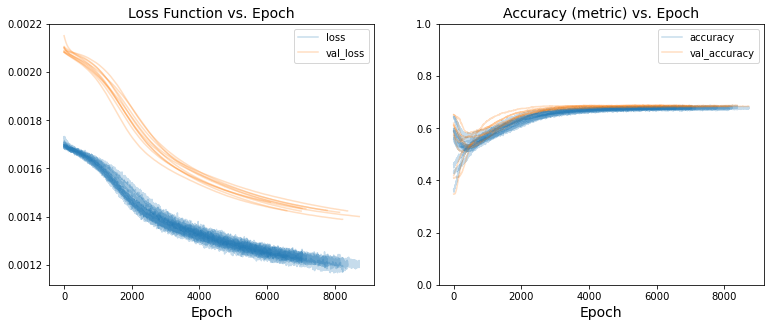

In [36]:
plt.figure(figsize=[2*6.4,1*4.8])

for i in range(n_models):
    
    this_NN = v_classifier[i]
    this_history = v_history[i]

    # Plot the significances with their error bars:
    ax = plt.subplot(1, 2, 1)
    # plt.figure()
    plt.title("Loss Function vs. Epoch", fontsize=14)
    plt.plot(this_history.history['loss'], alpha=0.25, color='C0')
    plt.plot(this_history.history['val_loss'], alpha=0.25, color='C1')
    plt.legend(['loss','val_loss'])
    plt.xlabel('Epoch', fontsize=14)
    # plt.ylabel('Loss', fontsize=14)
    
    # plt.yscale('log')

    ax = plt.subplot(1, 2, 2)
    # plt.figure()
    plt.title("Accuracy (metric) vs. Epoch", fontsize=14)
    plt.plot(this_history.history['accuracy'], alpha=0.25, color='C0')
    plt.plot(this_history.history['val_accuracy'], alpha=0.25, color='C1')
    plt.legend(['accuracy','val_accuracy'])
    plt.xlabel('Epoch', fontsize=14)
    plt.ylim([0,1])
    # plt.ylabel('Accuracy', fontsize=14)

plt.savefig('plots/loss_accuracy_{}.pdf'.format(name))
plt.show()

Add some variables

In [20]:
pred_columns = [c for c in x_test_results if c.startswith('pred')]
x_test_results['mean_pred'] = np.mean(x_test_results[pred_columns], axis=1)
x_test_results['is_signal'] = y_test
# Add the real weights back:
x_test_results['wgt'] = np.array(wgt_test)
x_test_results['SR'] = np.array(SR_test)
x_test_results['y'] = np.array(y_test)

x_train_results = x_train.copy()
x_train_results['pred'] = classifier.predict(x_train, batch_size=10000)
x_train_results['wgt'] = np.array(wgt_train) # wgt_train preserves the original weights, and shuffled
x_train_results['SR'] = np.array(SR_train)
x_train_results['y'] = np.array(y_train)

Plot yield vs NN output

# Normalized signal / background plot

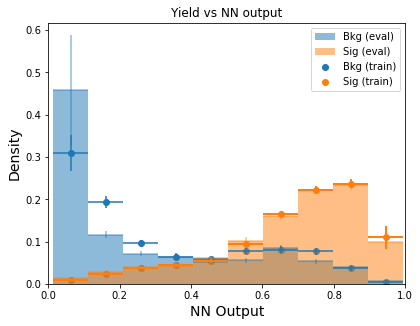

In [27]:
plt.figure(figsize=[1*6.4,1*4.8])

# BACKGROUND
# plt.subplot(1,2,1)
plt.title("Yield vs NN output")

n_bg_test = sum(wgt_test[y_test == 0])
n_bg_train = sum(wgt_train[y_train == 0])

n, b, _ = plt.hist(x_test_results[y_test == 0].mean_pred, bins=10, alpha=0.5, label='Bkg (eval)', 
                   weights = wgt_test[y_test == 0]/n_bg_test)
bin_centers = (b[:-1]+b[1:])/2
train_bg_bin_y = np.histogram(x_train_results[y_train == 0].pred, bins=b, 
                              weights = wgt_train[y_train == 0]/n_bg_train)[0]
scatter = plt.scatter(bin_centers, train_bg_bin_y, label='Bkg (train)')
plt.xlim([0,1])
# to plot error bars:
sumw2 = np.histogram(x_test_results[y_test == 0].mean_pred, bins=b, 
                              weights = (wgt_test[y_test == 0]/n_bg_test)**2)[0]
bin_widths  = (b[1:]-b[:-1])/2
plt.errorbar(x=bin_centers, y=n, xerr=bin_widths, yerr=np.sqrt(sumw2), fmt=' ', color='C0', alpha=0.5)
# to plot error bars:
sumw2 = np.histogram(x_train_results[y_train == 0].pred, bins=b, 
                              weights = (wgt_train[y_train == 0]/n_bg_train)**2)[0]
bin_widths  = (b[1:]-b[:-1])/2
plt.errorbar(x=bin_centers, y=scatter.get_offsets().data[:,1], xerr=bin_widths, yerr=np.sqrt(sumw2), fmt=' ', color='C0')


plt.xlabel('NN Output', fontsize=14)
plt.ylabel('Yield', fontsize=14)
plt.legend()

# USING N(ENTRIES):
# ax = plt.subplot(1,2,2)
# plt.title("Signal Yield vs NN output")

n_sig_test = sum(wgt_test[y_test == 1])
n_sig_train = sum(wgt_train[y_train == 1])

n, b, _ = plt.hist(x_test_results[y_test == 1].mean_pred, bins=b, alpha=0.5, label='Sig (eval)', 
                   weights = wgt_test[y_test == 1]/n_sig_test, color='C1', linewidth=0)
bin_centers = (b[:-1]+b[1:])/2
train_sig_bin_y = np.histogram(x_train_results[y_train == 1].pred, bins=b, 
                              weights = wgt_train[y_train == 1]/n_sig_train)[0]
scatter = plt.scatter(bin_centers, train_sig_bin_y, label='Sig (train)', color='C1')
# to plot error bars:
sumw2 = np.histogram(x_test_results[y_test == 1].mean_pred, bins=b, 
                              weights = (wgt_test[y_test == 1]/n_sig_test)**2)[0]
bin_widths  = (b[1:]-b[:-1])/2
plt.errorbar(x=bin_centers, y=n, xerr=bin_widths, yerr=np.sqrt(sumw2), fmt=' ', color='C1', alpha=0.5)
# to plot error bars:
sumw2 = np.histogram(x_train_results[y_train == 1].pred, bins=b, 
                              weights = (wgt_train[y_train == 1]/n_sig_train)**2)[0]
plt.errorbar(x=bin_centers, y=scatter.get_offsets().data[:,1], xerr=bin_widths, yerr=np.sqrt(sumw2), 
             fmt=' ', color='C1', linewidth=2)

plt.xlabel('NN Output', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.xlim([0,1])
plt.ylim(0)
plt.legend()

# plt.yscale('log')

# plt.savefig('plots/plot1_together_{}.pdf'.format(name))
plt.savefig('plots/plot1_together_normalized_{}.pdf'.format(name))
# plt.savefig('plots/plot1_together_normalized_log_{}.pdf'.format(name))

# plt.savefig('plots/2021-12-11_batch_' + str(batch_size) + '.pdf')
plt.show()

In [22]:
print(sum(wgt_test[y_test == 0]))
print(sum(wgt_train[y_train == 0]))

print(sum(wgt_test[y_test == 1]))
print(sum(wgt_train[y_train == 1]))

17.7056825368778
13.694594015545796
3.150603708438059
3.2077796566545227


0.7268998515130111


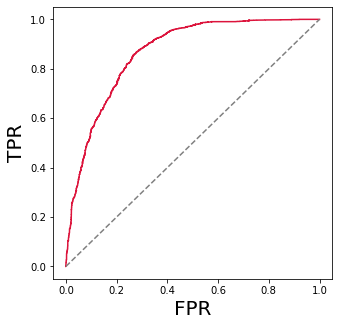

In [23]:
plt.figure(figsize=(5, 5))

# for c in ['pred_0', 'mean_pred']:
#     fpr, tpr, _ = roc_curve(y_test, x_test_results[c], sample_weight=w_test)

#     plt.plot(fpr, tpr)
    
for c in ['mean_pred']:
    fpr, tpr, _ = roc_curve(y_test, x_test_results[c], sample_weight=w_test)

    plt.plot(fpr, tpr, ls='-', color='crimson')
        
plt.plot([0, 1], [0, 1], ls='--', color='grey')
plt.xlabel('FPR', fontsize=20)
plt.ylabel('TPR', fontsize=20)
plt.savefig('plots/ROC_{}.pdf'.format(name))

print(sum(tpr)/len(fpr))

plt.show()

# Finder of best cut in each signal region

In [33]:
print('Finding the best NN cut in each separate signal region:')
print()


best_significances = []
best_cuts = []

# for plotting:
list_cuts = [[],[],[]]
list_significances = [[],[],[]]
list_significance_errors = [[],[],[]]
list_signal_yields = [[],[],[]]
list_signal_yield_errors = [[],[],[]]
list_background_yields = [[],[],[]]
list_background_yield_errors = [[],[],[]]

for i in [0,1,2]:
    
    if (i==0): 
        print("---- In the region SF-inZ ----")
    if (i==1): 
        print("---- In the region SF-noZ ----")
    if (i==2): 
        print("---- In the region DF ----")
        
    best_cut = 0
    maximum_significance = 0
    maximum_significance_error = 0
    best_S = 0
    best_dS = 0
    best_B = 0
    best_dB = 0

    data_passed_cut = x_test_results[x_test_results.SR==i]

    for x in np.linspace(0,0.99,200):
        cut = x
        data_passed_cut = data_passed_cut[data_passed_cut.mean_pred >= cut]
        sig_passed_cut = data_passed_cut[data_passed_cut.is_signal == 1]
        bg_passed_cut = data_passed_cut[data_passed_cut.is_signal == 0]

        n_sig_passed_cut = sum(sig_passed_cut.wgt)
        n_bg_passed_cut = sum(bg_passed_cut.wgt)

        S, dS  = yield_and_error(sig_passed_cut)
        B, dB  = yield_and_error(bg_passed_cut)
            
        if (S<0):
            continue
        if (B<0):
            print(B)
            continue
#         if (S+B<10/4):
#             continue
        significance, error = significance_and_error(S, dS, B, dB)
        
        list_cuts[i].append(cut)
        list_significances[i].append(significance)
        list_significance_errors[i].append(error)
        list_signal_yields[i].append(S)
        list_signal_yield_errors[i].append(dS)
        list_background_yields[i].append(B)
        list_background_yield_errors[i].append(dB)
        
        if (cut == 0):
            print('Original yields:')
            print(' S: %.2f ± %.2f events'%(S,dS))
            print(' B: %.2f ± %.2f events'%(B,dB))
            print(' Significance = %.2f ± %.2f'%(significance, error))
            print()
            
        if ( (S+B) > (10/4)):
            if (significance > maximum_significance):
                best_cut = cut
                maximum_significance = significance
                maximum_significance_error = error
                best_S = S
                best_dS = dS
                best_B = B
                best_dB = dB
            
    best_significances.append((maximum_significance, maximum_significance_error))
    best_cuts.append(best_cut)

    print('Best NN cut: %.3f'%(best_cut))
    print('New yields:')
    print(' S: %.2f ± %.2f events'%(best_S,best_dS))
    print(' B: %.2f ± %.2f events'%(best_B,best_dB))
    print(' Significance = %.2f ± %.2f'%(maximum_significance, maximum_significance_error))
    print("------------------------------")
    print()
    
    
print("---- In quadrature ----")


temporal = []

for i in [0,1,2]:
    maximum_significance = 0
    maximum_significance_error = 0
    best_S = 0
    best_dS = 0
    best_B = 0
    best_dB = 0

    data_passed_cut = x_test_results[x_test_results.SR==i]
    sig_passed_cut = data_passed_cut[data_passed_cut.is_signal == 1]
    bg_passed_cut = data_passed_cut[data_passed_cut.is_signal == 0]

    S, dS  = yield_and_error(sig_passed_cut)
    B, dB  = yield_and_error(bg_passed_cut)
    
    temporal.append((significance_and_error(S, dS, B, dB)))

old_quad, old_quad_error = add_in_quadrature_3(temporal[0], temporal[1], temporal[2]) 
print("Old significance = {:.2f} ± {:.2f} ".format(old_quad, old_quad_error))

best_quad, best_quad_error = add_in_quadrature_3(best_significances[0], best_significances[1], best_significances[2]) 
print("Best significance = {:.2f} ± {:.2f} ".format(best_quad, best_quad_error))

Finding the best NN cut in each separate signal region:

---- In the region SF-inZ ----
Original yields:
 S: 0.00 ± 0.00 events
 B: 0.00 ± 0.00 events
 Significance = 0.00 ± 0.00

Best NN cut: 0.000
New yields:
 S: 0.00 ± 0.00 events
 B: 0.00 ± 0.00 events
 Significance = 0.00 ± 0.00
------------------------------

---- In the region SF-noZ ----
Original yields:
 S: 0.00 ± 0.00 events
 B: 0.00 ± 0.00 events
 Significance = 0.00 ± 0.00

Best NN cut: 0.000
New yields:
 S: 0.00 ± 0.00 events
 B: 0.00 ± 0.00 events
 Significance = 0.00 ± 0.00
------------------------------

---- In the region DF ----
Original yields:
 S: 3.15 ± 0.07 events
 B: 17.71 ± 2.32 events
 Significance = 0.73 ± 0.05

Best NN cut: 0.701
New yields:
 S: 1.74 ± 0.05 events
 B: 1.77 ± 0.14 events
 Significance = 1.15 ± 0.05
------------------------------

---- In quadrature ----
Old significance = 0.73 ± 0.05 
Best significance = 1.15 ± 0.05 


# END

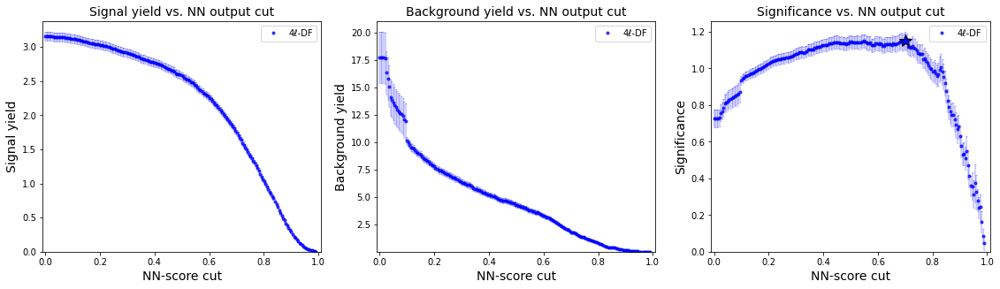

In [34]:
plt.figure(figsize=[3*6.4,1*4.8])

# Plot the significances with their error bars:
ax = plt.subplot(1, 3, 3)
# plt.figure(figsize=[1.5*6.4,1.5*4.8])
plt.title('Significance vs. NN output cut', fontsize=14)
plt.xlabel('NN-score cut', fontsize=14)
plt.ylabel('Significance', fontsize=14)
plt.errorbar(list_cuts[2],list_significances[2], yerr=list_significance_errors[2],
             fmt=' ', capsize=1, color='blue', alpha=0.25)
plt.plot(list_cuts[2],list_significances[2], 'o', markersize = 3, color='blue', alpha=0.75)
plt.legend(['4ℓ-DF'])
# Plot the maximums:
plt.plot(best_cuts[2], best_significances[2][0],'*', color='blue', fillstyle='full', 
         markeredgecolor='black', markersize=15)
plt.ylim(0)
plt.xlim([-0.01,1.01])
# plt.savefig('20211201.pdf')
# plt.show()

# Plot the signal yields with their error bars:
ax = plt.subplot(1, 3, 1)
# plt.figure(figsize=[1.5*6.4,1.5*4.8])
plt.title('Signal yield vs. NN output cut', fontsize=14)
plt.xlabel('NN-score cut', fontsize=14)
plt.ylabel('Signal yield', fontsize=14)
plt.errorbar(list_cuts[2],list_signal_yields[2], yerr=list_signal_yield_errors[2], 
             fmt=' ', capsize=1, color='blue', alpha=0.25)
plt.plot(list_cuts[2],list_signal_yields[2], 'o', markersize = 3, color='blue', alpha=0.75)
plt.ylim(0)
plt.xlim([-0.01,1.01])
plt.legend(['4ℓ-DF'])

# Plot the background yields with their error bars:
ax = plt.subplot(1, 3, 2)
# plt.figure(figsize=[1.5*6.4,1.5*4.8])
plt.title('Background yield vs. NN output cut', fontsize=14)
plt.xlabel('NN-score cut', fontsize=14)
plt.ylabel('Background yield', fontsize=14)
plt.errorbar(list_cuts[2],list_background_yields[2], yerr=list_background_yield_errors[2], 
             fmt=' ', capsize=1, color='blue', alpha=0.25)
plt.plot(list_cuts[2],list_background_yields[2], 'o', markersize = 3, color='blue', alpha=0.75)
plt.ylim(0.0001)
plt.xlim([-0.01,1.01])
# plt.yscale('log')
plt.legend(['4ℓ-DF'])

plt.savefig('plots/x_plot2_{}.pdf'.format(name))
plt.show()

## Plot weight distribution in some samples separated by physics process

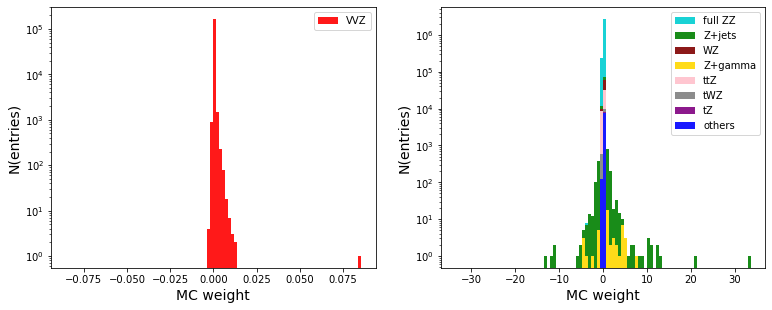

In [67]:
VVZ     = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_VVZ.arrow')
ZZ       = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_ZZ.arrow')
WZ       = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_WZ.arrow')
Zjets_new  = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_Zjets.arrow')
Zgamma = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_Zgamma.arrow')
ttZ    = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_ttZ.arrow')
tZ     = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_tZ.arrow')
tWZ    = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_tWZ.arrow')
others = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_others.arrow')
FULLBG = pd.read_feather('/home/grabanal/minitree/20211129_no_iso_FULLBG.arrow')

# VVZ     = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_VVZ.arrow')
# ZZ       = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_ZZ.arrow')
# WZ       = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_WZ.arrow')
# Zjets_new  = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_Zjets.arrow')
# Zgamma = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_Zgamma.arrow')
# ttZ    = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_ttZ.arrow')
# tZ     = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_tZ.arrow')
# tWZ    = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_tWZ.arrow')
# others = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_others.arrow')
# FULLBG = pd.read_feather('/home/grabanal/minitree/20211129_iso_e4m1_FULLBG.arrow')


individual_backgrounds = [ZZ, WZ, Zjets_new, Zgamma, ttZ, tZ, tWZ, others]

order = [others, tZ, tWZ, ttZ, Zgamma, WZ, Zjets_new, ZZ]


plt.figure(figsize=[2*6.4,1*4.8])
variable, denom, my_range, my_bins = 'wgt', 1, (-30,30), 100
my_alpha = 0.9



ax = plt.subplot(1, 2, 1)
plt.xlabel('MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)
max_wgt = np.maximum( abs(np.min(VVZ['wgt'])), np.max(VVZ['wgt']) ) 
my_range = (-max_wgt,max_wgt)
n, bins, patches = plt.hist(VVZ[variable]/denom, range=my_range,
                            bins=my_bins, alpha=my_alpha, color='red', label='VVZ')
ax.legend(['VVZ'])
plt.yscale('log')
    

    
ax = plt.subplot(1, 2, 2)
plt.xlabel('MC weight', fontsize=14)
plt.ylabel('N(entries)', fontsize=14)
colors = ('blue','purple','grey','pink', 'gold', 'maroon','green','darkturquoise')
labels = ('others', 'tZ', 'tWZ', 'ttZ', 'Z+gamma', 'WZ', 'Z+jets', 'full ZZ')
max_wgt = np.maximum( abs(np.min(FULLBG['wgt'])), np.max(FULLBG['wgt']) ) 
my_range = (-max_wgt,max_wgt)
n, bins, patches = plt.hist( (order[0][variable]/denom, 
                             order[1][variable]/denom,
                             order[2][variable]/denom,
                             order[3][variable]/denom,
                             order[4][variable]/denom,
                             order[5][variable]/denom,
                             order[6][variable]/denom,
                             order[7][variable]/denom),
                            range=my_range, 
                            bins=my_bins, alpha=my_alpha, 
                            color=colors, label=labels, stacked=True)
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), loc='best')
plt.yscale('log')

plt.savefig('plots/this.pdf')
plt.show()

In [46]:
max_wgt = np.maximum( abs(np.min(FULLBG['wgt'])), np.max(FULLBG['wgt']) )
max_wgt

33.633478207783135

In [47]:
abs(np.min(FULLBG['wgt']))

12.864305480738405

In [48]:
np.max(FULLBG['wgt'])

33.633478207783135

 end of notebook

# Test of Keras tuner

In [273]:
# Fit ML classifier
EPOCHS = 1000
batch_size = 1000
num_nodes = 64 # where is this used?
dropout = 0.1
# learning_rate = 

n_models = 1

x_test_results = x_test.copy()

def model_builder(hp):
    
#     model = keras.Sequential()
#     model.add(keras.layers.Flatten(input_shape=(28, 28)))

#     # Tune the number of units in the first Dense layer
#     # Choose an optimal value between 32-512
#     hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
#     model.add(keras.layers.Dense(units=hp_units, activation='relu'))
#     model.add(keras.layers.Dense(10))

#     # Tune the learning rate for the optimizer
#     # Choose an optimal value from 0.01, 0.001, or 0.0001
#     hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

#     model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
#                 loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
#                 metrics=['accuracy'])

#     return model

    classifier = Sequential()
    # Tune the number of units in the first Dense layer
    # Choose an optimal value between 32-512
    hp_units_1 = hp.Int('units_1', min_value=10, max_value=100, step=10)
    classifier.add(Dense(units=hp_units_1, input_dim=x_train.shape[1], activation='relu')) 
    classifier.add(Dropout(dropout))
    hp_units_2 = hp.Int('units_2', min_value=10, max_value=100, step=10)
    classifier.add(Dense(units=hp_units_2, activation='relu'))
    classifier.add(Dropout(dropout))
    hp_units_3 = hp.Int('units_3', min_value=10, max_value=100, step=10)
    classifier.add(Dense(units=hp_units_3, activation='relu'))
    classifier.add(Dropout(dropout))
#     hp_units_4 = hp.Int('units_4', min_value=2, max_value=2, step=1)
#     classifier.add(Dense(units=hp_units_4, activation='relu'))
#     classifier.add(Dropout(dropout))
    classifier.add(Dense(1, activation='sigmoid'))
    classifier.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    # Early stopping
    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=False)

#     history = classifier.fit(x_train, y_train, epochs=EPOCHS, batch_size=batch_size,
#                              validation_data=(x_test, y_test, w_test), sample_weight=w_train, 
#                              verbose=1, callbacks=[callback])
    
#     x_test_results['pred_' + str(i)] = classifier.predict(x_test, batch_size=batch_size)
    return classifier

In [275]:
tuner = kt.Hyperband(model_builder,
                     objective='val_accuracy',
                     max_epochs=10,
                     factor=3,
                     directory='my_dir',
                     project_name='intro_to_kt_0',
                    hyperband_iterations=1)

In [276]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

In [277]:
tuner.search(x_train, y_train, epochs=EPOCHS, batch_size=batch_size, 
             validation_data=(x_test, y_test, w_test), sample_weight=w_train, 
             verbose=1, callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete.
The optimal number of units in dense layer 1 is {best_hps.get('units_1')}, 
The optimal number of units in dense layer 2 is {best_hps.get('units_2')},
The optimal number of units in dense layer 3 is {best_hps.get('units_3')}
""")

Trial 30 Complete [00h 00m 25s]
val_accuracy: 0.6669543385505676

Best val_accuracy So Far: 0.7773230075836182
Total elapsed time: 00h 05m 24s
INFO:tensorflow:Oracle triggered exit

The hyperparameter search is complete.
The optimal number of units in dense layer 1 is 100, 
The optimal number of units in dense layer 2 is 100,
The optimal number of units in dense layer 3 is 50



In [ ]:
model = tuner.hypermodel.build(best_hps)